In [15]:
## To Do

# add tau to analysis and rerun prat and some others
# table
# poster

## Setup                                                                              

In [16]:
# import tools

# standard library
import os
import types
import sys
import inspect
import yaml
import time
#import ipyparallel as ipp
import datetime

# scientific stack
import numpy as np
#import jax.numpy as jnp
import scipy
from scipy.stats import linregress
from scipy.integrate import simpson
from scipy.ndimage import gaussian_filter1d
from scipy.interpolate import CubicSpline, interp1d
from scipy.optimize import curve_fit
import pandas as pd

# cosmology
#import astropy
#import astropy.units as units
#from astropy.cosmology import LambdaCDM, w0waCDM
import pyccl as ccl
import camb
from camb import model, initialpower
#import classy
#from cosmopower_jax.cosmopower_jax import CosmoPowerJAX as CPJ
import warnings
#warnings.filterwarnings('ignore')
#import jax; jax.config.update('jax_platform_name', 'cpu')
#import desilike
#from desilike.theories.galaxy_clustering import StandardPowerSpectrumTemplate
#from desilike.likelihoods.base import BaseLikelihood
#from desilike.likelihoods.base import BaseGaussianLikelihood
#from desilike.likelihoods.base import ObservablesGaussianLikelihood
#from desilike.fisher import Fisher

# plotting
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import LogNorm
from matplotlib.patches import Ellipse
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import display, Markdown, HTML
#from tabulate import tabulate

# inference / sampling
#import cobaya
#from cobaya.run import run as cobaya_run
#from cobaya.likelihood import Likelihood
#from cobaya.model import get_model
#from cobaya_utilities import fisher
#import getdist
#import getdist.plots as plots
#from getdist import plots, MCSamples
#from getdist.mcsamples import MCSamples
#from getdist.mcsamples import loadMCSamples
#from getdist.gaussian_mixtures import GaussianND

# notebook only (remove if this becomes a .py module)
%matplotlib inline

import logging
import warnings

# Suppress Matplotlib font warning logs
logging.getLogger('matplotlib.font_manager').setLevel(logging.ERROR)

# Or suppress warnings generally
warnings.filterwarnings('ignore', category=UserWarning, module='matplotlib')

In [17]:
# import custom helper functions and classes

# functions
from functions_and_classes import calculate_and_plot_Cls
from functions_and_classes import build_tracers_from_data
from functions_and_classes import build_tracer_dict
from functions_and_classes import build_noise_dict
from functions_and_classes import build_spectra_dict
from functions_and_classes import build_data_vector
from functions_and_classes import create_simplified_desired_pairs
from functions_and_classes import build_covariance_from_data
from functions_and_classes import plot_covariance_matrix
from functions_and_classes import plot_spectra_from_dict
from functions_and_classes import make_Pk2D
from functions_and_classes import predict_linear_Pk
from functions_and_classes import predict_boost_Pk
from functions_and_classes import project_fisher_matrix
from functions_and_classes import get_partial_derivative
from functions_and_classes import sample_fisher_with_uniform_priors
from functions_and_classes import plot_Fisher_from_matrices

# classes
from functions_and_classes import ForecastMap
from functions_and_classes import CovarianceMatrix
from functions_and_classes import FisherForecaster

In [18]:
# cosmologies and priors -- all values from DESI DR2 Chains, DESI+CMB or, if available, DESI+CMB+DESY5

# flat LCDM
# values taken from Planck 2018 TT, TE, EE+lowE
Omega_b = 0.04807
Omega_c = 0.2532
Omega_k = 0
w0 = -1
wa = 0
h = 0.6817
n_s = 0.9693
A_s = 2.122e-9
Neff = 3.046 # SM prediction
m_nu = 0.06
T_CMB = 2.7255
flat_LCDM_cosmology = ccl.Cosmology(Omega_c=Omega_c, Omega_b=Omega_b, Omega_k=Omega_k, h=h, A_s=A_s, n_s=n_s, w0=w0, wa=wa, T_CMB=T_CMB,
                               Neff = Neff, m_nu = m_nu, transfer_function='boltzmann_camb',
                               extra_parameters={"camb": {"dark_energy_model": "ppf"}})

# curved LCDM
Omega_b = 0.04735
Omega_c = 0.2547
Omega_k = 0.00231
w0 = -1
wa = 0
h = 0.6850
n_s = 0.9649
A_s = 2.115e-9
Neff = 3.046 # SM prediction
m_nu = 0.06
T_CMB = 2.7255
curved_LCDM_cosmology = ccl.Cosmology(Omega_c=Omega_c, Omega_b=Omega_b, Omega_k=Omega_k, h=h, A_s=A_s, n_s=n_s, w0=w0, wa=wa, T_CMB=T_CMB,
                               Neff = Neff, m_nu = m_nu, transfer_function='boltzmann_camb',
                               extra_parameters={"camb": {"dark_energy_model": "ppf"}})

# flat wCDM
Omega_b = 0.04929
Omega_c = 0.2591
Omega_k = 0
w0 = -0.9706
wa = 0
h = 0.6734
n_s = 0.9699
A_s = 2.127e-9
Neff = 3.046 # SM prediction
m_nu = 0.06
T_CMB = 2.7255
flat_wCDM_cosmology = ccl.Cosmology(Omega_c=Omega_c, Omega_b=Omega_b, Omega_k=Omega_k, h=h, A_s=A_s, n_s=n_s, w0=w0, wa=wa, T_CMB=T_CMB,
                               Neff = Neff, m_nu = m_nu, transfer_function='boltzmann_camb',
                               extra_parameters={"camb": {"dark_energy_model": "ppf"}})


# flat w0wa
Omega_b = 0.04991
Omega_c = 0.2676
Omega_k = 0
w0 = -0.7521
wa = -0.8611
h = 0.6674
n_s = 0.9654
A_s = 2.094e-9
Neff = 3.046 # SM prediction
m_nu = 0.06
T_CMB = 2.7255
flat_w0waCDM_cosmology = ccl.Cosmology(Omega_c=Omega_c, Omega_b=Omega_b, Omega_k=Omega_k, h=h, A_s=A_s, n_s=n_s, w0=w0, wa=wa, T_CMB=T_CMB,
                               Neff = Neff, m_nu = m_nu, transfer_function='boltzmann_camb',
                               extra_parameters={"camb": {"dark_energy_model": "ppf"}})

# curved w0wa
Omega_b = 0.04974
Omega_c = 0.2680
Omega_k = 0.00077
w0 = -0.7621
wa = -0.8073
h = 0.6682
n_s = 0.9644
A_s = 2.095e-9
Neff = 3.046 # SM prediction
m_nu = 0.06
T_CMB = 2.7255
curved_w0waCDM_cosmology = ccl.Cosmology(Omega_c=Omega_c, Omega_b=Omega_b, Omega_k=Omega_k, h=h, A_s=A_s, n_s=n_s, w0=w0, wa=wa, T_CMB=T_CMB,
                               Neff = Neff, m_nu = m_nu, transfer_function='boltzmann_camb',
                               extra_parameters={"camb": {"dark_energy_model": "ppf"}})

# define prior
# all priors taken from Planck unless otherwise stated (https://arxiv.org/pdf/1303.5076)
uniform_prior = {
    'Omega_c': (0.1, 0.9), # not Planck prior given, prior self chosen
    'wa': (-3, 3),         # wider than Planck prior by 1 in each direction
    'w0': (-3, -0.3),
    'A_s': (1.48797e-9, 5.45981e-9),
    'h': (0.2, 1.0),
    'Omega_b': (0.011, 0.221),
    'n_s': (0.9, 1.1),
    'Omega_k': (-0.3, 0.3),
    'm_nu': (0, 5)
}

## Data and Noise

In [19]:
# LRG data

filenames = [
    "data/LRGz1_dNdz.txt",
    "data/LRGz2_dNdz.txt",
    "data/LRGz3_dNdz.txt",
    "data/LRGz4_dNdz.txt",
]

# 1. Load the first file to establish the shared redshift array z
data_0 = np.loadtxt(filenames[0])
z = data_0[:, 0]

# List to collect normalized distributions
normalized_bins = []

for file in filenames:
  file_path = file
  data = np.loadtxt(file_path)
  dNdz = data[:, 1]

  # Normalize distribution
  area = simpson(dNdz, x=z)
  dNdz_norm = dNdz / area
  normalized_bins.append(dNdz_norm)

# 2. Stack z and all normalized bins into a single 2D array (shape: [N, 5])
lrg_combined_array = np.column_stack([z] + normalized_bins)

# Print shape check (e.g., (100, 5))
print("Combined LRG array shape:", lrg_combined_array.shape)


Combined LRG array shape: (149, 5)


In [20]:
# BGS data

# 1. Define redshift array
z = np.linspace(0.0, 0.6, 600)

# Gaussian function
def gaussian_nz(z, mu, sigma):
  return (1.0 / (sigma * np.sqrt(2 * np.pi))) * np.exp(
      -0.5 * ((z - mu) / sigma) ** 2
  )


# 2. Compute the 1D n(z) distributions
z_eff_1, sigma_1 = 0.211, 0.06
z_eff_2, sigma_2 = 0.352, 0.05

nz_bgs1 = gaussian_nz(z, z_eff_1, sigma_1)
nz_bgs2 = gaussian_nz(z, z_eff_2, sigma_2)

# 3. Stack into 2-column arrays (Column 0: redshift z, Column 1: dN/dz)
bgs1_array = np.column_stack((z, nz_bgs1))
bgs2_array = np.column_stack((z, nz_bgs2))

# Check shapes (should be (600, 2))
print("BGS 1 array shape:", bgs1_array.shape)
print("BGS 2 array shape:", bgs2_array.shape)

import numpy as np

# Stack z, nz_bgs1, and nz_bgs2 as columns
bgs_combined_array = np.column_stack((z, nz_bgs1, nz_bgs2))

# Verify shape (should print (600, 3))
print("Combined array shape:", bgs_combined_array.shape)

BGS 1 array shape: (600, 2)
BGS 2 array shape: (600, 2)
Combined array shape: (600, 3)


In [21]:
# HSC and DES source data

# HSC
HSC_dist_0_3 = np.load("data/distributions_0.3_3_vF.npz")
print(f"Keys in distributions_0.3_3_vF.npz: {HSC_dist_0_3.files}")

HSC_dist_1_5 = np.load("data/distributions_1_5_vF.npz")
print(f"Keys in distributions_1_5_vF.npz: {HSC_dist_1_5.files}")

HSC_dist_0_3_a = np.load("data/distributions_0.3_3_vF.npz")['1/nz_mean']
HSC_dist_0_3_b = np.load("data/distributions_0.3_3_vF.npz")['2/nz_mean']
HSC_dist_0_3_c = np.load("data/distributions_0.3_3_vF.npz")['3/nz_mean']
HSC_dist_0_3_d = np.load("data/distributions_0.3_3_vF.npz")['4/nz_mean']
HSC_dist_0_3_z = np.load("data/distributions_0.3_3_vF.npz")['z']
HSC_dist_0_3 = np.column_stack((HSC_dist_0_3_z, HSC_dist_0_3_a, HSC_dist_0_3_b, HSC_dist_0_3_c, HSC_dist_0_3_d)) # make into 2D array for easy processing

HSC_dist_1_5_a = np.load("data/distributions_1_5_vF.npz")['1/nz_mean']
HSC_dist_1_5_b = np.load("data/distributions_1_5_vF.npz")['2/nz_mean']
HSC_dist_1_5_c = np.load("data/distributions_1_5_vF.npz")['3/nz_mean']
HSC_dist_1_5_d = np.load("data/distributions_1_5_vF.npz")['4/nz_mean']
HSC_dist_1_5_z = np.load("data/distributions_1_5_vF.npz")['z']
HSC_dist_1_5 = np.column_stack((HSC_dist_1_5_z, HSC_dist_1_5_a, HSC_dist_1_5_b, HSC_dist_1_5_c, HSC_dist_1_5_d)) # make into 2D array for easy processing

# DES Source Data

DES_source_data = np.loadtxt("data/des_nz_gamma.txt")

DES_source_data = DES_source_data[7:]  # removes the first 7 values (headers)
DES_source_data = DES_source_data.reshape(-1, 6) #shape into array with columns z, nz0 -- nz4

# Split into separate arrays
DES_source_z    = DES_source_data[:, 0]
DES_source_nz_a = DES_source_data[:, 1]
DES_source_nz_b = DES_source_data[:, 2]
DES_source_nz_c = DES_source_data[:, 3]
DES_source_nz_d = DES_source_data[:, 4]
#DES_source_nz_e = DES_source_data[:, 5]

DES_source_data = np.column_stack((DES_source_z, DES_source_nz_a, DES_source_nz_b, DES_source_nz_c, DES_source_nz_d))

Keys in distributions_0.3_3_vF.npz: ['z', '1/nz_median', '1/nz_mean', '1/nz_lower', '1/nz_upper', '1/nz_median_mu', '1/nz_mean_mu', '1/nz_lower_mu', '1/nz_upper_mu', '2/nz_median', '2/nz_mean', '2/nz_lower', '2/nz_upper', '2/nz_median_mu', '2/nz_mean_mu', '2/nz_lower_mu', '2/nz_upper_mu', '3/nz_median', '3/nz_mean', '3/nz_lower', '3/nz_upper', '3/nz_median_mu', '3/nz_mean_mu', '3/nz_lower_mu', '3/nz_upper_mu', '4/nz_median', '4/nz_mean', '4/nz_lower', '4/nz_upper', '4/nz_median_mu', '4/nz_mean_mu', '4/nz_lower_mu', '4/nz_upper_mu']
Keys in distributions_1_5_vF.npz: ['z', '1/nz_median', '1/nz_mean', '1/nz_lower', '1/nz_upper', '1/nz_median_mu', '1/nz_mean_mu', '1/nz_lower_mu', '1/nz_upper_mu', '2/nz_median', '2/nz_mean', '2/nz_lower', '2/nz_upper', '2/nz_median_mu', '2/nz_mean_mu', '2/nz_lower_mu', '2/nz_upper_mu', '3/nz_median', '3/nz_mean', '3/nz_lower', '3/nz_upper', '3/nz_median_mu', '3/nz_mean_mu', '3/nz_lower_mu', '3/nz_upper_mu', '4/nz_median', '4/nz_mean', '4/nz_lower', '4/nz_up

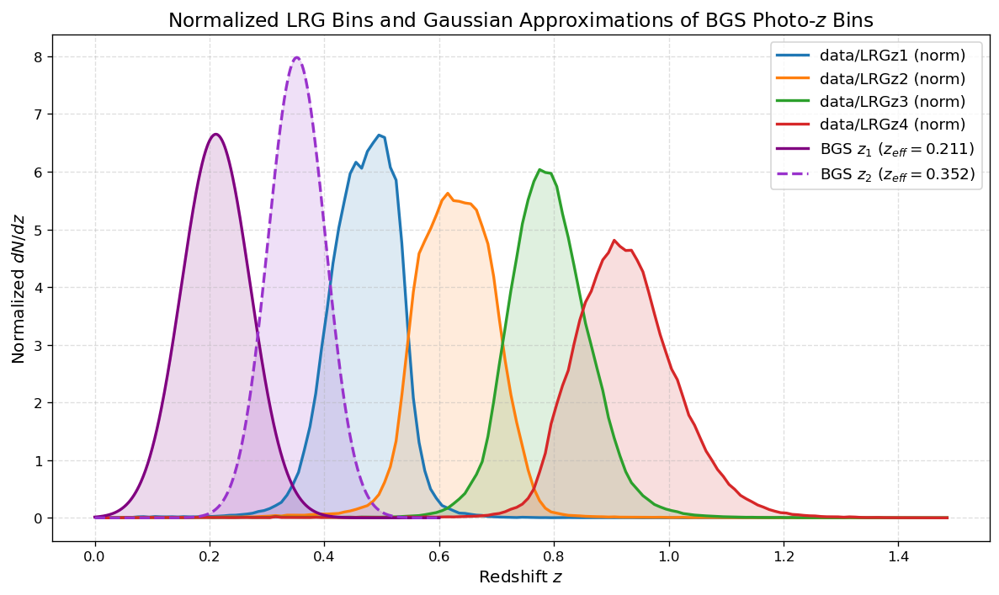

In [22]:
# plot BGS and LRG


# 3. Plot directly from the combined array
plt.figure(figsize=(10, 6), dpi=120)

for i, file in enumerate(filenames):
  label = file.split("_")[0]

  # Column 0 is z, Column i+1 is the corresponding normalized bin
  plt.plot(
      lrg_combined_array[:, 0],
      lrg_combined_array[:, i + 1],
      lw=2,
      label=f"{label} (norm)",
  )
  plt.fill_between(
      lrg_combined_array[:, 0], lrg_combined_array[:, i + 1], alpha=0.15
  )

plt.plot(
    bgs_combined_array[:, 0],
    bgs_combined_array[:, 1],
    label=f"BGS $z_1$ ($z_{{eff}}={z_eff_1}$)",
    color="purple",
    linewidth=2,
)
plt.fill_between(
    bgs_combined_array[:, 0],
    bgs_combined_array[:, 1],
    color="purple",
    alpha=0.15,
)

plt.plot(
    bgs_combined_array[:, 0],
    bgs_combined_array[:, 2],
    label=f"BGS $z_2$ ($z_{{eff}}={z_eff_2}$)",
    color="darkorchid",
    linestyle="--",
    linewidth=2,
)
plt.fill_between(
    bgs_combined_array[:, 0],
    bgs_combined_array[:, 2],
    color="darkorchid",
    alpha=0.15,
)

plt.xlabel("Redshift $z$", fontsize=12)
plt.ylabel("Normalized $dN/dz$", fontsize=12)
plt.title("Normalized LRG Bins and Gaussian Approximations of BGS Photo-$z$ Bins", fontsize=14)
plt.grid(True, linestyle="--", alpha=0.4)
plt.legend(frameon=True, fontsize=11)

plt.tight_layout()
plt.show()

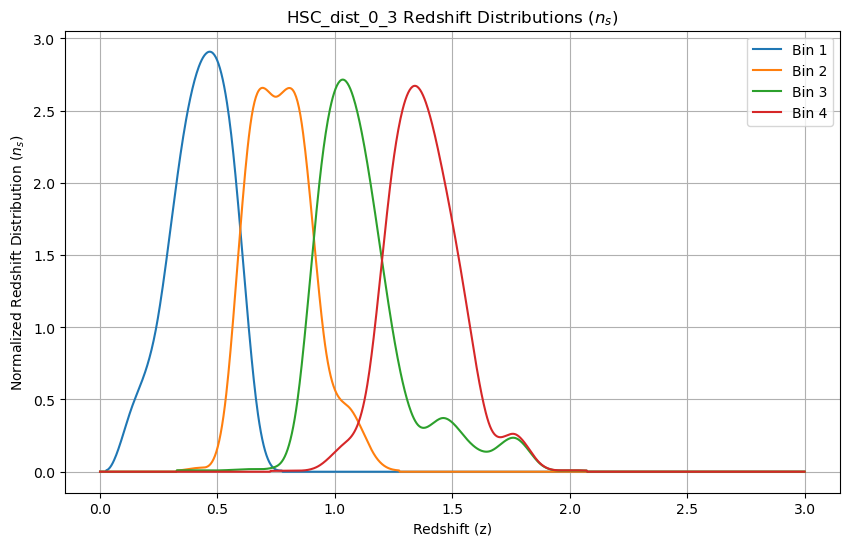

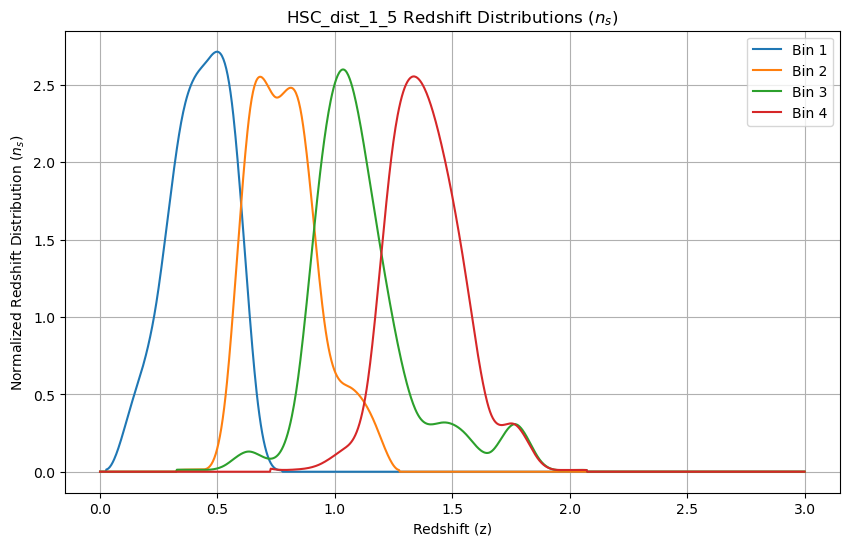

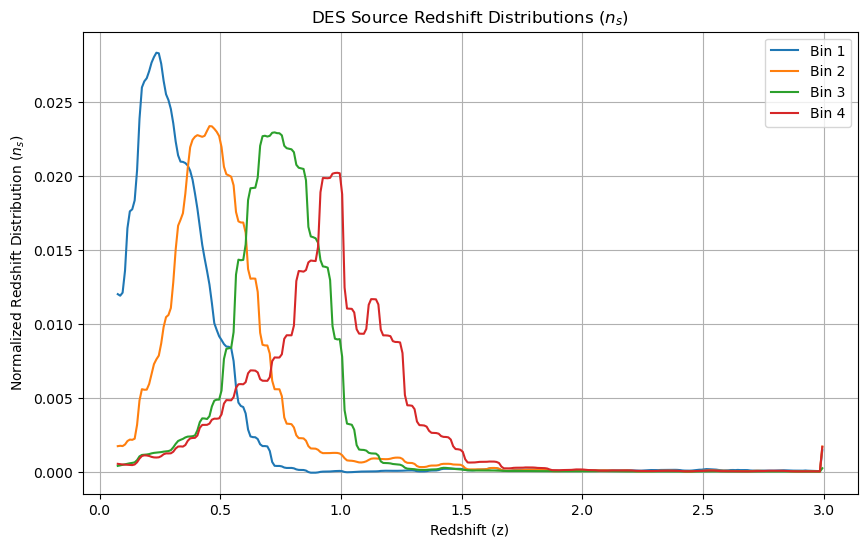

In [23]:
# graph HSC and DES source distributions

plt.figure(figsize=(10, 6))
plt.plot(HSC_dist_0_3_z, HSC_dist_0_3_a, label='Bin 1')
plt.plot(HSC_dist_0_3_z, HSC_dist_0_3_b, label='Bin 2')
plt.plot(HSC_dist_0_3_z, HSC_dist_0_3_c, label='Bin 3')
plt.plot(HSC_dist_0_3_z, HSC_dist_0_3_d, label='Bin 4')
plt.xlabel('Redshift (z)')
plt.ylabel('Normalized Redshift Distribution ($n_s$)')
plt.title('HSC_dist_0_3 Redshift Distributions ($n_s$)')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 6))
plt.plot(HSC_dist_1_5_z, HSC_dist_1_5_a, label='Bin 1')
plt.plot(HSC_dist_1_5_z, HSC_dist_1_5_b, label='Bin 2')
plt.plot(HSC_dist_1_5_z, HSC_dist_1_5_c, label='Bin 3')
plt.plot(HSC_dist_1_5_z, HSC_dist_1_5_d, label='Bin 4')
plt.xlabel('Redshift (z)')
plt.ylabel('Normalized Redshift Distribution ($n_s$)')
plt.title('HSC_dist_1_5 Redshift Distributions ($n_s$)')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 6))
plt.plot(DES_source_z, DES_source_nz_a, label='Bin 1')
plt.plot(DES_source_z, DES_source_nz_b, label='Bin 2')
plt.plot(DES_source_z, DES_source_nz_c, label='Bin 3')
plt.plot(DES_source_z, DES_source_nz_d, label='Bin 4')
#### nz_5 has values all of order e7 or above,
#### while the others have values of order e-5 or below
#### what's going on here?
plt.xlabel('Redshift (z)')
plt.ylabel('Normalized Redshift Distribution ($n_s$)')
plt.title('DES Source Redshift Distributions ($n_s$)')
plt.legend()
plt.grid(True)
plt.show()

<>:59: SyntaxWarning: invalid escape sequence '\e'
<>:62: SyntaxWarning: invalid escape sequence '\e'
<>:59: SyntaxWarning: invalid escape sequence '\e'
<>:62: SyntaxWarning: invalid escape sequence '\e'
/tmp/ipykernel_2391366/276000276.py:59: SyntaxWarning: invalid escape sequence '\e'
  plt.xlabel('Multipole, $\ell$')
/tmp/ipykernel_2391366/276000276.py:62: SyntaxWarning: invalid escape sequence '\e'
  plt.axvline(x=5000, color='red', linestyle='--', label='$\ell = 5000$') # Added vertical line


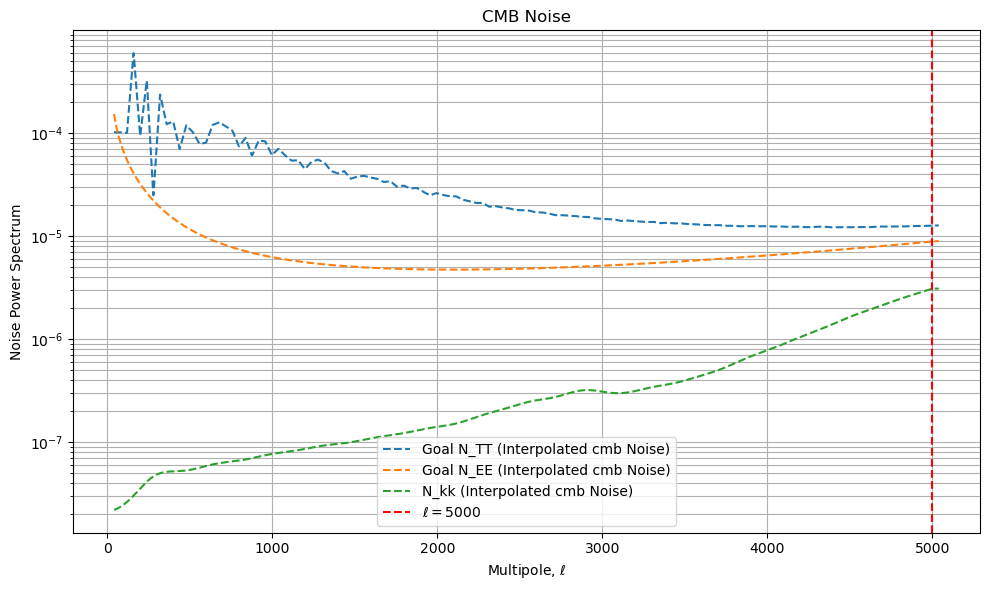

In [24]:
# build noise magnification
# shot noise ref: https://arxiv.org/pdf/2407.04607
# LRG noise ref: slack from Simone, can't find the Github itself
# DES noise ref: https://arxiv.org/html/2511.04681v2
# HSC noise ref: https://arxiv.org/pdf/2507.01386
# SO noise ref:
# magnification ref: https://arxiv.org/pdf/2503.24385

sigma = 0.26
LRG_n_bar_deg2 = np.array([81.9, 148.1, 162.4, 148.3]) # Galaxies per square degree
LRG_n_bar_steradian = LRG_n_bar_deg2 * (180.0 / np.pi)**2
HSC_n_bar_arcmin2 = np.array([3.77, 5.07, 4.00, 2.12])
HSC_n_bar_deg2 = HSC_n_bar_arcmin2 * (60 ** 2)
HSC_n_bar_steradian = HSC_n_bar_deg2 * (180.0 / np.pi)**2
DES_n_bar_arcmin2 = np.array([5.59, 5.59, 5.59, 5.59])
DES_n_bar_deg2 = DES_n_bar_arcmin2 * (60 ** 2)
DES_n_bar_steradian = DES_n_bar_deg2 * (180.0 / np.pi)**2
BGS_shot_noise = [4.63e-7, 9.18e-7]

LRG_shape_noise = np.zeros_like(LRG_n_bar_steradian)
for i in range(len(LRG_shape_noise)):
    LRG_shape_noise[i] = sigma ** 2 / LRG_n_bar_steradian[i]

HSC_shape_noise = np.zeros_like(HSC_n_bar_steradian)
for i in range(len(HSC_shape_noise)):
    HSC_shape_noise[i] = sigma ** 2 / HSC_n_bar_steradian[i]

DES_shape_noise = np.zeros_like(DES_n_bar_steradian)
for i in range(len(DES_shape_noise)):
    DES_shape_noise[i] = sigma ** 2 / DES_n_bar_steradian[i]

# cmb noise arises from idk a bunch of stuff
# we have an SO noise curve, but it does not have precisely the same ells as our C_l
# we must interpolate the N_kk to produce a useful noise curve
SO_goal_T_noise_data = np.loadtxt("data/SO_LAT_Nell_T_atmv1_goal_fsky0p4_ILC_CMB.txt")
SO_goal_T_noise_ells = SO_goal_T_noise_data[:, 0]
SO_goal_N_TT = SO_goal_T_noise_data[:, 1]
SO_goal_E_noise_data = np.loadtxt("data/SO_LAT_Nell_P_goal_fsky0p4_ILC_CMB_E.txt")
SO_goal_E_noise_ells = SO_goal_E_noise_data[:, 0]
SO_goal_N_EE = SO_goal_E_noise_data[:, 1]
SO_kk_noise_data = np.genfromtxt("data/nlkk_v3_1_0deproj0_SENS2_fsky0p4_it_lT30-3000_lP30-5000.dat")
SO_kk_noise_ells = SO_kk_noise_data[:, 0]
SO_N_kk = SO_kk_noise_data[:, 7]
ells_for_noise_interp = np.arange(40, 5000 + 40)

# Use fill_value=(N_kk[0], N_kk[-1]) to cap the noise at the boundaries
interpolated_goal_N_TT_func = interp1d(SO_goal_T_noise_ells, SO_goal_N_TT, bounds_error=False, fill_value=(SO_goal_N_TT[0], SO_goal_N_TT[-1]))
SO_goal_cmb_noise_TT = interpolated_goal_N_TT_func(ells_for_noise_interp)
interpolated_goal_N_EE_func = interp1d(SO_goal_E_noise_ells, SO_goal_N_EE, bounds_error=False, fill_value=(SO_goal_N_EE[0], SO_goal_N_EE[-1]))
SO_goal_cmb_noise_EE = interpolated_goal_N_EE_func(ells_for_noise_interp)
interpolated_N_kk_func = interp1d(SO_kk_noise_ells, SO_N_kk, bounds_error=False, fill_value=(SO_N_kk[0], SO_N_kk[-1]))
SO_cmb_noise_kk = interpolated_N_kk_func(ells_for_noise_interp)

# plot cmb noise to see what it looks like
plt.figure(figsize=(10, 6))
plt.semilogy(ells_for_noise_interp, SO_goal_cmb_noise_TT, label='Goal N_TT (Interpolated cmb Noise)', linestyle='--')
plt.semilogy(ells_for_noise_interp, SO_goal_cmb_noise_EE, label='Goal N_EE (Interpolated cmb Noise)', linestyle='--')
plt.semilogy(ells_for_noise_interp, SO_cmb_noise_kk, label='N_kk (Interpolated cmb Noise)', linestyle='--')
plt.xlabel('Multipole, $\ell$')
plt.ylabel('Noise Power Spectrum')
plt.title('CMB Noise')
plt.axvline(x=5000, color='red', linestyle='--', label='$\ell = 5000$') # Added vertical line
plt.legend()
plt.grid(True, which="both", ls="-")
plt.tight_layout()
plt.show()

<>:51: SyntaxWarning: invalid escape sequence '\D'
<>:51: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_2391366/4287248694.py:51: SyntaxWarning: invalid escape sequence '\D'
  plt.title("Shifted LRG and BGS Redshift Distributions ($\Delta z = +0.5$)", fontsize=14)


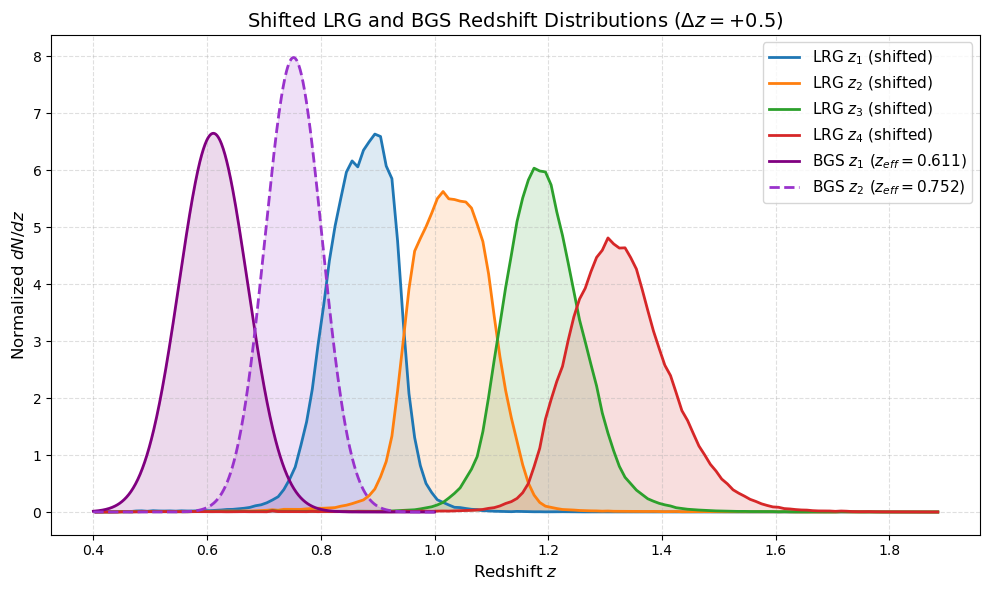

In [25]:
# artificially shift bins

dz = 0.4

# 1. Shift LRG redshift array
# Copy original LRG array and add dz to the redshift column (column 0)
lrg_shifted_array = lrg_combined_array.copy()
lrg_shifted_array[:, 0] += dz

# 2. Shift BGS redshift array
# BGS original z array shifted by dz
z_bgs_shifted = bgs_combined_array[:, 0] + dz
nz_bgs1_shifted = bgs_combined_array[:, 1]
nz_bgs2_shifted = bgs_combined_array[:, 2]

bgs_shifted_array = np.column_stack((z_bgs_shifted, nz_bgs1_shifted, nz_bgs2_shifted))

# 3. Plot shifted LRG and BGS distributions
plt.figure(figsize=(10, 6))

# Plot LRG Bins
lrg_labels = ["LRG $z_1$", "LRG $z_2$", "LRG $z_3$", "LRG $z_4$"]
for i in range(4):
    z_lrg = lrg_shifted_array[:, 0]
    nz_lrg = lrg_shifted_array[:, i + 1]
    plt.plot(z_lrg, nz_lrg, lw=2, label=f"{lrg_labels[i]} (shifted)")
    plt.fill_between(z_lrg, nz_lrg, alpha=0.15)

# Plot BGS Bins
plt.plot(
    bgs_shifted_array[:, 0],
    bgs_shifted_array[:, 1],
    label=f"BGS $z_1$ ($z_{{eff}}={z_eff_1 + dz:.3f}$)",
    color="purple",
    linewidth=2,
)
plt.fill_between(bgs_shifted_array[:, 0], bgs_shifted_array[:, 1], color="purple", alpha=0.15)

plt.plot(
    bgs_shifted_array[:, 0],
    bgs_shifted_array[:, 2],
    label=f"BGS $z_2$ ($z_{{eff}}={z_eff_2 + dz:.3f}$)",
    color="darkorchid",
    linestyle="--",
    linewidth=2,
)
plt.fill_between(bgs_shifted_array[:, 0], bgs_shifted_array[:, 2], color="darkorchid", alpha=0.15)

plt.xlabel("Redshift $z$", fontsize=12)
plt.ylabel("Normalized $dN/dz$", fontsize=12)
plt.title("Shifted LRG and BGS Redshift Distributions ($\Delta z = +0.5$)", fontsize=14)
plt.grid(True, linestyle="--", alpha=0.4)
plt.legend(frameon=True, fontsize=11)
plt.tight_layout()
plt.show()

## Bin Size Tests

### Summary Plots

In [ ]:
# plot results
binsizes = [100, 50, 20]

# 2. Dictionary for your 1-sigma errors (Y-axis) using raw strings
errors_Omega_m = {
    'Lensing Ratios': [XX, XX, XX],
    'Primaries': [.0048, 0.0043, 0.0042],
    'Lensing Ratios + Primaries': [XX, XX, XX]
}
errors_h = {
    'Lensing Ratios': [XX, XX, XX],
    'Primaries': [0.0035, 0.0032, 0.0031],
    'Lensing Ratios + Primaries': [XX, XX, XX]
}

# 3. Plotting Configuration

#omega_m, h
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6), sharex=True)
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = 'Liberation Serif'
plt.rcParams['font.size'] = 14

# Complete styling markers and colors mapping with matching raw prefixes
styles = {
    'Lensing Ratios + Primaries': {'color': '#1f77b4', 'marker': 'o', 'ls': '-'},
    'Lensing Ratios': {'color': '#ff7f0e', 'marker': 's', 'ls': '--'},
    'Primaries': {'color': '#2ca02c', 'marker': '^', 'ls': '-.'}
}

# --- Left Subplot: Omega_m Errors ---
for label, err_list in errors_Omega_m.items():
    ax1.plot(binsizes, err_list, label=label, **styles[label], lw=2, ms=8)
ax1.set_ylabel(r'1-$\sigma$ Error on $\Omega_m$', fontsize=14)
ax1.set_xlabel(r'Binsize ($\Delta \ell$)', fontsize=14)
ax1.set_title(r'Constraints on $\Omega_m$', fontsize=16)
ax1.set_xticks(binsizes)
ax1.grid(True, linestyle=':', alpha=0.6)
ax1.legend(frameon=True, fontsize=11, loc=(0.55, 0.20))

# --- Middle Subplot: h Errors ---
for label, err_list in errors_h.items():
    ax2.plot(binsizes, err_list, label=label, **styles[label], lw=2, ms=8)
ax2.set_ylabel(r'1-$\sigma$ Error on $h$', fontsize=14)
ax2.set_xlabel(r'Binsize ($\Delta \ell$)', fontsize=14)
ax2.set_title(r'Constraints on $h$', fontsize=16)
ax2.set_xticks(binsizes)
ax2.grid(True, linestyle=':', alpha=0.6)
ax2.legend(frameon=True, fontsize=11, loc=(0.55, 0.20))

plt.tight_layout()
plt.show()

In [ ]:
# plot results

binsizes = [100, 50, 20]

errors_Omega_m = {
    'Lensing Ratios': [XX, XX, XX],
    'Primaries': [0.010, 0.0094, 0.0091],
    'Lensing Ratios + Primaries': [XX, XX, XX]
}
errors_h = {
    'Lensing Ratios': [XX, XX, XX],
    'Primaries': [0.013, 0.012, 0.012],
    'Lensing Ratios + Primaries': [XX, XX, XX]
}
errors_Omega_k = {
    'Lensing Ratios': [XX, XX, XX],
    'Primaries': [0.0033, 0.0031, 0.0030],
    'Lensing Ratios + Primaries': [XX, XX, XX]
}

# 3. Plotting Configuration

#omega_m, h, omega_k
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 6), sharex=True)
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = 'Liberation Serif'
plt.rcParams['font.size'] = 14

# Complete styling markers and colors mapping with matching raw prefixes
styles = {
    'Lensing Ratios + Primaries': {'color': '#1f77b4', 'marker': 'o', 'ls': '-'},
    'Lensing Ratios': {'color': '#ff7f0e', 'marker': 's', 'ls': '--'},
    'Primaries': {'color': '#2ca02c', 'marker': '^', 'ls': '-.'}
}

# --- Left Subplot: Omega_m Errors ---
for label, err_list in errors_Omega_m.items():
    ax1.plot(binsizes, err_list, label=label, **styles[label], lw=2, ms=8)
ax1.set_ylabel(r'1-$\sigma$ Error on $\Omega_m$', fontsize=14)
ax1.set_xlabel(r'Binsize ($\Delta \ell$)', fontsize=14)
ax1.set_title(r'Constraints on $\Omega_m$', fontsize=16)
ax1.set_xticks(binsizes)
ax1.grid(True, linestyle=':', alpha=0.6)
ax1.legend(frameon=True, fontsize=11, loc=(0.55, 0.20))

# --- Middle Subplot: h Errors ---
for label, err_list in errors_h.items():
    ax2.plot(binsizes, err_list, label=label, **styles[label], lw=2, ms=8)
ax2.set_ylabel(r'1-$\sigma$ Error on $h$', fontsize=14)
ax2.set_xlabel(r'Binsize ($\Delta \ell$)', fontsize=14)
ax2.set_title(r'Constraints on $h$', fontsize=16)
ax2.set_xticks(binsizes)
ax2.grid(True, linestyle=':', alpha=0.6)
ax2.legend(frameon=True, fontsize=11, loc=(0.55, 0.20))

# --- Right Subplot: Omega_k Errors ---
for label, err_list in errors_Omega_k.items():
    ax3.plot(binsizes, err_list, label=label, **styles[label], lw=2, ms=8)
ax3.set_ylabel(r'1-$\sigma$ Error on $w_0$', fontsize=14)
ax3.set_xlabel(r'Binsize ($\Delta \ell$)', fontsize=14)
ax3.set_title(r'Constraints on $w_0$', fontsize=16)
ax3.set_xticks(binsizes)
ax3.grid(True, linestyle=':', alpha=0.6)
ax3.legend(frameon=True, fontsize=11, loc=(0.55, 0.20))

plt.tight_layout()
plt.show()

In [ ]:
# plot results
binsizes = [100, 50, 20]

# 2. Dictionary for your 1-sigma errors (Y-axis) using raw strings
errors_Omega_m = {
    'Lensing Ratios': [XX, XX, XX],
    'Primaries': [0.0024, 0.0023, 0.0023],
    'Lensing Ratios + Primaries': [XX, XX, XX]
}
errors_h = {
    'Lensing Ratios': [XX, XX, XX],
    'Primaries': [0.0029, 0.0028, 0.0028],
    'Lensing Ratios + Primaries': [XX, XX, XX]
}
errors_w0 = {
    'Lensing Ratios': [XX, XX, XX],
    'Primaries': [0.016, 0.015, 0.015],
    'Lensing Ratios + Primaries': [XX, XX, XX]
}

# 3. Plotting Configuration

#omega_m, h, w0
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 6), sharex=True)
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = 'Liberation Serif'
plt.rcParams['font.size'] = 14

# Complete styling markers and colors mapping with matching raw prefixes
styles = {
    'Lensing Ratios + Primaries': {'color': '#1f77b4', 'marker': 'o', 'ls': '-'},
    'Lensing Ratios': {'color': '#ff7f0e', 'marker': 's', 'ls': '--'},
    'Primaries': {'color': '#2ca02c', 'marker': '^', 'ls': '-.'}
}

# --- Left Subplot: Omega_m Errors ---
for label, err_list in errors_Omega_m.items():
    ax1.plot(binsizes, err_list, label=label, **styles[label], lw=2, ms=8)
ax1.set_ylabel(r'1-$\sigma$ Error on $\Omega_m$', fontsize=14)
ax1.set_xlabel(r'Binsize ($\Delta \ell$)', fontsize=14)
ax1.set_title(r'Constraints on $\Omega_m$', fontsize=16)
ax1.set_xticks(binsizes)
ax1.grid(True, linestyle=':', alpha=0.6)
ax1.legend(frameon=True, fontsize=11, loc=(0.55, 0.20))

# --- Middle Subplot: h Errors ---
for label, err_list in errors_h.items():
    ax2.plot(binsizes, err_list, label=label, **styles[label], lw=2, ms=8)
ax2.set_ylabel(r'1-$\sigma$ Error on $h$', fontsize=14)
ax2.set_xlabel(r'Binsize ($\Delta \ell$)', fontsize=14)
ax2.set_title(r'Constraints on $h$', fontsize=16)
ax2.set_xticks(binsizes)
ax2.grid(True, linestyle=':', alpha=0.6)
ax2.legend(frameon=True, fontsize=11, loc=(0.55, 0.20))

# --- Right Subplot: w0 Errors ---
for label, err_list in errors_w0.items():
    ax3.plot(binsizes, err_list, label=label, **styles[label], lw=2, ms=8)
ax3.set_ylabel(r'1-$\sigma$ Error on $w_0$', fontsize=14)
ax3.set_xlabel(r'Binsize ($\Delta \ell$)', fontsize=14)
ax3.set_title(r'Constraints on $w_0$', fontsize=16)
ax3.set_xticks(binsizes)
ax3.grid(True, linestyle=':', alpha=0.6)
ax3.legend(frameon=True, fontsize=11, loc=(0.55, 0.20))

plt.tight_layout()
plt.show()

In [ ]:
# plot results

binsizes = [100, 50, 20]

# 2. Dictionary for your 1-sigma errors (Y-axis) using raw strings
errors_Omega_m = {
    'Lensing Ratios': [XX, XX, XX],
    'Primaries': [0.0070, 0.0067, 0.0067],
    'Lensing Ratios + Primaries': [XX, XX, XX]
}
errors_h = {
    'Lensing Ratios': [XX, XX, XX],
    'Primaries': [0.0075, 0.0071, 0.0070],
    'Lensing Ratios + Primaries': [XX, XX, XX]
}
errors_w0 = {
    'Lensing Ratios': [XX, XX, XX],
    'Primaries': [0.075, 0.074, 0.073],
    'Lensing Ratios + Primaries': [XX, XX, XX]
}
errors_wa = {
    'Lensing Ratios': [XX, XX, XX],
    'Primaries': [0.32, 0.31, 0.31],
    'Lensing Ratios + Primaries': [XX, XX, XX]
}

# 3. Plotting Configuration
# 1. Create a 2x2 grid of subplots
fig, axs = plt.subplots(2, 2, figsize=(14, 10), sharex=True)
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = 'Liberation Serif'
plt.rcParams['font.size'] = 14

# Unpack the 2x2 grid layout
ax11, ax12 = axs[0, 0], axs[0, 1]  # Row 1: Omega_m and h
ax21, ax22 = axs[1, 0], axs[1, 1]  # Row 2: w0 and wa

# Consistent styling configuration
styles = {
    'Lensing Ratios + Primaries': {'color': '#1f77b4', 'marker': 'o', 'ls': '-'},
    'Lensing Ratios': {'color': '#ff7f0e', 'marker': 's', 'ls': '--'},
    'Primaries': {'color': '#2ca02c', 'marker': '^', 'ls': '-.'}
}

# --- Top-Left: Omega_m Errors ---
for label, err_list in errors_Omega_m.items():
    ax11.plot(binsizes, err_list, label=label, **styles[label], lw=2, ms=8)
ax11.set_ylabel(r'1-$\sigma$ Error on $\Omega_m$', fontsize=14)
ax11.set_title(r'Constraints on $\Omega_m$', fontsize=16)
ax11.grid(True, linestyle=':', alpha=0.6)
ax11.legend(frameon=True, fontsize=11, loc='best')

# --- Top-Right: h Errors ---
for label, err_list in errors_h.items():
    ax12.plot(binsizes, err_list, label=label, **styles[label], lw=2, ms=8)
ax12.set_ylabel(r'1-$\sigma$ Error on $h$', fontsize=14)
ax12.set_title(r'Constraints on $h$', fontsize=16)
ax12.grid(True, linestyle=':', alpha=0.6)

# --- Bottom-Left: w0 Errors ---
for label, err_list in errors_w0.items():
    ax21.plot(binsizes, err_list, label=label, **styles[label], lw=2, ms=8)
ax21.set_ylabel(r'1-$\sigma$ Error on $w_0$', fontsize=14)
ax21.set_xlabel(r'Binsize ($\Delta \ell$)', fontsize=14)
ax21.set_title(r'Constraints on $w_0$', fontsize=16)
ax21.set_xticks(binsizes)
ax21.grid(True, linestyle=':', alpha=0.6)

# --- Bottom-Right: wa Errors ---
for label, err_list in errors_wa.items():
    ax22.plot(binsizes, err_list, label=label, **styles[label], lw=2, ms=8)
ax22.set_ylabel(r'1-$\sigma$ Error on $w_a$', fontsize=14)
ax22.set_xlabel(r'Binsize ($\Delta \ell$)', fontsize=14)
ax22.set_title(r'Constraints on $w_a$', fontsize=16)
ax22.set_xticks(binsizes)
ax22.grid(True, linestyle=':', alpha=0.6)

plt.tight_layout()
plt.show()

In [ ]:
# plot results

binsizes = [100, 50, 20]

# 2. Dictionary for your 1-sigma errors (Y-axis) using raw strings
errors_Omega_m = {
    'Lensing Ratios': [XX, XX, XX],
    'Primaries': [1.3, XX, XX],
    'Lensing Ratios + Primaries': [XX, XX, XX]
}
errors_h = {
    'Lensing Ratios': [XX, XX, XX],
    'Primaries': [0.18, 0.17, 0.16],
    'Lensing Ratios + Primaries': [XX, XX, XX]
}
errors_Omega_k = {
    'Lensing Ratios': [XX, XX, XX],
    'Primaries': [0.0079, 0.0074, 0.0072],
    'Lensing Ratios + Primaries': [XX, XX, XX]
}
errors_w0 = {
    'Lensing Ratios': [XX, XX, XX],
    'Primaries': [1.8, 1.6, 1.5],
    'Lensing Ratios + Primaries': [XX, XX, XX]
}
errors_wa = {
    'Lensing Ratios': [XX, XX, XX],
    'Primaries': [4.4, 4.1, 4.0],
    'Lensing Ratios + Primaries': [XX, XX, XX]
}

# 3. Plotting Configuration
# 1. Create a 2x3 grid of subplots
fig, axs = plt.subplots(2, 3, figsize=(15, 10), sharex=True)
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = 'Liberation Serif'
plt.rcParams['font.size'] = 14

# Unpack the first row (3 plots)
ax11, ax12, ax13 = axs[0, 0], axs[0, 1], axs[0, 2]
# Unpack the second row (2 plots + 1 extra we will remove)
ax21, ax22, ax23 = axs[1, 0], axs[1, 1], axs[1, 2]

# Remove the unused 6th subplot slot and center the other two rows slightly if desired,
# or simply leave it blank. Removing it keeps it clean:
fig.delaxes(ax23)

# Style configuration
styles = {
    'Lensing Ratios + Primaries': {'color': '#1f77b4', 'marker': 'o', 'ls': '-'},
    'Lensing Ratios': {'color': '#ff7f0e', 'marker': 's', 'ls': '--'},
    'Primaries': {'color': '#2ca02c', 'marker': '^', 'ls': '-.'}
}

# --- Ax11: Omega_m Errors ---
for label, err_list in errors_Omega_m.items():
    ax11.plot(binsizes, err_list, label=label, **styles[label], lw=2, ms=8)
ax11.set_ylabel(r'1-$\sigma$ Error on $\Omega_m$', fontsize=14)
ax11.set_title(r'Constraints on $\Omega_m$', fontsize=16)
ax11.set_xticks(binsizes)
ax11.grid(True, linestyle=':', alpha=0.6)
ax11.legend(frameon=True, fontsize=11)

# --- Ax12: h Errors ---
for label, err_list in errors_h.items():
    ax12.plot(binsizes, err_list, label=label, **styles[label], lw=2, ms=8)
ax12.set_ylabel(r'1-$\sigma$ Error on $h$', fontsize=14)
ax12.set_title(r'Constraints on $h$', fontsize=16)
ax12.set_xticks(binsizes)
ax12.grid(True, linestyle=':', alpha=0.6)

# --- Ax13: Omega_k Errors ---
for label, err_list in errors_Omega_k.items():
    ax13.plot(binsizes, err_list, label=label, **styles[label], lw=2, ms=8)
ax13.set_ylabel(r'1-$\sigma$ Error on $\Omega_k$', fontsize=14)
ax13.set_title(r'Constraints on $\Omega_k$', fontsize=16)
ax13.set_xticks(binsizes)
ax13.grid(True, linestyle=':', alpha=0.6)

# --- Ax21: w0 Errors ---
for label, err_list in errors_w0.items():
    ax21.plot(binsizes, err_list, label=label, **styles[label], lw=2, ms=8)
ax21.set_ylabel(r'1-$\sigma$ Error on $w_0$', fontsize=14)
ax21.set_xlabel(r'Binsize ($\Delta \ell$)', fontsize=14)
ax21.set_title(r'Constraints on $w_0$', fontsize=16)
ax21.set_xticks(binsizes)
ax21.grid(True, linestyle=':', alpha=0.6)

# --- Ax22: wa Errors ---
for label, err_list in errors_wa.items():
    ax22.plot(binsizes, err_list, label=label, **styles[label], lw=2, ms=8)
ax22.set_ylabel(r'1-$\sigma$ Error on $w_a$', fontsize=14)
ax22.set_xlabel(r'Binsize ($\Delta \ell$)', fontsize=14)
ax22.set_title(r'Constraints on $w_a$', fontsize=16)
ax22.set_xticks(binsizes)
ax22.grid(True, linestyle=':', alpha=0.6)

# Also explicitly add an x-axis label to the leftmost bottom plot since sharex might skip it
ax21.set_xlabel(r'Binsize ($\Delta \ell$)', fontsize=14)

plt.tight_layout()
plt.show()

### Flat $\Lambda$CDM: $\Omega_m, h$

#### Lensing Ratios

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3018\pm 0.0097$ | $\Omega_m = 0.302^{+0.019}_{-0.019}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = \Omega_\mathrm{m} < 0.311$ | $\Omega_m = \Omega_\mathrm{m} < 0.405$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.70^{+0.15}_{-0.18}$ | $h = 0.70^{+0.28}_{-0.25}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68\pm 0.52$ | $h = 0.7^{+1.0}_{-1.0}$ |
| --- | --- | --- | --- |

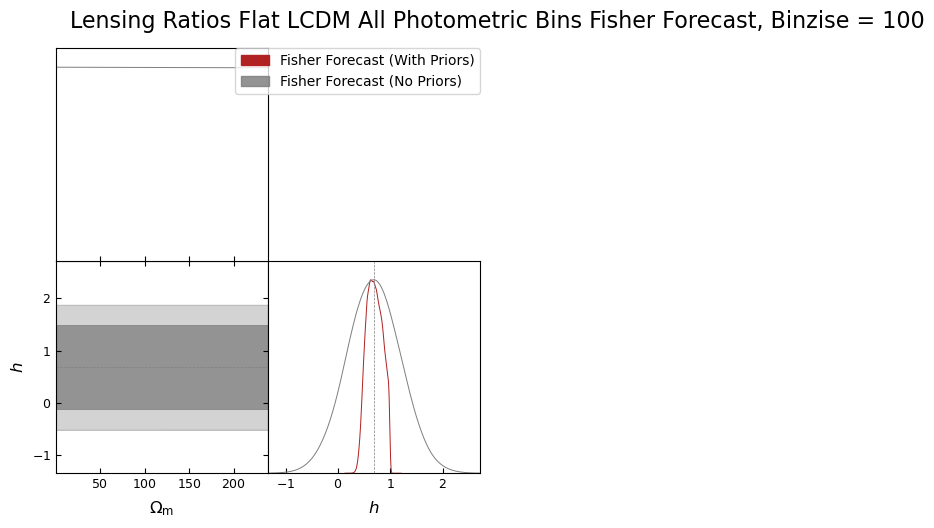

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.245^{+0.038}_{-0.024}$ | $\Omega_{c} = 0.245^{+0.051}_{-0.057}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.253\pm 0.091$ | $\Omega_{c} = 0.25^{+0.18}_{-0.18}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.055^{+0.018}_{-0.043}$ | $\Omega_{b} = 0.055^{+0.049}_{-0.044}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.048\pm 0.092$ | $\Omega_{b} = 0.05^{+0.18}_{-0.18}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.70^{+0.14}_{-0.18}$ | $h = 0.70^{+0.28}_{-0.25}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68\pm 0.52$ | $h = 0.7^{+1.0}_{-1.0}$ |
| --- | --- | --- | --- |
| **$A_s$** | Fisher Forecast (With Priors) | $A_s = \left(\,2.18^{+0.24}_{-0.62}\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.18^{+0.81}_{-0.69}\,\right)\cdot 10^{-9}$ |
|  | Fisher Forecast (No Priors) | $A_s = \left(\,2.1\pm 1.2\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.1^{+2.3}_{-2.3}\,\right)\cdot 10^{-9}$ |
| --- | --- | --- | --- |
| **$n_s$** | Fisher Forecast (With Priors) | $n_s = 0.970^{+0.024}_{-0.038}$ | $n_s = 0.970^{+0.058}_{-0.052}$ |
|  | Fisher Forecast (No Priors) | $n_s = 0.969\pm 0.097$ | $n_s = 0.97^{+0.19}_{-0.19}$ |
| --- | --- | --- | --- |

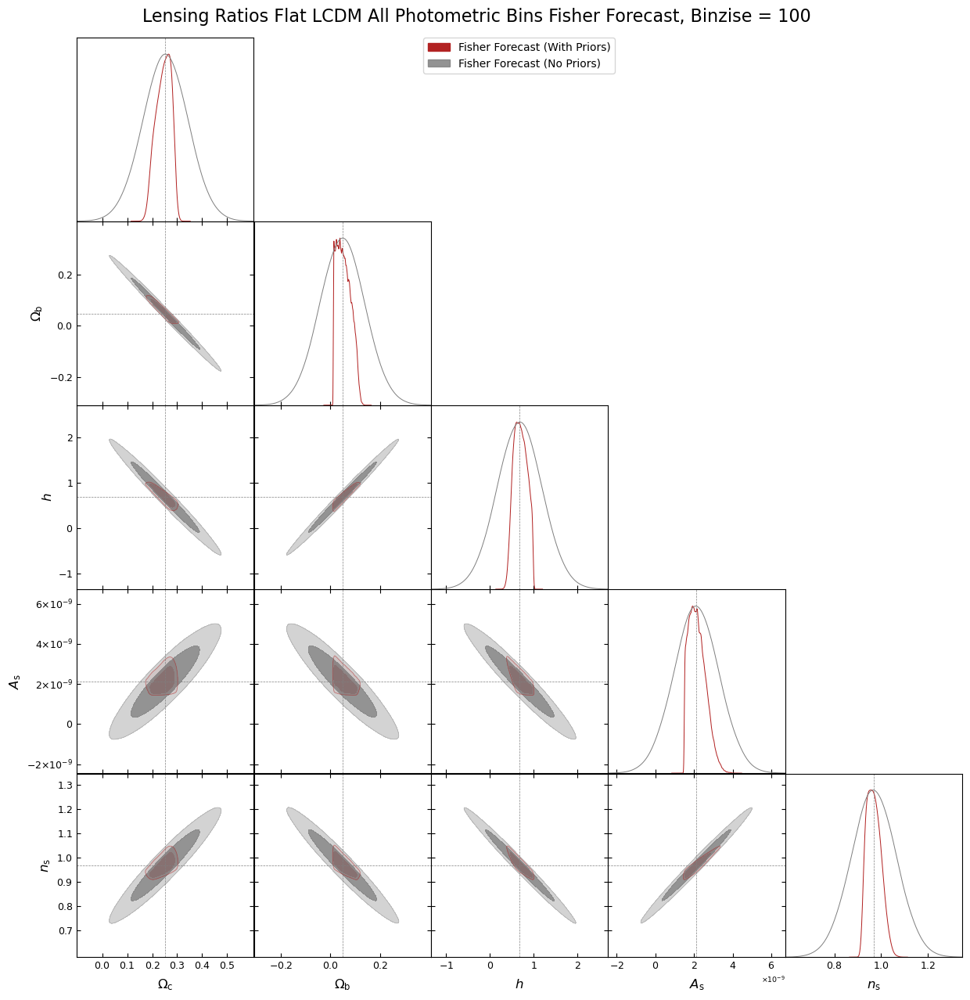

total_time:  0:01:25.899884


In [31]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=bgs_combined_array,
    source_data=HSC_dist_0_3,
    binsize=100,
    l_min =40,
    n_ell = 5000,
    f_sky = 0.4,
    magnification_bias_lenses = 0.8,
    linear_emulator = None,
    boost_emulator = None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=None,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=HSC_shape_noise,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'A_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Fisher Matrices/Flat_LCDM_LR_Photo_HSC_BGS_Binsize=100.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, A_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Covariance Matrices/Flat_LCDM_LR_Photo_HSC_BGS_Binsize=100.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, A_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios Flat LCDM All Photometric Bins Fisher Forecast, Binzise = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

g2 = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios Flat LCDM All Photometric Bins Fisher Forecast, Binzise = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

#deriv_plot = forecaster_c1.plot_derivatives(params_to_sample)

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3021\pm 0.0091$ | $\Omega_m = 0.302^{+0.018}_{-0.018}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = \Omega_\mathrm{m} < 0.310$ | $\Omega_m = \Omega_\mathrm{m} < 0.339$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.70^{+0.14}_{-0.17}$ | $h = 0.70^{+0.27}_{-0.25}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68\pm 0.36$ | $h = 0.68^{+0.71}_{-0.70}$ |
| --- | --- | --- | --- |

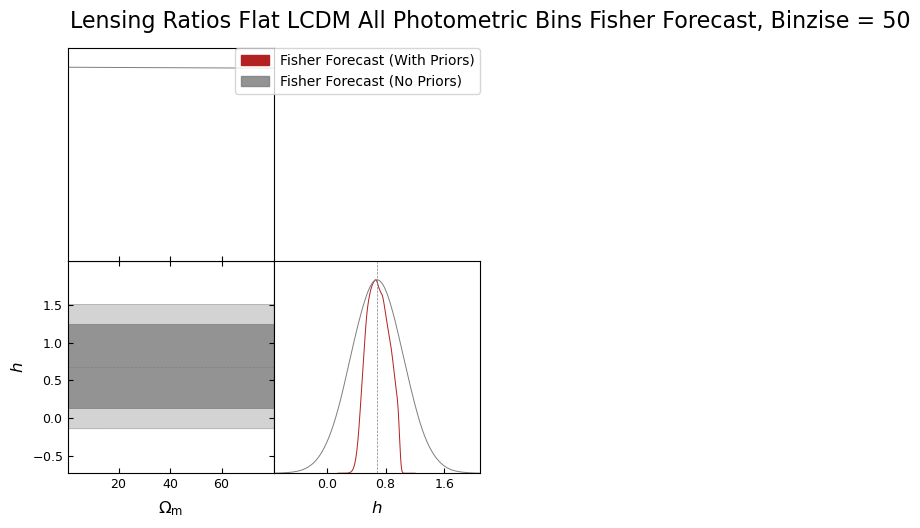

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.247^{+0.036}_{-0.023}$ | $\Omega_{c} = 0.247^{+0.048}_{-0.054}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.253\pm 0.062$ | $\Omega_{c} = 0.25^{+0.12}_{-0.12}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.054^{+0.014}_{-0.041}$ | $\Omega_{b} = 0.054^{+0.048}_{-0.042}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.048\pm 0.063$ | $\Omega_{b} = 0.05^{+0.12}_{-0.12}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.70^{+0.14}_{-0.18}$ | $h = 0.70^{+0.27}_{-0.25}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68\pm 0.36$ | $h = 0.68^{+0.71}_{-0.70}$ |
| --- | --- | --- | --- |
| **$A_s$** | Fisher Forecast (With Priors) | $A_s = \left(\,2.18^{+0.27}_{-0.58}\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.18^{+0.79}_{-0.69}\,\right)\cdot 10^{-9}$ |
|  | Fisher Forecast (No Priors) | $A_s = \left(\,2.12\pm 0.88\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.1^{+1.7}_{-1.7}\,\right)\cdot 10^{-9}$ |
| --- | --- | --- | --- |
| **$n_s$** | Fisher Forecast (With Priors) | $n_s = 0.970^{+0.024}_{-0.037}$ | $n_s = 0.970^{+0.056}_{-0.052}$ |
|  | Fisher Forecast (No Priors) | $n_s = 0.969\pm 0.070$ | $n_s = 0.97^{+0.14}_{-0.14}$ |
| --- | --- | --- | --- |

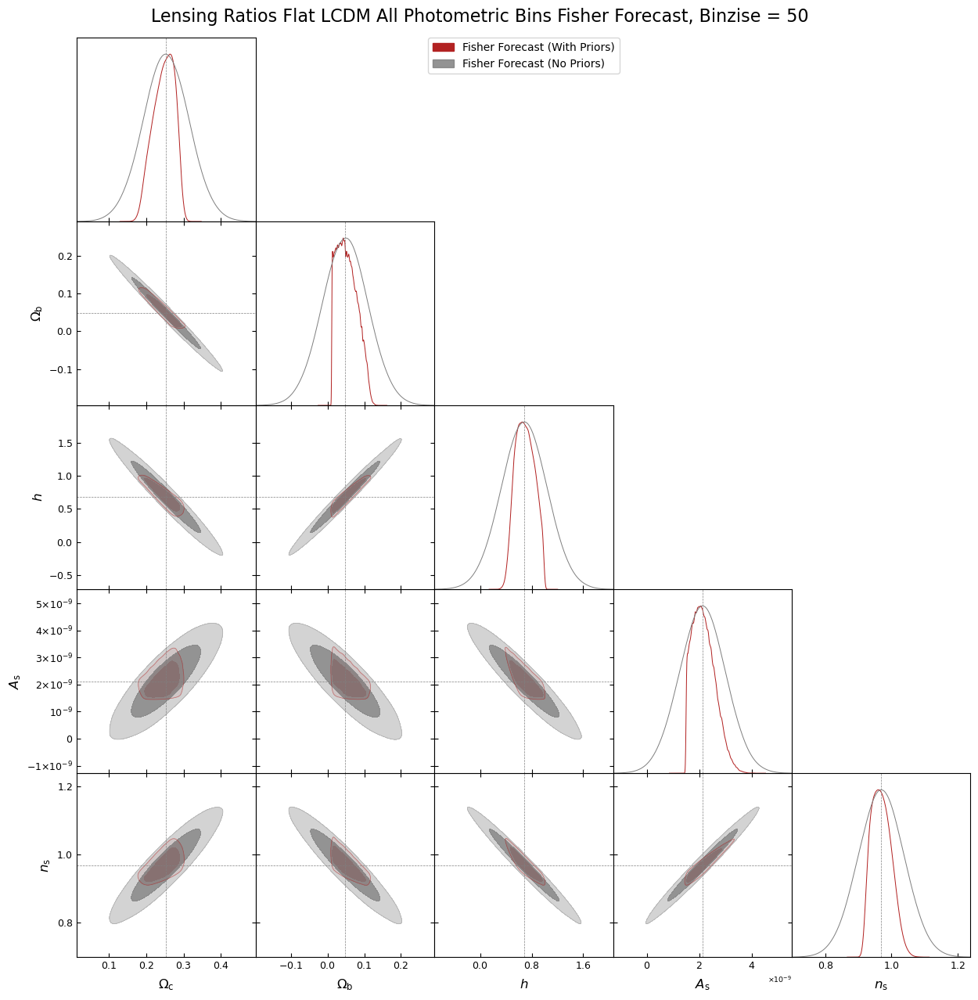

total_time:  0:01:31.646566


In [32]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=bgs_combined_array,
    source_data=HSC_dist_0_3,
    binsize=50,
    l_min =40,
    n_ell = 5000,
    f_sky = 0.4,
    magnification_bias_lenses = 0.8,
    linear_emulator = None,
    boost_emulator = None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=None,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=HSC_shape_noise,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'A_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Fisher Matrices/Flat_LCDM_LR_Photo_BGS_HSC_Binsize=50.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, A_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Covariance Matrices/Flat_LCDM_LR_Photo_BGS_HSC_Binsize=50.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, A_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios Flat LCDM All Photometric Bins Fisher Forecast, Binzise = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

g2 = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios Flat LCDM All Photometric Bins Fisher Forecast, Binzise = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

#deriv_plot = forecaster_c1.plot_derivatives(params_to_sample)

In [33]:
# REPLACE

#### Primaries

| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3026\pm 0.0048$ | $\Omega_m = 0.3026^{+0.0094}_{-0.0093}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3027\pm 0.0048$ | $\Omega_m = 0.3027^{+0.0093}_{-0.0093}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6817\pm 0.0035$ | $h = 0.6817^{+0.0069}_{-0.0069}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6817\pm 0.0035$ | $h = 0.6817^{+0.0069}_{-0.0069}$ |
| --- | --- | --- | --- |

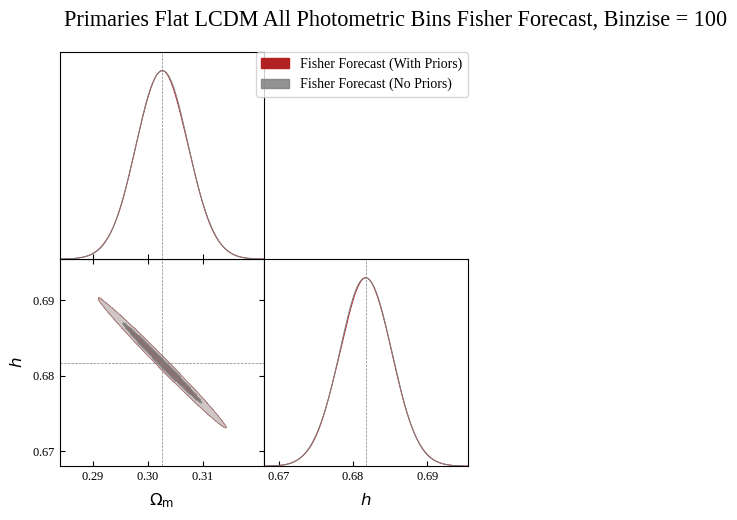

| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.2532\pm 0.0043$ | $\Omega_{c} = 0.2532^{+0.0085}_{-0.0085}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.2532\pm 0.0043$ | $\Omega_{c} = 0.2532^{+0.0085}_{-0.0085}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.04807\pm 0.00041$ | $\Omega_{b} = 0.04807^{+0.00080}_{-0.00080}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.04807\pm 0.00041$ | $\Omega_{b} = 0.04807^{+0.00080}_{-0.00081}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6817\pm 0.0035$ | $h = 0.6817^{+0.0068}_{-0.0069}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6817\pm 0.0035$ | $h = 0.6817^{+0.0069}_{-0.0068}$ |
| --- | --- | --- | --- |
| **$A_s$** | Fisher Forecast (With Priors) | $A_s = \left(\,2.1220\pm 0.0054\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.122^{+0.011}_{-0.011}\,\right)\cdot 10^{-9}$ |
|  | Fisher Forecast (No Priors) | $A_s = \left(\,2.1220\pm 0.0054\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.122^{+0.011}_{-0.011}\,\right)\cdot 10^{-9}$ |
| --- | --- | --- | --- |
| **$n_s$** | Fisher Forecast (With Priors) | $n_s = 0.9693\pm 0.0029$ | $n_s = 0.9693^{+0.0058}_{-0.0058}$ |
|  | Fisher Forecast (No Priors) | $n_s = 0.9693\pm 0.0029$ | $n_s = 0.9693^{+0.0057}_{-0.0057}$ |
| --- | --- | --- | --- |

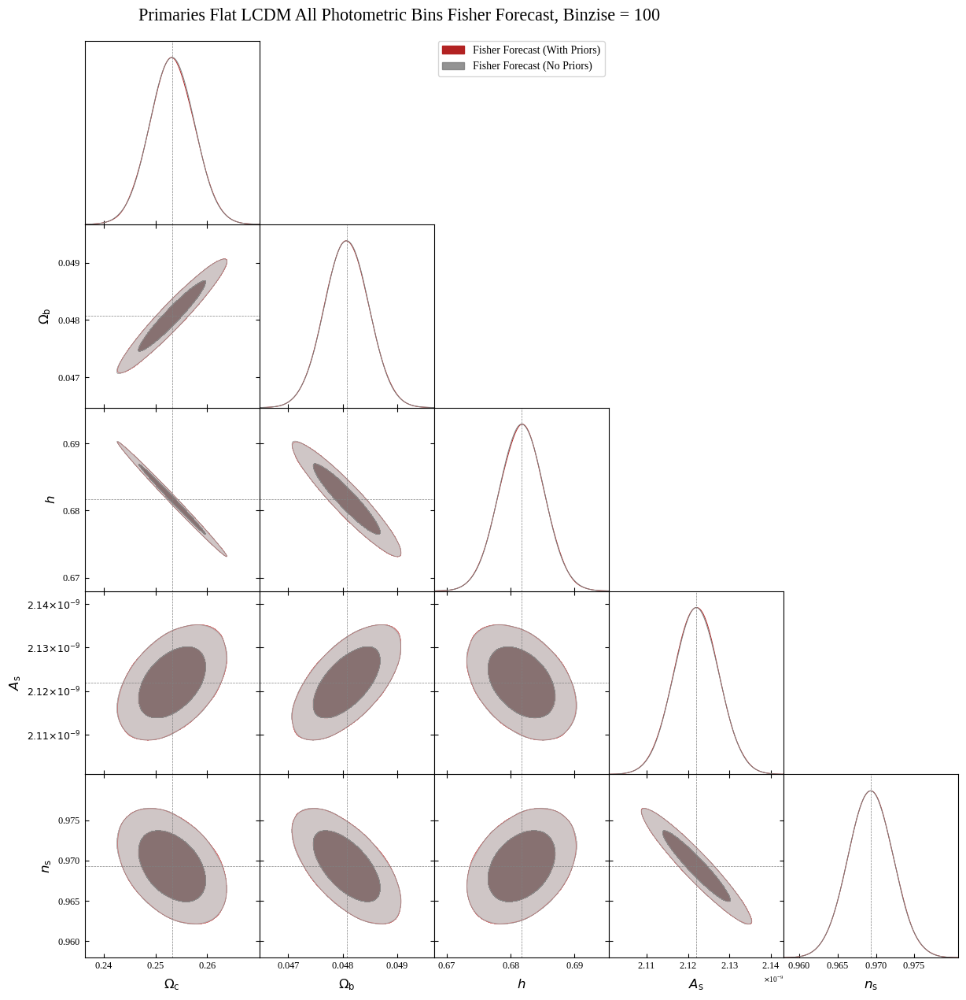

total_time:  0:01:31.387225


In [32]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=DESI_lens_data,
    source_data=HSC_dist_0_3,
    binsize=100,
    l_min =40,
    n_ell = 5000,
    f_sky = 0.4,
    magnification_bias_lenses = 0.8,
    linear_emulator = None,
    boost_emulator = None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=DESI_shot_noise,
    shape_noise_source=DESI_shape_noise,
    desired_spectra=['TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'A_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Fisher Matrices/Flat_LCDM_Primaries_All_Photometric_Bins_Binsize=100.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, A_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Covariance Matrices/Flat_LCDM_Primaries_All_Photometric_Bins_Binsize=100.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b m_nu h',
    comments='# Fiducial parameters: Omega_c, Omega_b, m_nu, h\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="Primaries Flat LCDM All Photometric Bins Fisher Forecast, Binzise = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

g2 = forecaster_c1.plot_with_cobaya_overlay(
    title="Primaries Flat LCDM All Photometric Bins Fisher Forecast, Binzise = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3027\pm 0.0043$ | $\Omega_m = 0.3027^{+0.0085}_{-0.0084}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3027\pm 0.0043$ | $\Omega_m = 0.3027^{+0.0085}_{-0.0085}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6817\pm 0.0032$ | $h = 0.6817^{+0.0062}_{-0.0062}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6817\pm 0.0032$ | $h = 0.6817^{+0.0062}_{-0.0062}$ |
| --- | --- | --- | --- |

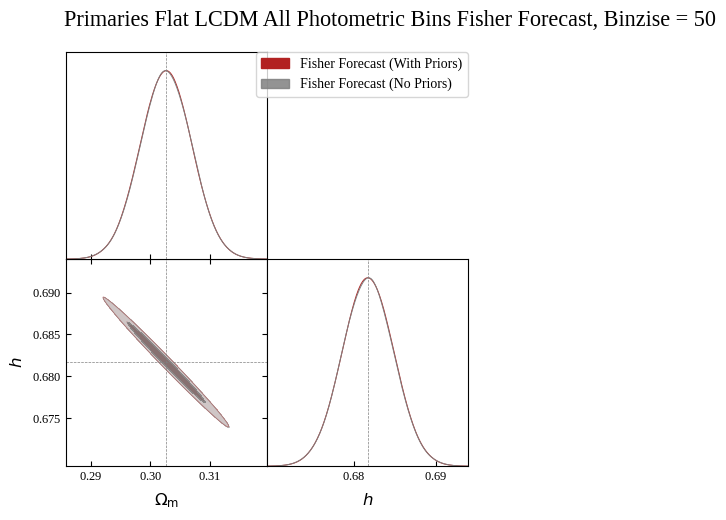

| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.2532\pm 0.0039$ | $\Omega_{c} = 0.2532^{+0.0077}_{-0.0077}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.2532\pm 0.0040$ | $\Omega_{c} = 0.2532^{+0.0077}_{-0.0078}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.04807\pm 0.00037$ | $\Omega_{b} = 0.04807^{+0.00073}_{-0.00073}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.04807\pm 0.00037$ | $\Omega_{b} = 0.04807^{+0.00073}_{-0.00074}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6817\pm 0.0032$ | $h = 0.6817^{+0.0062}_{-0.0062}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6817\pm 0.0032$ | $h = 0.6817^{+0.0063}_{-0.0062}$ |
| --- | --- | --- | --- |
| **$A_s$** | Fisher Forecast (With Priors) | $A_s = \left(\,2.1220\pm 0.0052\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.122^{+0.010}_{-0.010}\,\right)\cdot 10^{-9}$ |
|  | Fisher Forecast (No Priors) | $A_s = \left(\,2.1220\pm 0.0051\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.122^{+0.010}_{-0.010}\,\right)\cdot 10^{-9}$ |
| --- | --- | --- | --- |
| **$n_s$** | Fisher Forecast (With Priors) | $n_s = 0.9693\pm 0.0028$ | $n_s = 0.9693^{+0.0055}_{-0.0055}$ |
|  | Fisher Forecast (No Priors) | $n_s = 0.9693\pm 0.0028$ | $n_s = 0.9693^{+0.0055}_{-0.0054}$ |
| --- | --- | --- | --- |

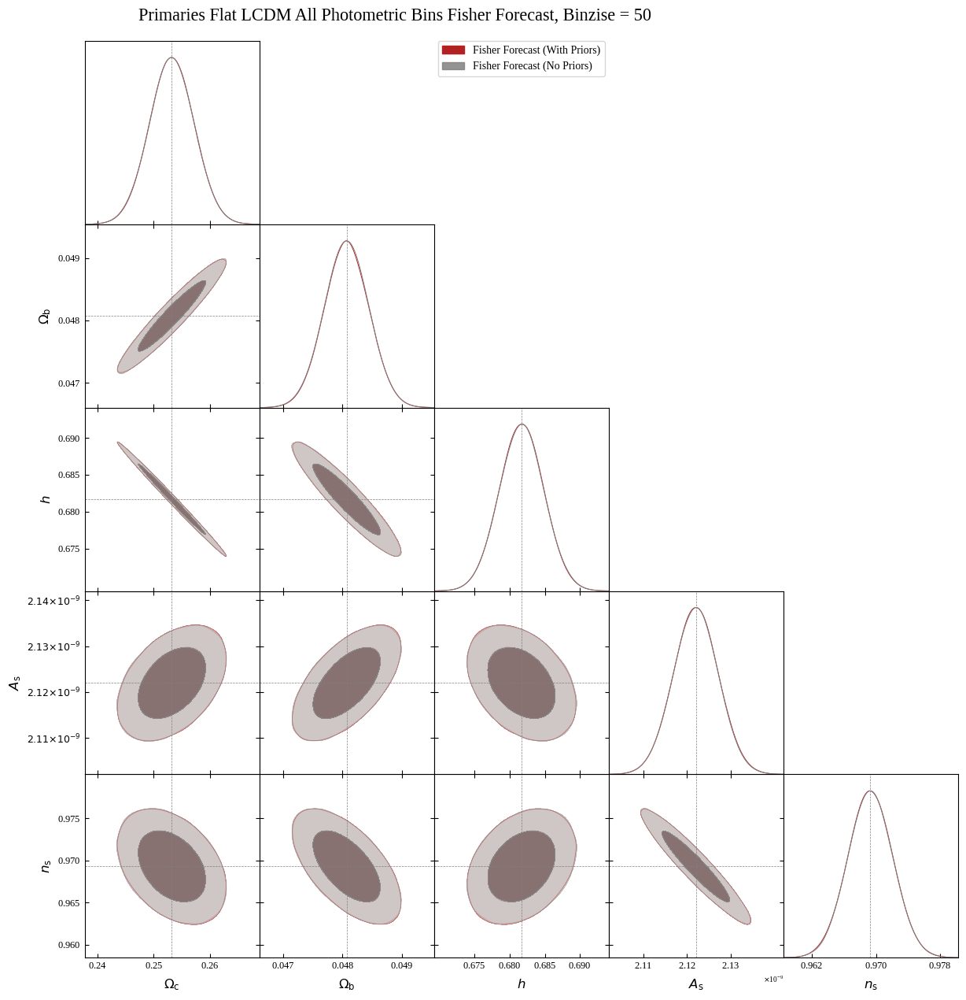

total_time:  0:01:51.011825


In [33]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=DESI_lens_data,
    source_data=HSC_dist_0_3,
    binsize=50,
    l_min =40,
    n_ell = 5000,
    f_sky = 0.4,
    magnification_bias_lenses = 0.8,
    linear_emulator = None,
    boost_emulator = None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=DESI_shot_noise,
    shape_noise_source=DESI_shape_noise,
    desired_spectra=['TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'A_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Fisher Matrices/Flat_LCDM_Primaries_All_Photometric_Bins_Binsize=50.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, A_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Covariance Matrices/Flat_LCDM_Primaries_All_Photometric_Bins_Binsize=50.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b m_nu h',
    comments='# Fiducial parameters: Omega_c, Omega_b, m_nu, h\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="Primaries Flat LCDM All Photometric Bins Fisher Forecast, Binzise = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

g2 = forecaster_c1.plot_with_cobaya_overlay(
    title="Primaries Flat LCDM All Photometric Bins Fisher Forecast, Binzise = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Plot successfully saved to: plots/Fisher Forecasts/so_primaries_flat_lcdm_fisher_forecast_bin_size_=_20.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3027\pm 0.0042$ | $\Omega_m = 0.3027^{+0.0082}_{-0.0082}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3027\pm 0.0042$ | $\Omega_m = 0.3027^{+0.0083}_{-0.0082}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6817\pm 0.0031$ | $h = 0.6817^{+0.0061}_{-0.0060}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6817\pm 0.0031$ | $h = 0.6817^{+0.0060}_{-0.0061}$ |
| --- | --- | --- | --- |

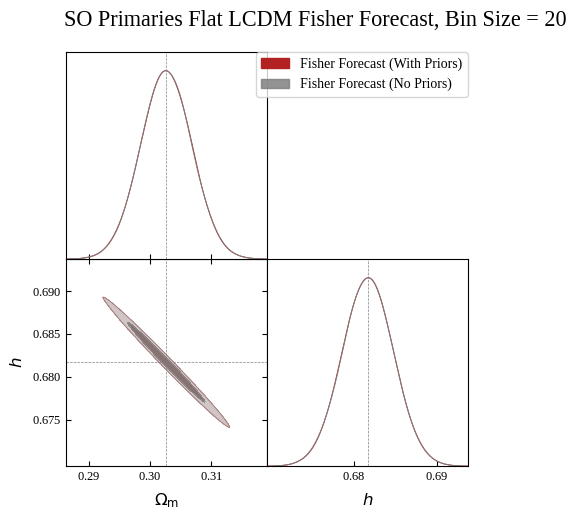

Plot successfully saved to: plots/Fisher Forecasts/so_primaries_flat_lcdm_fisher_forecast_bin_size_=_20_--_all_sampled_parameteres_plotted.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.2532\pm 0.0038$ | $\Omega_{c} = 0.2532^{+0.0075}_{-0.0075}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.2532\pm 0.0038$ | $\Omega_{c} = 0.2532^{+0.0075}_{-0.0075}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.04807\pm 0.00036$ | $\Omega_{b} = 0.04807^{+0.00071}_{-0.00071}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.04807\pm 0.00036$ | $\Omega_{b} = 0.04807^{+0.00071}_{-0.00071}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6817\pm 0.0031$ | $h = 0.6817^{+0.0060}_{-0.0060}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6817\pm 0.0031$ | $h = 0.6817^{+0.0060}_{-0.0060}$ |
| --- | --- | --- | --- |
| **$A_s$** | Fisher Forecast (With Priors) | $A_s = \left(\,2.1220\pm 0.0050\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.1220^{+0.0098}_{-0.0099}\,\right)\cdot 10^{-9}$ |
|  | Fisher Forecast (No Priors) | $A_s = \left(\,2.1220\pm 0.0050\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.1220^{+0.0098}_{-0.0098}\,\right)\cdot 10^{-9}$ |
| --- | --- | --- | --- |
| **$n_s$** | Fisher Forecast (With Priors) | $n_s = 0.9693\pm 0.0027$ | $n_s = 0.9693^{+0.0054}_{-0.0054}$ |
|  | Fisher Forecast (No Priors) | $n_s = 0.9693\pm 0.0027$ | $n_s = 0.9693^{+0.0053}_{-0.0054}$ |
| --- | --- | --- | --- |

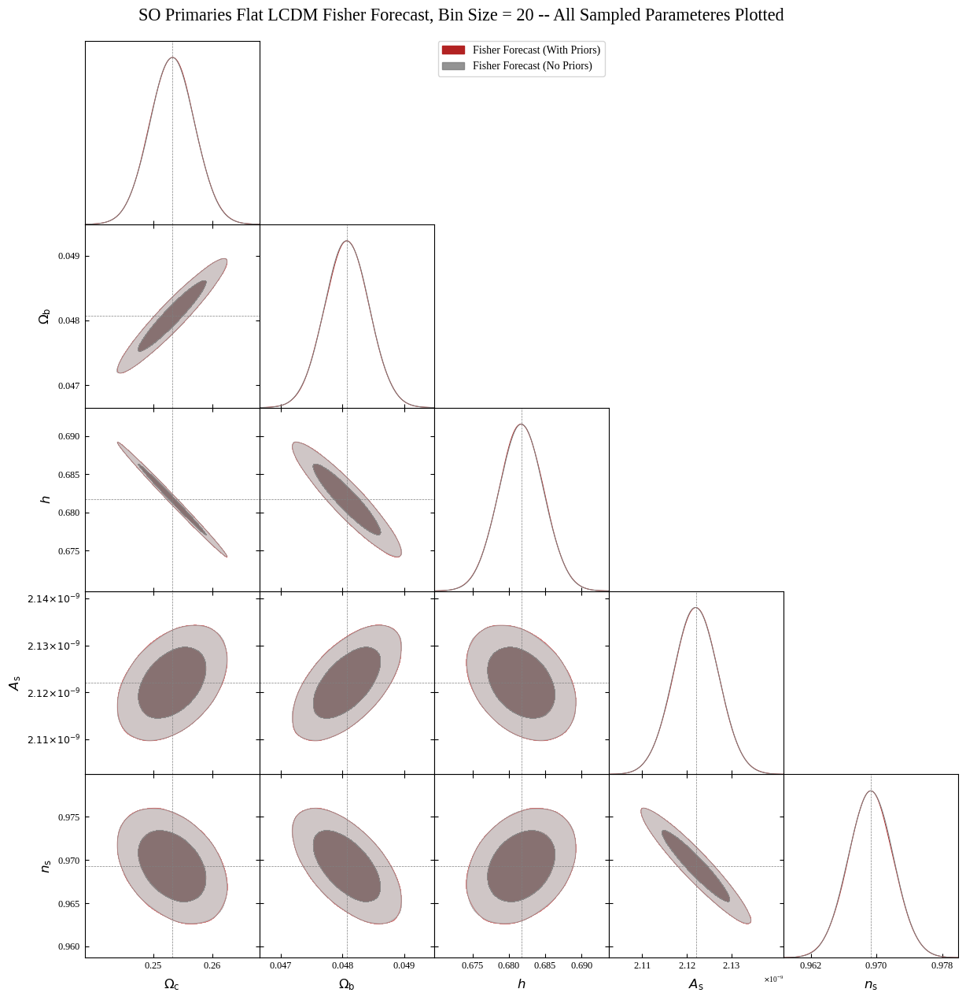

total_time:  0:03:27.327955


In [37]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=DESI_lens_data,
    source_data=HSC_dist_0_3,
    binsize=20,
    l_min =40,
    n_ell = 5000,
    f_sky = 0.4,
    magnification_bias_lenses = 0.8,
    linear_emulator = None,
    boost_emulator = None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=DESI_shot_noise,
    shape_noise_source=DESI_shape_noise,
    desired_spectra=['TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'A_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_LCDM_TT+TE_Binsize=20.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, A_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_LCDM_TT+EE_Binsize=20.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, A_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SO Primaries Flat LCDM Fisher Forecast, Bin Size = 20",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

g2 = forecaster_c1.plot_with_cobaya_overlay(
    title="SO Primaries Flat LCDM Fisher Forecast, Bin Size = 20 -- All Sampled Parameteres Plotted",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

#### Lensing Ratios and Primaries

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.30266\pm 0.00077$ | $\Omega_m = 0.3027^{+0.0015}_{-0.0015}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.30266\pm 0.00077$ | $\Omega_m = 0.3027^{+0.0015}_{-0.0015}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.68170\pm 0.00068$ | $h = 0.6817^{+0.0013}_{-0.0013}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68170\pm 0.00067$ | $h = 0.6817^{+0.0013}_{-0.0013}$ |
| --- | --- | --- | --- |

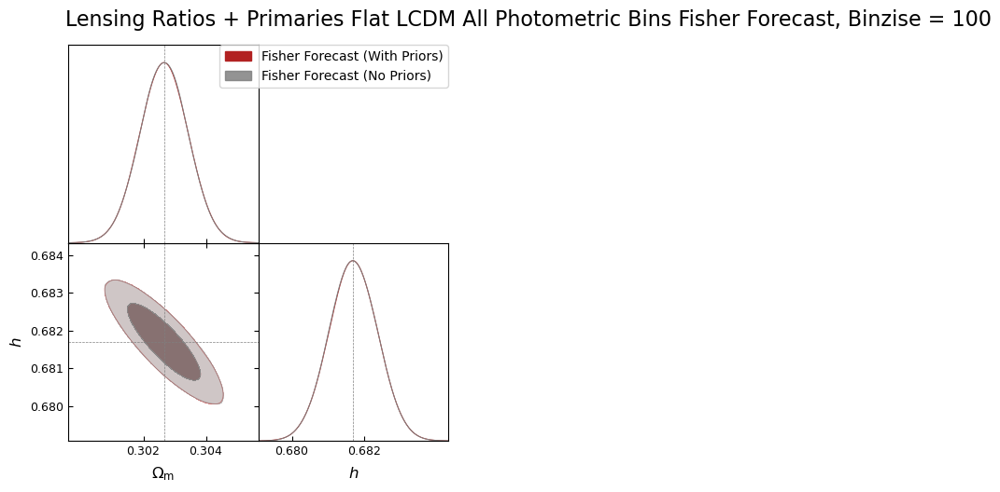

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.25320\pm 0.00065$ | $\Omega_{c} = 0.2532^{+0.0013}_{-0.0013}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.25320\pm 0.00065$ | $\Omega_{c} = 0.2532^{+0.0013}_{-0.0013}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.04807\pm 0.00014$ | $\Omega_{b} = 0.04807^{+0.00028}_{-0.00028}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.04807\pm 0.00014$ | $\Omega_{b} = 0.04807^{+0.00028}_{-0.00028}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.68170\pm 0.00067$ | $h = 0.6817^{+0.0013}_{-0.0013}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68170\pm 0.00067$ | $h = 0.6817^{+0.0013}_{-0.0013}$ |
| --- | --- | --- | --- |
| **$A_s$** | Fisher Forecast (With Priors) | $A_s = \left(\,2.1220\pm 0.0040\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.1220^{+0.0078}_{-0.0078}\,\right)\cdot 10^{-9}$ |
|  | Fisher Forecast (No Priors) | $A_s = \left(\,2.1220\pm 0.0040\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.1220^{+0.0078}_{-0.0078}\,\right)\cdot 10^{-9}$ |
| --- | --- | --- | --- |
| **$n_s$** | Fisher Forecast (With Priors) | $n_s = 0.9693\pm 0.0022$ | $n_s = 0.9693^{+0.0043}_{-0.0043}$ |
|  | Fisher Forecast (No Priors) | $n_s = 0.9693\pm 0.0022$ | $n_s = 0.9693^{+0.0043}_{-0.0043}$ |
| --- | --- | --- | --- |

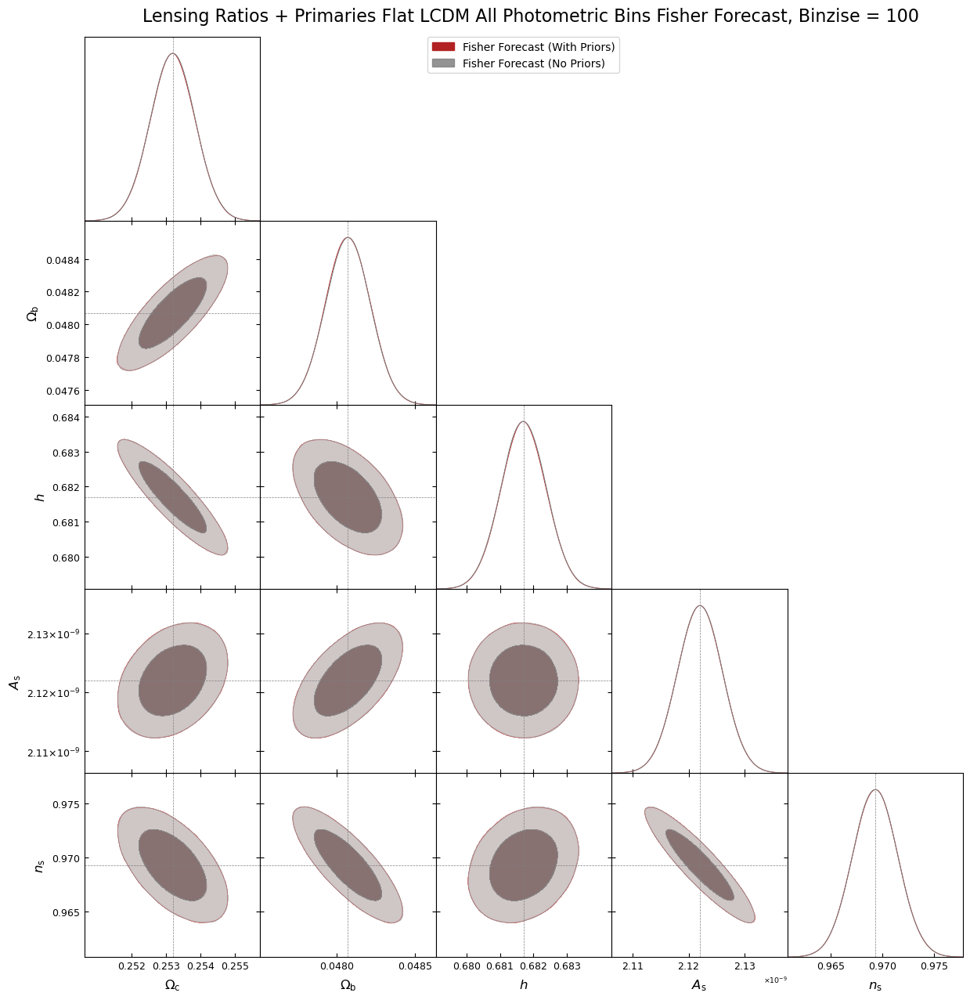

total_time:  0:02:17.117612


In [34]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=bgs_combined_array,
    source_data=HSC_dist_0_3,
    binsize=100,
    l_min =40,
    n_ell = 5000,
    f_sky = 0.4,
    magnification_bias_lenses = 0.8,
    linear_emulator = None,
    boost_emulator = None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=HSC_shape_noise,
    desired_spectra=['CG', 'GL', 'TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'A_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Fisher Matrices/Flat_LCDM_LRP_Photo_HSC_BGS_Bins_Binsize=100.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, A_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Covariance Matrices/Flat_LCDM_LRP_Photo_HSC_BGS_Bins_Binsize=100.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, A_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios + Primaries Flat LCDM All Photometric Bins Fisher Forecast, Binzise = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

g2 = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios + Primaries Flat LCDM All Photometric Bins Fisher Forecast, Binzise = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

#deriv_plot = forecaster_c1.plot_derivatives(params_to_sample, normalized=True)

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.30266\pm 0.00073$ | $\Omega_m = 0.3027^{+0.0014}_{-0.0014}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.30266\pm 0.00073$ | $\Omega_m = 0.3027^{+0.0014}_{-0.0014}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.68170\pm 0.00061$ | $h = 0.6817^{+0.0012}_{-0.0012}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68170\pm 0.00061$ | $h = 0.6817^{+0.0012}_{-0.0012}$ |
| --- | --- | --- | --- |

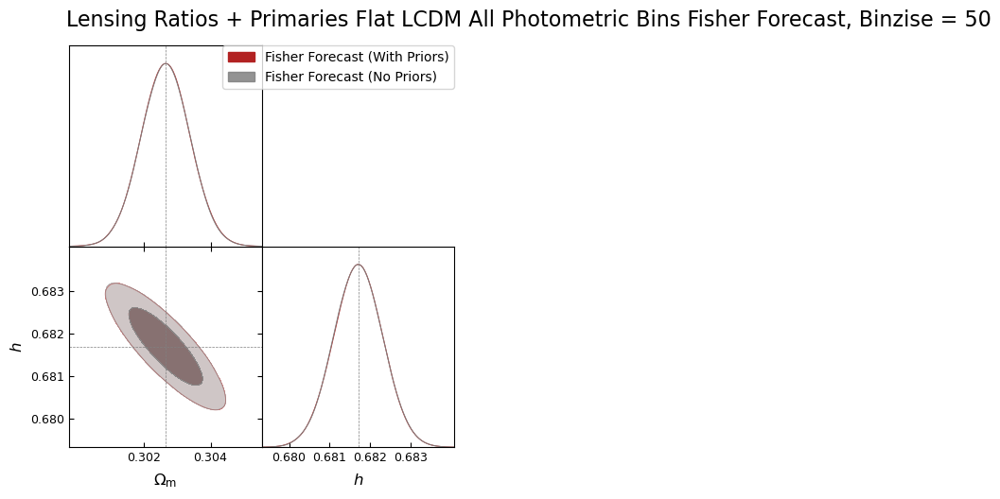

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.25320\pm 0.00062$ | $\Omega_{c} = 0.2532^{+0.0012}_{-0.0012}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.25320\pm 0.00062$ | $\Omega_{c} = 0.2532^{+0.0012}_{-0.0012}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.04807\pm 0.00014$ | $\Omega_{b} = 0.04807^{+0.00027}_{-0.00027}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.04807\pm 0.00014$ | $\Omega_{b} = 0.04807^{+0.00027}_{-0.00027}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.68170\pm 0.00061$ | $h = 0.6817^{+0.0012}_{-0.0012}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68170\pm 0.00061$ | $h = 0.6817^{+0.0012}_{-0.0012}$ |
| --- | --- | --- | --- |
| **$A_s$** | Fisher Forecast (With Priors) | $A_s = \left(\,2.1220\pm 0.0039\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.1220^{+0.0077}_{-0.0076}\,\right)\cdot 10^{-9}$ |
|  | Fisher Forecast (No Priors) | $A_s = \left(\,2.1220\pm 0.0039\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.1220^{+0.0076}_{-0.0076}\,\right)\cdot 10^{-9}$ |
| --- | --- | --- | --- |
| **$n_s$** | Fisher Forecast (With Priors) | $n_s = 0.9693\pm 0.0021$ | $n_s = 0.9693^{+0.0042}_{-0.0042}$ |
|  | Fisher Forecast (No Priors) | $n_s = 0.9693\pm 0.0021$ | $n_s = 0.9693^{+0.0041}_{-0.0042}$ |
| --- | --- | --- | --- |

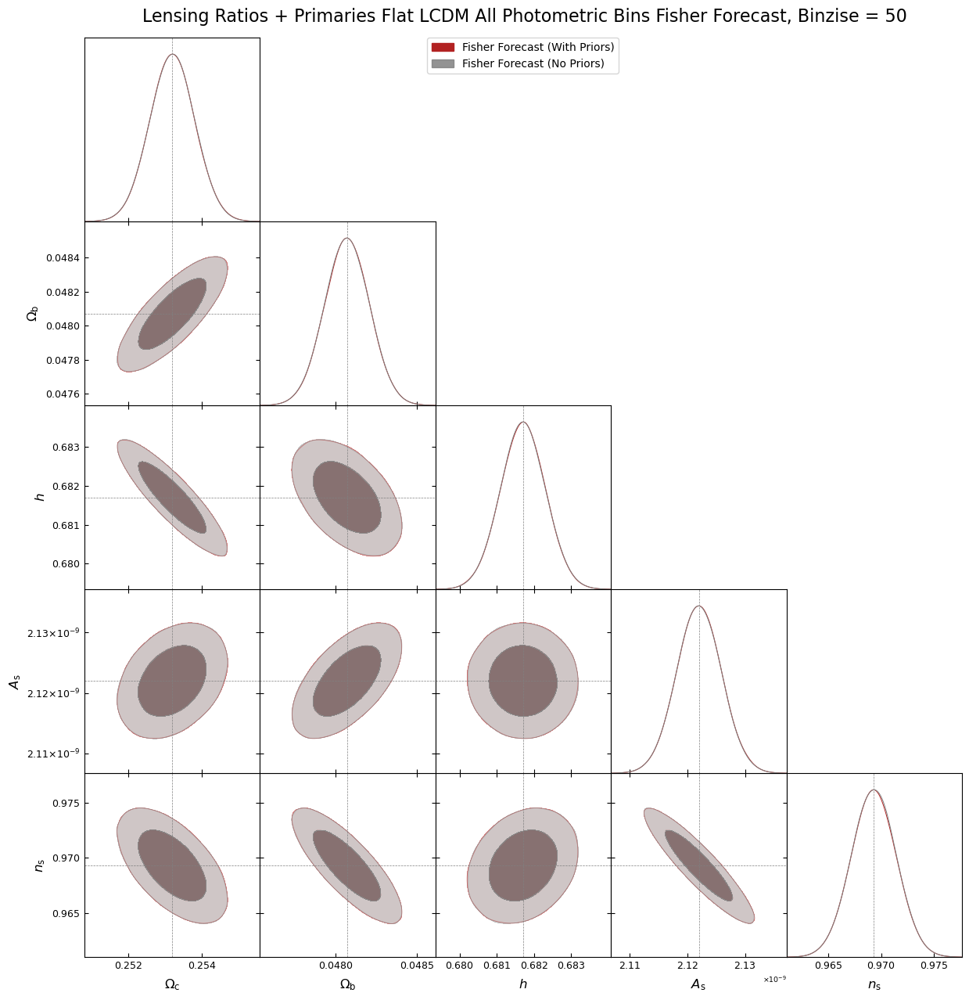

total_time:  0:02:31.591890


In [35]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_LCDM_cosmology,
    lens_data=bgs_combined_array,
    source_data=HSC_dist_0_3,
    binsize=50,
    l_min =40,
    n_ell = 5000,
    f_sky = 0.4,
    magnification_bias_lenses = 0.8,
    linear_emulator = None,
    boost_emulator = None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=HSC_shape_noise,
    desired_spectra=['CG', 'GL', 'TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'A_s', 'n_s']
params_to_plot = ['Omega_m', 'h']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Fisher Matrices/Flat_LCDM_LRP_Photo_HSC_BGS_Binsize=50.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, A_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Covariance Matrices/Flat_LCDM_LRP_Photo_HSC_BGS_Binsize=50.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, A_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios + Primaries Flat LCDM All Photometric Bins Fisher Forecast, Binzise = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

g2 = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios + Primaries Flat LCDM All Photometric Bins Fisher Forecast, Binzise = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

#deriv_plot = forecaster_c1.plot_derivatives(params_to_sample, normalized=True)

In [36]:
# REPLACE

### Curved $\Lambda$CDM: $\Omega_m, h, \Omega_k$

#### Lensing Ratios

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3027\pm 0.0098$ | $\Omega_m = 0.303^{+0.019}_{-0.019}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = \Omega_\mathrm{m} < 0.312$ | $\Omega_m = \Omega_\mathrm{m} < 0.423$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.70^{+0.15}_{-0.17}$ | $h = 0.70^{+0.28}_{-0.26}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68\pm 0.60$ | $h = 0.7^{+1.2}_{-1.2}$ |
| --- | --- | --- | --- |
| **$\Omega_k$** | Fisher Forecast (With Priors) | $\Omega_k = -0.005\pm 0.046$ | $\Omega_k = -0.005^{+0.087}_{-0.091}$ |
|  | Fisher Forecast (No Priors) | $\Omega_k = 0.002\pm 0.048$ | $\Omega_k = 0.002^{+0.095}_{-0.095}$ |
| --- | --- | --- | --- |

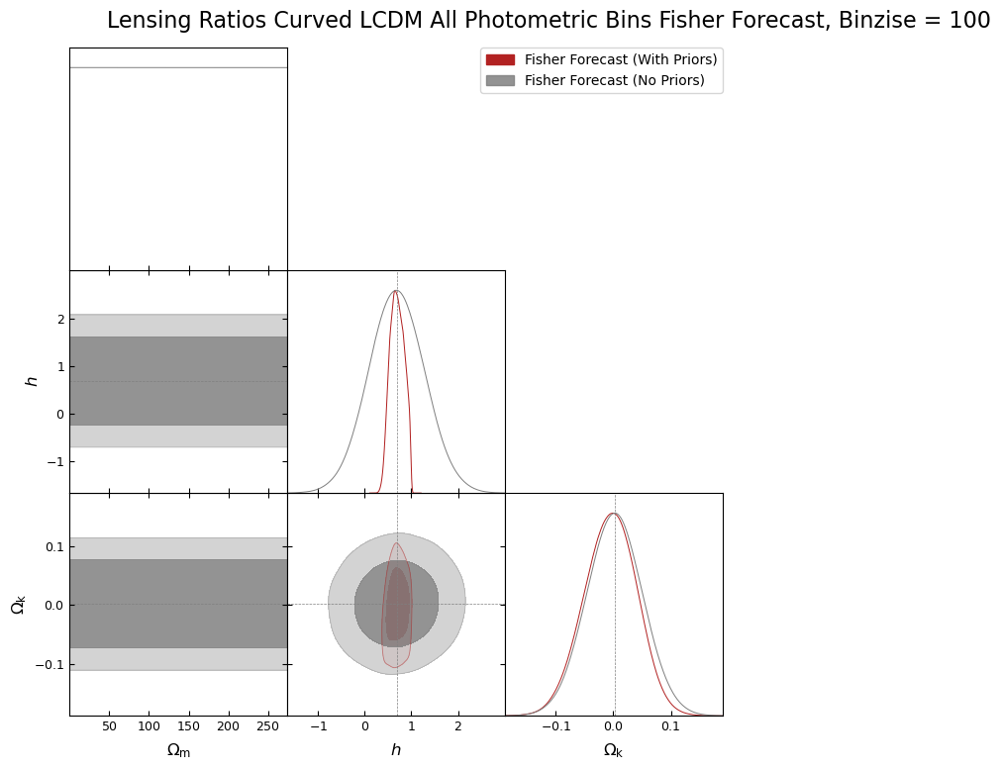

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.247^{+0.039}_{-0.024}$ | $\Omega_{c} = 0.247^{+0.051}_{-0.058}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.25\pm 0.10$ | $\Omega_{c} = 0.25^{+0.21}_{-0.21}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.054^{+0.015}_{-0.042}$ | $\Omega_{b} = 0.054^{+0.051}_{-0.043}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.05\pm 0.11$ | $\Omega_{b} = 0.05^{+0.21}_{-0.21}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.70\pm 0.15$ | $h = 0.70^{+0.28}_{-0.26}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68\pm 0.60$ | $h = 0.7^{+1.2}_{-1.2}$ |
| --- | --- | --- | --- |
| **$\Omega_k$** | Fisher Forecast (With Priors) | $\Omega_k = -0.005\pm 0.046$ | $\Omega_k = -0.005^{+0.087}_{-0.092}$ |
|  | Fisher Forecast (No Priors) | $\Omega_k = 0.002\pm 0.048$ | $\Omega_k = 0.002^{+0.095}_{-0.095}$ |
| --- | --- | --- | --- |
| **$A_s$** | Fisher Forecast (With Priors) | $A_s = \left(\,2.19^{+0.27}_{-0.57}\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.19^{+0.80}_{-0.70}\,\right)\cdot 10^{-9}$ |
|  | Fisher Forecast (No Priors) | $A_s = \left(\,2.1\pm 1.3\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.1^{+2.6}_{-2.6}\,\right)\cdot 10^{-9}$ |
| --- | --- | --- | --- |
| **$n_s$** | Fisher Forecast (With Priors) | $n_s = 0.971^{+0.030}_{-0.047}$ | $n_s = 0.971^{+0.073}_{-0.067}$ |
|  | Fisher Forecast (No Priors) | $n_s = 0.97\pm 0.11$ | $n_s = 0.97^{+0.23}_{-0.22}$ |
| --- | --- | --- | --- |

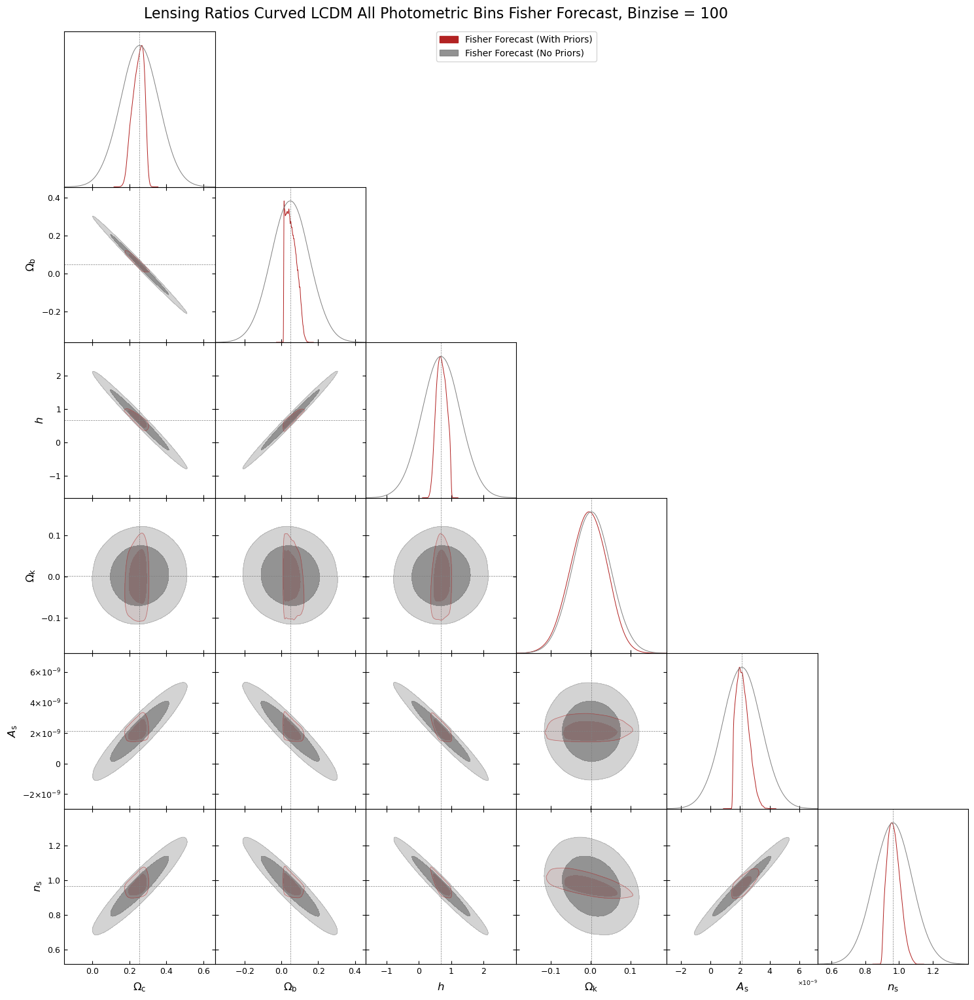

total_time:  0:01:45.541842


In [37]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=curved_LCDM_cosmology,
    lens_data=bgs_combined_array,
    source_data=HSC_dist_0_3,
    binsize=100,
    l_min =40,
    n_ell = 5000,
    f_sky = 0.4,
    magnification_bias_lenses = 0.8,
    linear_emulator = None,
    boost_emulator = None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=None,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=HSC_shape_noise,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'Omega_k', 'A_s', 'n_s']
params_to_plot = ['Omega_m', 'h', 'Omega_k']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Fisher Matrices/Curved_LCDM_LR_Photo_BGS_HSC_Binsize=100.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h Omega_k A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, Omega_k, A_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Covariance Matrices/Curved_LCDM_LR_Photo_BGS_HSC_Binsize=100.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b m_nu h Omega_k',
    comments='# Fiducial parameters: Omega_c, Omega_b, m_nu, h, Omega_k\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios Curved LCDM All Photometric Bins Fisher Forecast, Binzise = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

g2 = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios Curved LCDM All Photometric Bins Fisher Forecast, Binzise = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3031\pm 0.0093$ | $\Omega_m = 0.303^{+0.018}_{-0.018}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = \Omega_\mathrm{m} < 0.311$ | $\Omega_m = \Omega_\mathrm{m} < 0.365$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.69^{+0.15}_{-0.16}$ | $h = 0.69^{+0.28}_{-0.25}$ |
|  | Fisher Forecast (No Priors) | $h = 0.69\pm 0.42$ | $h = 0.69^{+0.82}_{-0.81}$ |
| --- | --- | --- | --- |
| **$\Omega_k$** | Fisher Forecast (With Priors) | $\Omega_k = -0.004\pm 0.045$ | $\Omega_k = -0.004^{+0.086}_{-0.090}$ |
|  | Fisher Forecast (No Priors) | $\Omega_k = 0.002\pm 0.048$ | $\Omega_k = 0.002^{+0.093}_{-0.093}$ |
| --- | --- | --- | --- |

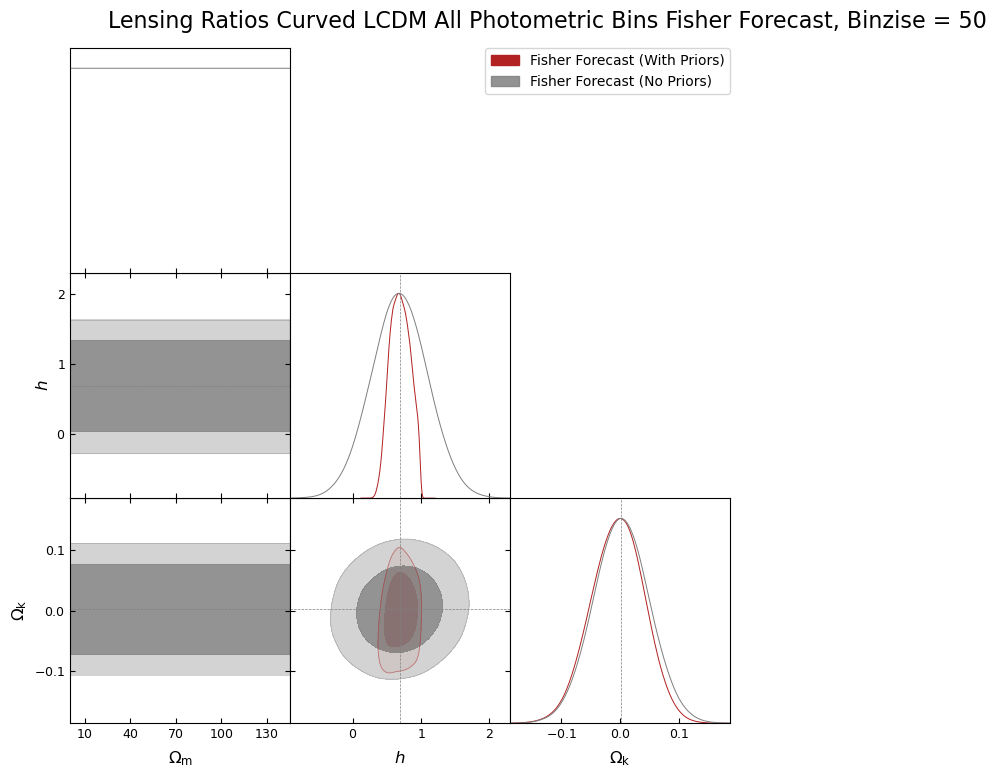

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.248^{+0.037}_{-0.022}$ | $\Omega_{c} = 0.248^{+0.048}_{-0.055}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.255\pm 0.071$ | $\Omega_{c} = 0.25^{+0.14}_{-0.14}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.053^{+0.014}_{-0.041}$ | $\Omega_{b} = 0.053^{+0.049}_{-0.042}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.047\pm 0.072$ | $\Omega_{b} = 0.05^{+0.14}_{-0.14}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.69\pm 0.15$ | $h = 0.69^{+0.28}_{-0.25}$ |
|  | Fisher Forecast (No Priors) | $h = 0.69\pm 0.41$ | $h = 0.69^{+0.81}_{-0.81}$ |
| --- | --- | --- | --- |
| **$\Omega_k$** | Fisher Forecast (With Priors) | $\Omega_k = -0.004\pm 0.045$ | $\Omega_k = -0.004^{+0.086}_{-0.090}$ |
|  | Fisher Forecast (No Priors) | $\Omega_k = 0.002\pm 0.048$ | $\Omega_k = 0.002^{+0.093}_{-0.093}$ |
| --- | --- | --- | --- |
| **$A_s$** | Fisher Forecast (With Priors) | $A_s = \left(\,2.18^{+0.28}_{-0.56}\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.18^{+0.77}_{-0.69}\,\right)\cdot 10^{-9}$ |
|  | Fisher Forecast (No Priors) | $A_s = \left(\,2.11\pm 0.96\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.1^{+1.9}_{-1.9}\,\right)\cdot 10^{-9}$ |
| --- | --- | --- | --- |
| **$n_s$** | Fisher Forecast (With Priors) | $n_s = 0.970^{+0.030}_{-0.046}$ | $n_s = 0.970^{+0.070}_{-0.066}$ |
|  | Fisher Forecast (No Priors) | $n_s = 0.965\pm 0.084$ | $n_s = 0.96^{+0.16}_{-0.16}$ |
| --- | --- | --- | --- |

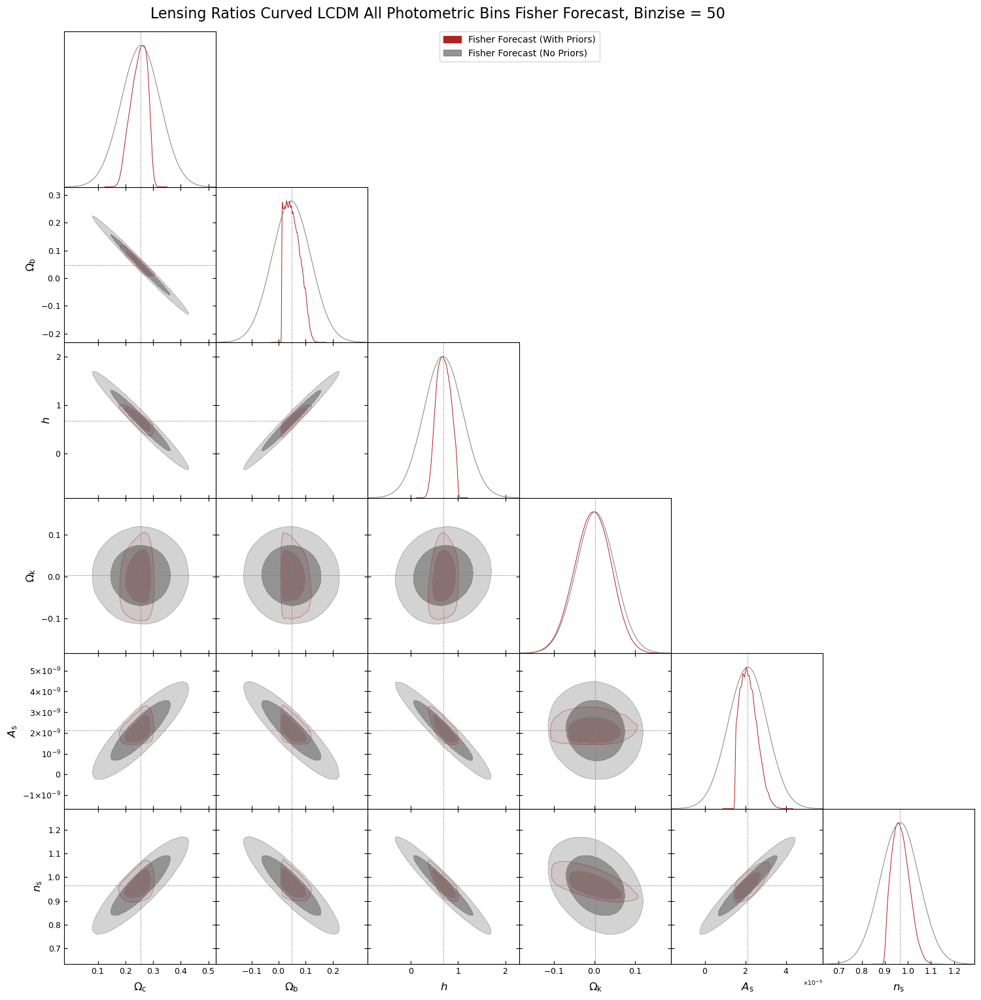

total_time:  0:01:50.085099


In [38]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=curved_LCDM_cosmology,
    lens_data=bgs_combined_array,
    source_data=HSC_dist_0_3,
    binsize=50,
    l_min =40,
    n_ell = 5000,
    f_sky = 0.4,
    magnification_bias_lenses = 0.8,
    linear_emulator = None,
    boost_emulator = None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=None,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=HSC_shape_noise,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'Omega_k', 'A_s', 'n_s']
params_to_plot = ['Omega_m', 'h', 'Omega_k']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Fisher Matrices/Curved_LCDM_LR_Photo_HSC_BGS_Binsize=50.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h Omega_k A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, Omega_k, A_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Covariance Matrices/Curved_LCDM_LR_Photo_HSC_BGS_Binsize=50.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b m_nu h Omega_k',
    comments='# Fiducial parameters: Omega_c, Omega_b, m_nu, h, Omega_k\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios Curved LCDM All Photometric Bins Fisher Forecast, Binzise = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

g2 = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios Curved LCDM All Photometric Bins Fisher Forecast, Binzise = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

In [39]:
# REPLACE

#### Primaries

| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.303\pm 0.010$ | $\Omega_m = 0.303^{+0.020}_{-0.020}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.303\pm 0.010$ | $\Omega_m = 0.303^{+0.020}_{-0.020}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.685\pm 0.013$ | $h = 0.685^{+0.025}_{-0.025}$ |
|  | Fisher Forecast (No Priors) | $h = 0.685\pm 0.013$ | $h = 0.685^{+0.026}_{-0.025}$ |
| --- | --- | --- | --- |
| **$\Omega_k$** | Fisher Forecast (With Priors) | $\Omega_k = 0.0023\pm 0.0033$ | $\Omega_k = 0.0023^{+0.0064}_{-0.0064}$ |
|  | Fisher Forecast (No Priors) | $\Omega_k = 0.0023\pm 0.0033$ | $\Omega_k = 0.0023^{+0.0064}_{-0.0064}$ |
| --- | --- | --- | --- |

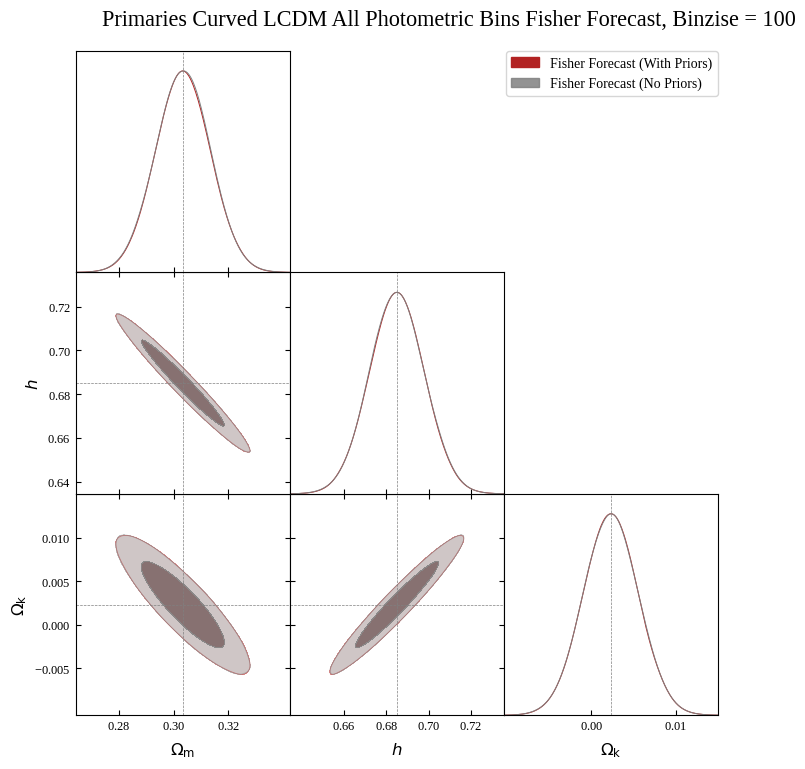

| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.2547\pm 0.0083$ | $\Omega_{c} = 0.255^{+0.016}_{-0.016}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.2547\pm 0.0083$ | $\Omega_{c} = 0.255^{+0.016}_{-0.016}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.0474\pm 0.0018$ | $\Omega_{b} = 0.0474^{+0.0035}_{-0.0035}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.0474\pm 0.0018$ | $\Omega_{b} = 0.0474^{+0.0035}_{-0.0035}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.685\pm 0.013$ | $h = 0.685^{+0.026}_{-0.025}$ |
|  | Fisher Forecast (No Priors) | $h = 0.685\pm 0.013$ | $h = 0.685^{+0.026}_{-0.025}$ |
| --- | --- | --- | --- |
| **$\Omega_k$** | Fisher Forecast (With Priors) | $\Omega_k = 0.0023\pm 0.0033$ | $\Omega_k = 0.0023^{+0.0064}_{-0.0064}$ |
|  | Fisher Forecast (No Priors) | $\Omega_k = 0.0023\pm 0.0033$ | $\Omega_k = 0.0023^{+0.0064}_{-0.0064}$ |
| --- | --- | --- | --- |
| **$A_s$** | Fisher Forecast (With Priors) | $A_s = \left(\,2.1150\pm 0.0070\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.115^{+0.014}_{-0.014}\,\right)\cdot 10^{-9}$ |
|  | Fisher Forecast (No Priors) | $A_s = \left(\,2.1150\pm 0.0070\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.115^{+0.014}_{-0.014}\,\right)\cdot 10^{-9}$ |
| --- | --- | --- | --- |
| **$n_s$** | Fisher Forecast (With Priors) | $n_s = 0.9649\pm 0.0036$ | $n_s = 0.9649^{+0.0071}_{-0.0071}$ |
|  | Fisher Forecast (No Priors) | $n_s = 0.9649\pm 0.0036$ | $n_s = 0.9649^{+0.0071}_{-0.0071}$ |
| --- | --- | --- | --- |

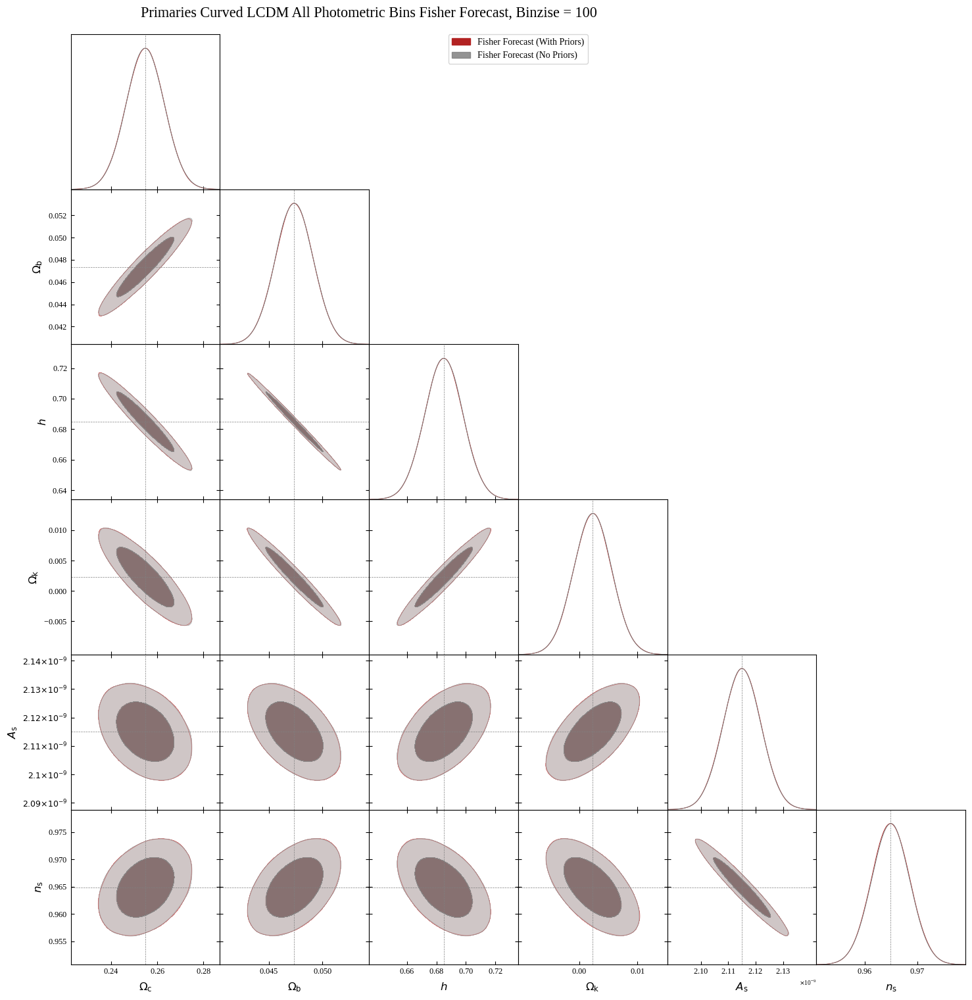

total_time:  0:02:06.220965


In [41]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=curved_LCDM_cosmology,
    lens_data=DESI_lens_data,
    source_data=HSC_dist_0_3,
    binsize=100,
    l_min =40,
    n_ell = 5000,
    f_sky = 0.4,
    magnification_bias_lenses = 0.8,
    linear_emulator = None,
    boost_emulator = None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=DESI_shot_noise,
    shape_noise_source=DESI_shape_noise,
    desired_spectra=['TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'Omega_k', 'A_s', 'n_s']
params_to_plot = ['Omega_m', 'h', 'Omega_k']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Fisher Matrices/Curved_LCDM_Primaries_All_Photometric_Bins_Binsize=100.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h Omega_k A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, Omega_k, A_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Covariance Matrices/Curved_LCDM_Primaries_All_Photometric_Bins_Binsize=100.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h Omega_k A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, Omega_k, A_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="Primaries Curved LCDM All Photometric Bins Fisher Forecast, Binzise = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

g2 = forecaster_c1.plot_with_cobaya_overlay(
    title="Primaries Curved LCDM All Photometric Bins Fisher Forecast, Binzise = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3034\pm 0.0094$ | $\Omega_m = 0.303^{+0.018}_{-0.018}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3035\pm 0.0094$ | $\Omega_m = 0.303^{+0.018}_{-0.018}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.685\pm 0.012$ | $h = 0.685^{+0.024}_{-0.024}$ |
|  | Fisher Forecast (No Priors) | $h = 0.685\pm 0.012$ | $h = 0.685^{+0.024}_{-0.024}$ |
| --- | --- | --- | --- |
| **$\Omega_k$** | Fisher Forecast (With Priors) | $\Omega_k = 0.0023\pm 0.0031$ | $\Omega_k = 0.0023^{+0.0060}_{-0.0060}$ |
|  | Fisher Forecast (No Priors) | $\Omega_k = 0.0023\pm 0.0031$ | $\Omega_k = 0.0023^{+0.0060}_{-0.0060}$ |
| --- | --- | --- | --- |

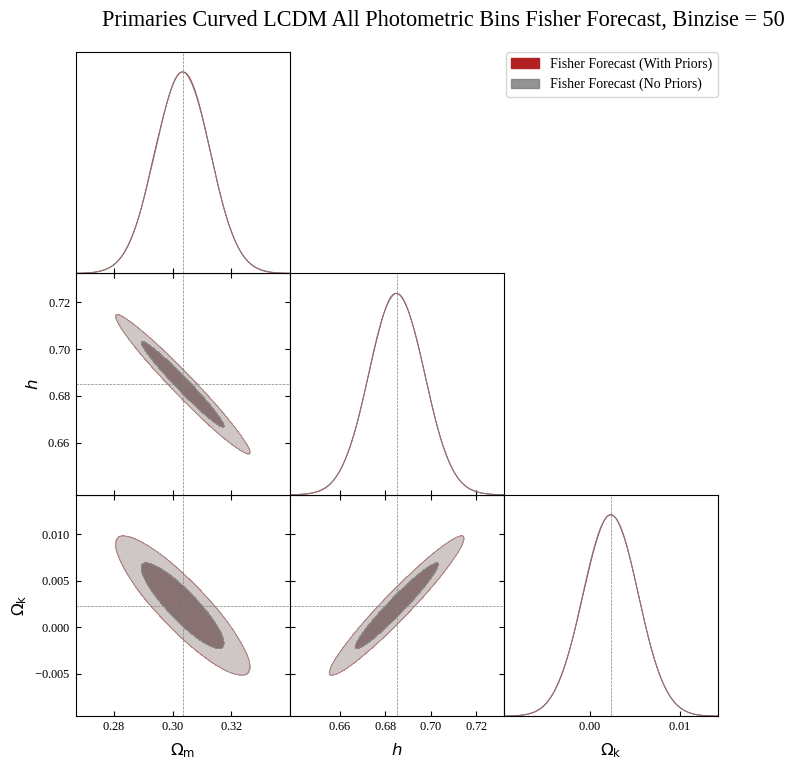

| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.2547\pm 0.0077$ | $\Omega_{c} = 0.255^{+0.015}_{-0.015}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.2547\pm 0.0077$ | $\Omega_{c} = 0.255^{+0.015}_{-0.015}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.0474\pm 0.0017$ | $\Omega_{b} = 0.0474^{+0.0033}_{-0.0033}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.0473\pm 0.0017$ | $\Omega_{b} = 0.0473^{+0.0033}_{-0.0033}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.685\pm 0.012$ | $h = 0.685^{+0.024}_{-0.024}$ |
|  | Fisher Forecast (No Priors) | $h = 0.685\pm 0.012$ | $h = 0.685^{+0.024}_{-0.024}$ |
| --- | --- | --- | --- |
| **$\Omega_k$** | Fisher Forecast (With Priors) | $\Omega_k = 0.0023\pm 0.0031$ | $\Omega_k = 0.0023^{+0.0060}_{-0.0060}$ |
|  | Fisher Forecast (No Priors) | $\Omega_k = 0.0023\pm 0.0031$ | $\Omega_k = 0.0023^{+0.0060}_{-0.0060}$ |
| --- | --- | --- | --- |
| **$A_s$** | Fisher Forecast (With Priors) | $A_s = \left(\,2.1150\pm 0.0066\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.115^{+0.013}_{-0.013}\,\right)\cdot 10^{-9}$ |
|  | Fisher Forecast (No Priors) | $A_s = \left(\,2.1150\pm 0.0066\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.115^{+0.013}_{-0.013}\,\right)\cdot 10^{-9}$ |
| --- | --- | --- | --- |
| **$n_s$** | Fisher Forecast (With Priors) | $n_s = 0.9649\pm 0.0034$ | $n_s = 0.9649^{+0.0067}_{-0.0068}$ |
|  | Fisher Forecast (No Priors) | $n_s = 0.9649\pm 0.0034$ | $n_s = 0.9649^{+0.0068}_{-0.0068}$ |
| --- | --- | --- | --- |

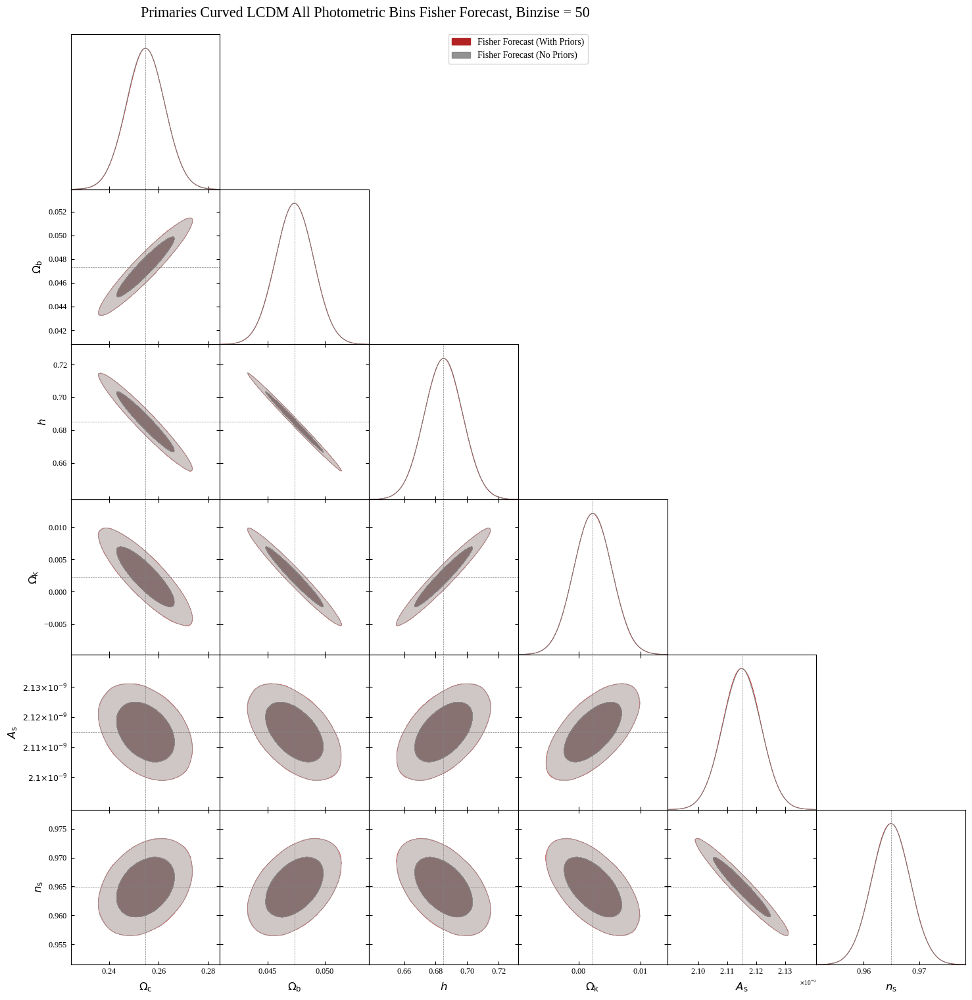

total_time:  0:02:37.045647


In [42]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=curved_LCDM_cosmology,
    lens_data=DESI_lens_data,
    source_data=HSC_dist_0_3,
    binsize=50,
    l_min =40,
    n_ell = 5000,
    f_sky = 0.4,
    magnification_bias_lenses = 0.8,
    linear_emulator = None,
    boost_emulator = None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=DESI_shot_noise,
    shape_noise_source=DESI_shape_noise,
    desired_spectra=['TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'Omega_k', 'A_s', 'n_s']
params_to_plot = ['Omega_m', 'h', 'Omega_k']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Fisher Matrices/Curved_LCDM_Primaries_All_Photometric_Bins_Binsize=50.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h Omega_k A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, Omega_k, A_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Covariance Matrices/Curved_LCDM_Primaries_All_Photometric_Bins_Binsize=50.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h Omega_k A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, Omega_k, A_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="Primaries Curved LCDM All Photometric Bins Fisher Forecast, Binzise = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

g2 = forecaster_c1.plot_with_cobaya_overlay(
    title="Primaries Curved LCDM All Photometric Bins Fisher Forecast, Binzise = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Plot successfully saved to: plots/Fisher Forecasts/so_primaries_curved_lcdm_fisher_forecast_bin_size_=_20.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3034\pm 0.0091$ | $\Omega_m = 0.303^{+0.018}_{-0.018}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3034\pm 0.0091$ | $\Omega_m = 0.303^{+0.018}_{-0.018}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.685\pm 0.012$ | $h = 0.685^{+0.023}_{-0.023}$ |
|  | Fisher Forecast (No Priors) | $h = 0.685\pm 0.012$ | $h = 0.685^{+0.023}_{-0.023}$ |
| --- | --- | --- | --- |
| **$\Omega_k$** | Fisher Forecast (With Priors) | $\Omega_k = 0.0023\pm 0.0030$ | $\Omega_k = 0.0023^{+0.0058}_{-0.0059}$ |
|  | Fisher Forecast (No Priors) | $\Omega_k = 0.0023\pm 0.0030$ | $\Omega_k = 0.0023^{+0.0058}_{-0.0059}$ |
| --- | --- | --- | --- |

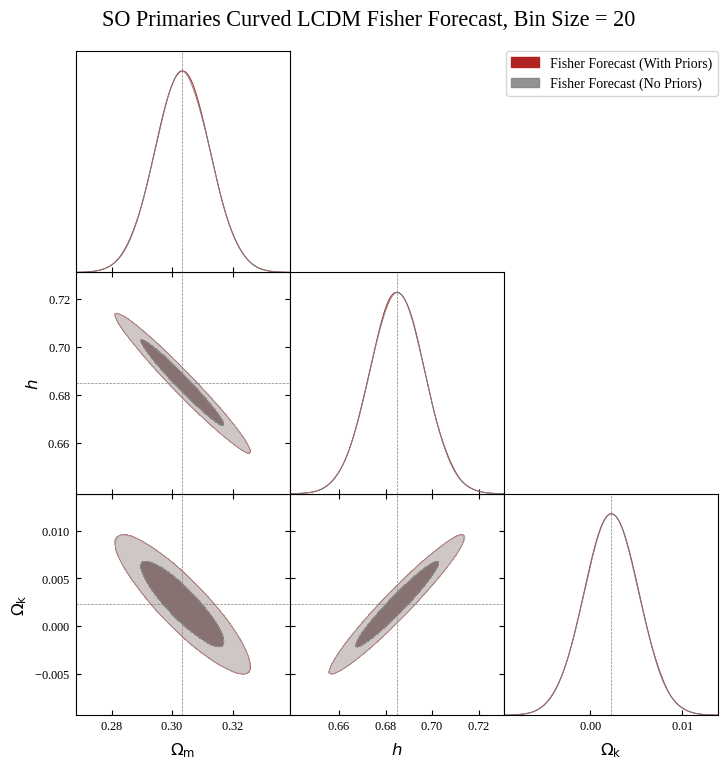

Plot successfully saved to: plots/Fisher Forecasts/so_primaries_curved_lcdm_fisher_forecast_bin_size_=_20_--_all_sampled_parameters_plotted.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.2547\pm 0.0075$ | $\Omega_{c} = 0.255^{+0.015}_{-0.015}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.2547\pm 0.0075$ | $\Omega_{c} = 0.255^{+0.015}_{-0.015}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.0473\pm 0.0016$ | $\Omega_{b} = 0.0473^{+0.0032}_{-0.0032}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.0473\pm 0.0016$ | $\Omega_{b} = 0.0473^{+0.0032}_{-0.0032}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.685\pm 0.012$ | $h = 0.685^{+0.023}_{-0.023}$ |
|  | Fisher Forecast (No Priors) | $h = 0.685\pm 0.012$ | $h = 0.685^{+0.023}_{-0.023}$ |
| --- | --- | --- | --- |
| **$\Omega_k$** | Fisher Forecast (With Priors) | $\Omega_k = 0.0023\pm 0.0030$ | $\Omega_k = 0.0023^{+0.0059}_{-0.0058}$ |
|  | Fisher Forecast (No Priors) | $\Omega_k = 0.0023\pm 0.0030$ | $\Omega_k = 0.0023^{+0.0059}_{-0.0059}$ |
| --- | --- | --- | --- |
| **$A_s$** | Fisher Forecast (With Priors) | $A_s = \left(\,2.1150\pm 0.0064\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.115^{+0.012}_{-0.012}\,\right)\cdot 10^{-9}$ |
|  | Fisher Forecast (No Priors) | $A_s = \left(\,2.1150\pm 0.0064\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.115^{+0.012}_{-0.012}\,\right)\cdot 10^{-9}$ |
| --- | --- | --- | --- |
| **$n_s$** | Fisher Forecast (With Priors) | $n_s = 0.9649\pm 0.0033$ | $n_s = 0.9649^{+0.0065}_{-0.0065}$ |
|  | Fisher Forecast (No Priors) | $n_s = 0.9649\pm 0.0033$ | $n_s = 0.9649^{+0.0065}_{-0.0065}$ |
| --- | --- | --- | --- |

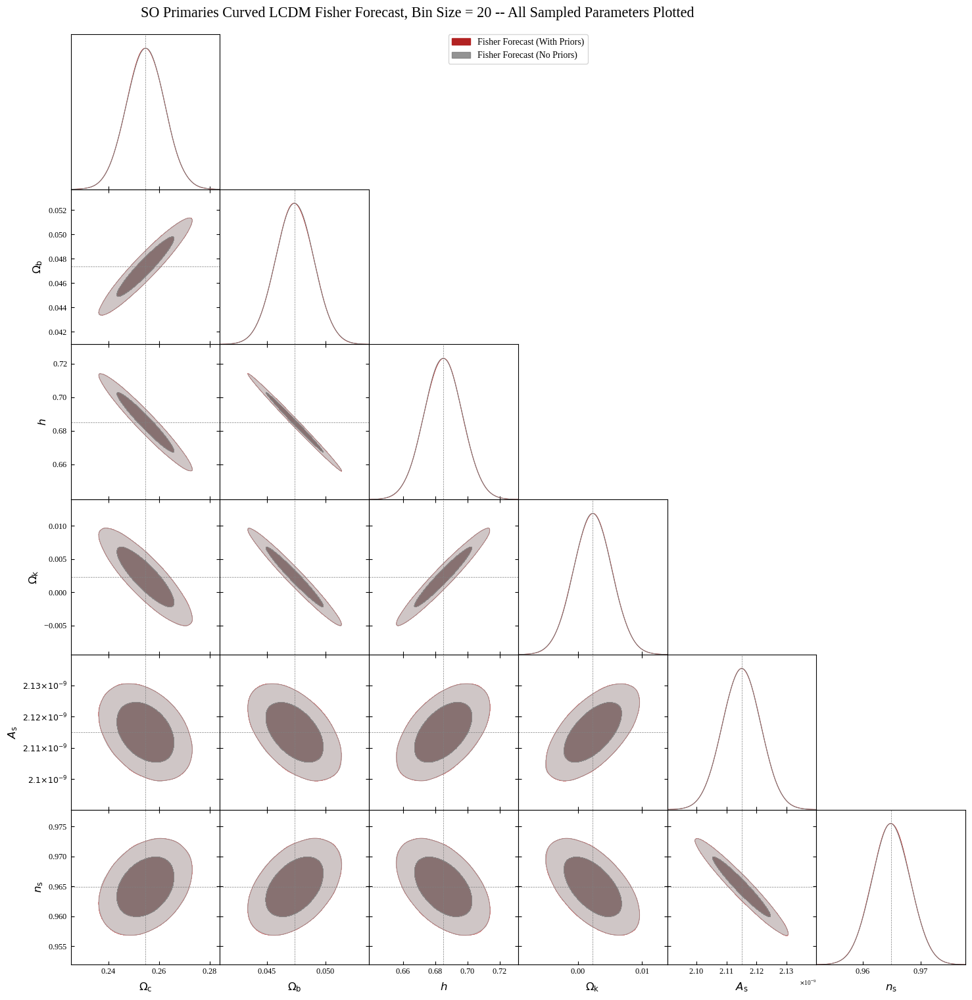

total_time:  0:04:08.860063


In [42]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=curved_LCDM_cosmology,
    lens_data=DESI_lens_data,
    source_data=HSC_dist_0_3,
    binsize=20,
    l_min =40,
    n_ell = 5000,
    f_sky = 0.4,
    magnification_bias_lenses = 0.8,
    linear_emulator = None,
    boost_emulator = None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=DESI_shot_noise,
    shape_noise_source=DESI_shape_noise,
    desired_spectra=['TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'Omega_k', 'A_s', 'n_s']
params_to_plot = ['Omega_m', 'h', 'Omega_k']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Curved_LCDM_Primaries_Binsize=20.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h Omega_k A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, Omega_k, A_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Curved_LCDM_Primaries_Binsize=20.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h Omega_k A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, Omega_k, A_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SO Primaries Curved LCDM Fisher Forecast, Bin Size = 20",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

g2 = forecaster_c1.plot_with_cobaya_overlay(
    title="SO Primaries Curved LCDM Fisher Forecast, Bin Size = 20 -- All Sampled Parameters Plotted",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

#### Lensing Ratios and Primaries

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3034\pm 0.0057$ | $\Omega_m = 0.303^{+0.011}_{-0.011}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3034\pm 0.0056$ | $\Omega_m = 0.303^{+0.011}_{-0.011}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6850\pm 0.0081$ | $h = 0.685^{+0.016}_{-0.016}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6850\pm 0.0081$ | $h = 0.685^{+0.016}_{-0.016}$ |
| --- | --- | --- | --- |
| **$\Omega_k$** | Fisher Forecast (With Priors) | $\Omega_k = 0.0023\pm 0.0022$ | $\Omega_k = 0.0023^{+0.0043}_{-0.0043}$ |
|  | Fisher Forecast (No Priors) | $\Omega_k = 0.0023\pm 0.0022$ | $\Omega_k = 0.0023^{+0.0043}_{-0.0043}$ |
| --- | --- | --- | --- |

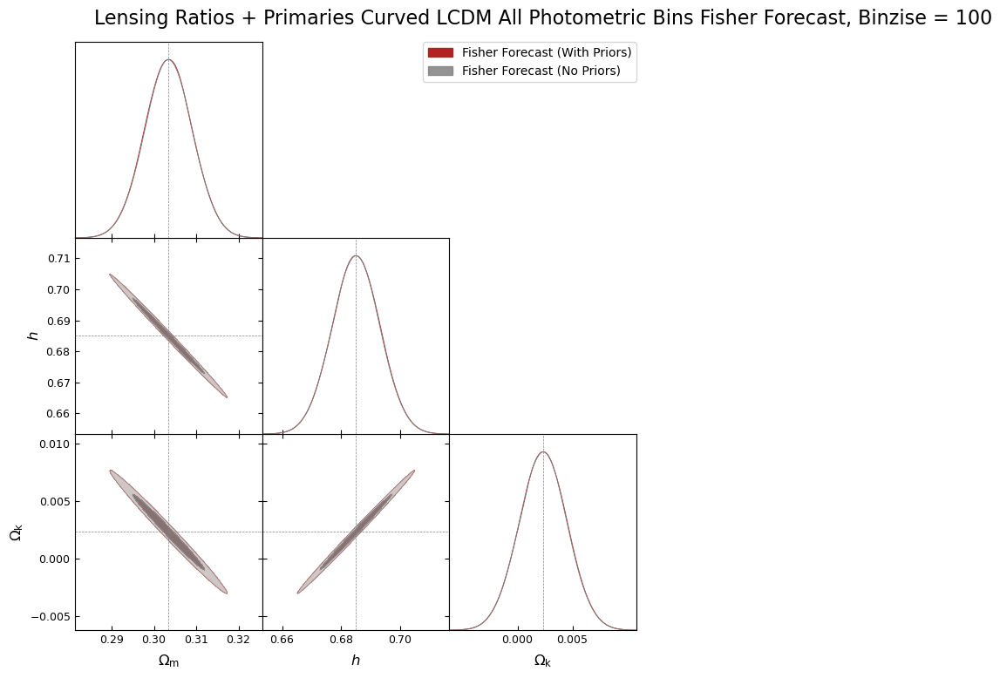

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.2547\pm 0.0045$ | $\Omega_{c} = 0.2547^{+0.0088}_{-0.0087}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.2547\pm 0.0045$ | $\Omega_{c} = 0.2547^{+0.0087}_{-0.0087}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.0473\pm 0.0012$ | $\Omega_{b} = 0.0473^{+0.0023}_{-0.0023}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.0473\pm 0.0012$ | $\Omega_{b} = 0.0473^{+0.0023}_{-0.0023}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6850\pm 0.0081$ | $h = 0.685^{+0.016}_{-0.016}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6850\pm 0.0081$ | $h = 0.685^{+0.016}_{-0.016}$ |
| --- | --- | --- | --- |
| **$\Omega_k$** | Fisher Forecast (With Priors) | $\Omega_k = 0.0023\pm 0.0022$ | $\Omega_k = 0.0023^{+0.0043}_{-0.0043}$ |
|  | Fisher Forecast (No Priors) | $\Omega_k = 0.0023\pm 0.0022$ | $\Omega_k = 0.0023^{+0.0043}_{-0.0043}$ |
| --- | --- | --- | --- |
| **$A_s$** | Fisher Forecast (With Priors) | $A_s = \left(\,2.1150\pm 0.0045\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.1150^{+0.0088}_{-0.0088}\,\right)\cdot 10^{-9}$ |
|  | Fisher Forecast (No Priors) | $A_s = \left(\,2.1150\pm 0.0045\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.1150^{+0.0088}_{-0.0088}\,\right)\cdot 10^{-9}$ |
| --- | --- | --- | --- |
| **$n_s$** | Fisher Forecast (With Priors) | $n_s = 0.9649\pm 0.0024$ | $n_s = 0.9649^{+0.0046}_{-0.0047}$ |
|  | Fisher Forecast (No Priors) | $n_s = 0.9649\pm 0.0024$ | $n_s = 0.9649^{+0.0047}_{-0.0047}$ |
| --- | --- | --- | --- |

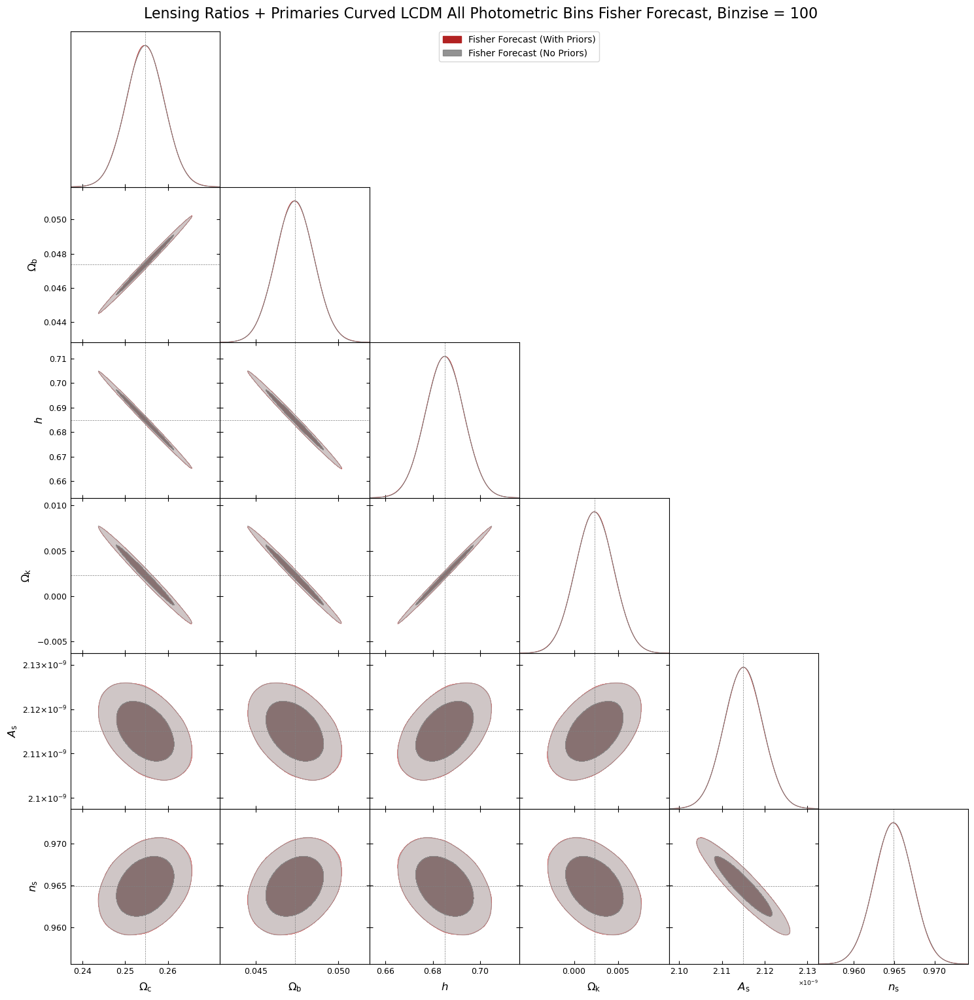

total_time:  0:08:45.072709


In [40]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=curved_LCDM_cosmology,
    lens_data=bgs_combined_array,
    source_data=HSC_dist_0_3,
    binsize=100,
    l_min =40,
    n_ell = 5000,
    f_sky = 0.4,
    magnification_bias_lenses = 0.8,
    linear_emulator = None,
    boost_emulator = None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=HSC_shape_noise,
    desired_spectra=['CG', 'GL', 'TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'Omega_k', 'A_s', 'n_s']
params_to_plot = ['Omega_m', 'h', 'Omega_k']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Fisher Matrices/Curved_LCDM_LRP_Photo_HSC_BGS_Binsize=100.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h Omega_k A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, Omega_k, A_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Covariance Matrices/Curved_LCDM_LRP_Photo_HSC_BGS_Binsize=100.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h Omega_k A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, Omega_k, A_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios + Primaries Curved LCDM All Photometric Bins Fisher Forecast, Binzise = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

g2 = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios + Primaries Curved LCDM All Photometric Bins Fisher Forecast, Binzise = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3034\pm 0.0055$ | $\Omega_m = 0.303^{+0.011}_{-0.011}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3034\pm 0.0055$ | $\Omega_m = 0.303^{+0.011}_{-0.011}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6850\pm 0.0078$ | $h = 0.685^{+0.015}_{-0.015}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6850\pm 0.0078$ | $h = 0.685^{+0.015}_{-0.015}$ |
| --- | --- | --- | --- |
| **$\Omega_k$** | Fisher Forecast (With Priors) | $\Omega_k = 0.0023\pm 0.0021$ | $\Omega_k = 0.0023^{+0.0041}_{-0.0042}$ |
|  | Fisher Forecast (No Priors) | $\Omega_k = 0.0023\pm 0.0021$ | $\Omega_k = 0.0023^{+0.0041}_{-0.0041}$ |
| --- | --- | --- | --- |

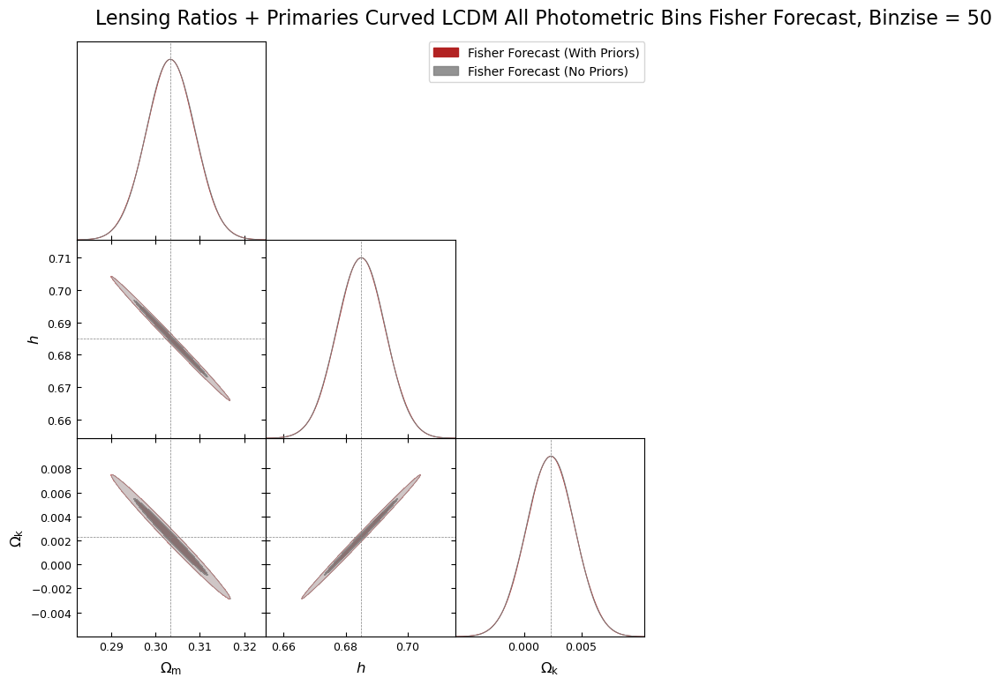

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.2547\pm 0.0043$ | $\Omega_{c} = 0.2547^{+0.0084}_{-0.0084}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.2547\pm 0.0043$ | $\Omega_{c} = 0.2547^{+0.0085}_{-0.0084}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.0473\pm 0.0011$ | $\Omega_{b} = 0.0473^{+0.0022}_{-0.0022}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.0474\pm 0.0011$ | $\Omega_{b} = 0.0474^{+0.0022}_{-0.0022}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6850\pm 0.0078$ | $h = 0.685^{+0.015}_{-0.015}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6850\pm 0.0078$ | $h = 0.685^{+0.015}_{-0.015}$ |
| --- | --- | --- | --- |
| **$\Omega_k$** | Fisher Forecast (With Priors) | $\Omega_k = 0.0023\pm 0.0021$ | $\Omega_k = 0.0023^{+0.0041}_{-0.0042}$ |
|  | Fisher Forecast (No Priors) | $\Omega_k = 0.0023\pm 0.0021$ | $\Omega_k = 0.0023^{+0.0041}_{-0.0041}$ |
| --- | --- | --- | --- |
| **$A_s$** | Fisher Forecast (With Priors) | $A_s = \left(\,2.1150\pm 0.0044\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.1150^{+0.0086}_{-0.0087}\,\right)\cdot 10^{-9}$ |
|  | Fisher Forecast (No Priors) | $A_s = \left(\,2.1150\pm 0.0044\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.1150^{+0.0086}_{-0.0086}\,\right)\cdot 10^{-9}$ |
| --- | --- | --- | --- |
| **$n_s$** | Fisher Forecast (With Priors) | $n_s = 0.9649\pm 0.0023$ | $n_s = 0.9649^{+0.0046}_{-0.0045}$ |
|  | Fisher Forecast (No Priors) | $n_s = 0.9649\pm 0.0023$ | $n_s = 0.9649^{+0.0045}_{-0.0045}$ |
| --- | --- | --- | --- |

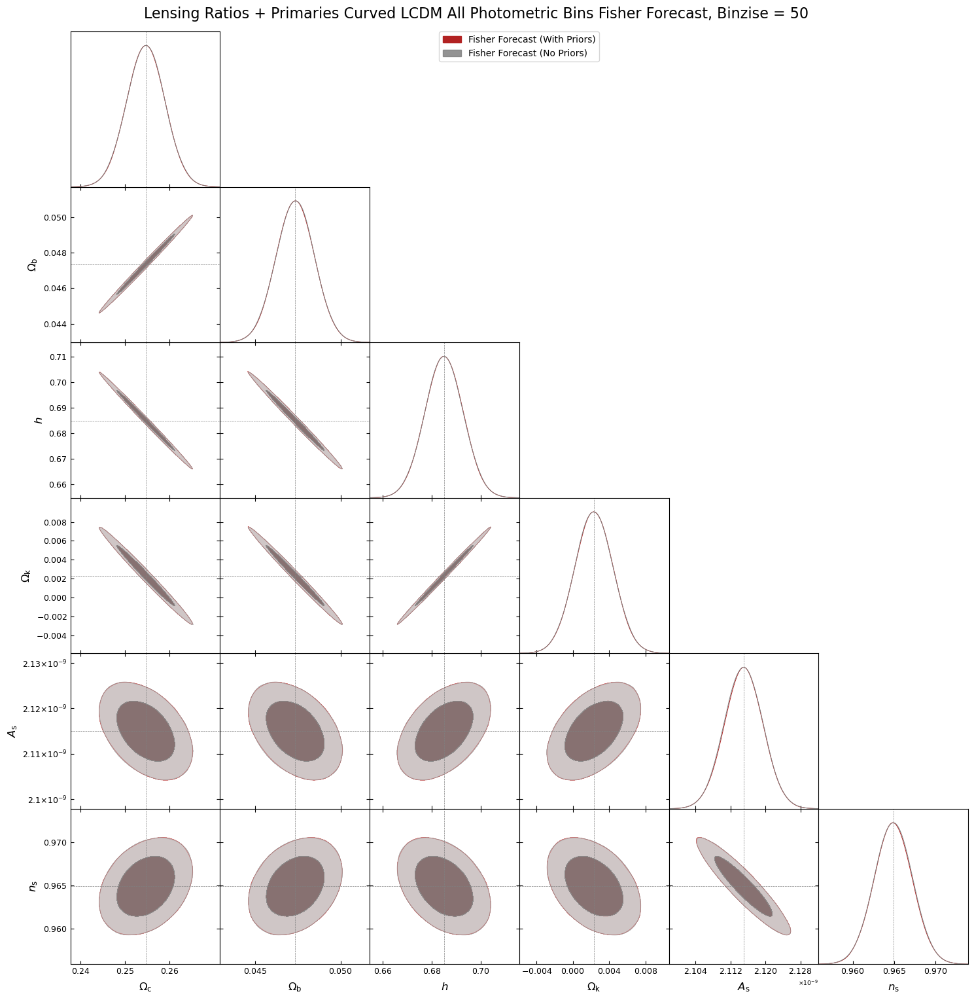

total_time:  0:09:03.532680


In [41]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=curved_LCDM_cosmology,
    lens_data=bgs_combined_array,
    source_data=HSC_dist_0_3,
    binsize=50,
    l_min =40,
    n_ell = 5000,
    f_sky = 0.4,
    magnification_bias_lenses = 0.8,
    linear_emulator = None,
    boost_emulator = None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=HSC_shape_noise,
    desired_spectra=['CG', 'GL', 'TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'Omega_k', 'A_s', 'n_s']
params_to_plot = ['Omega_m', 'h', 'Omega_k']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Fisher Matrices/Curved_LCDM_LRP_Photo_BGS_HSC_Binsize=50.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h Omega_k A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, Omega_k, A_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Covariance Matrices/Curved_LCDM_LRP_Photo_BGS_HSC_Binsize=50.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h Omega_k A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, Omega_k, A_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios + Primaries Curved LCDM All Photometric Bins Fisher Forecast, Binzise = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

g2 = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios + Primaries Curved LCDM All Photometric Bins Fisher Forecast, Binzise = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

In [42]:
# REPLACE

### Flat wCDM: $\Omega_m, h, w_0$

#### Lensing Ratios

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.309\pm 0.010$ | $\Omega_m = 0.309^{+0.020}_{-0.020}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = \Omega_\mathrm{m} < 0.319$ | $\Omega_m = \Omega_\mathrm{m} < 0.437$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.69^{+0.14}_{-0.18}$ | $h = 0.69^{+0.28}_{-0.25}$ |
|  | Fisher Forecast (No Priors) | $h = 0.68\pm 0.60$ | $h = 0.7^{+1.2}_{-1.2}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -0.971\pm 0.091$ | $w_0 = -0.97^{+0.18}_{-0.18}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.970\pm 0.092$ | $w_0 = -0.97^{+0.18}_{-0.18}$ |
| --- | --- | --- | --- |

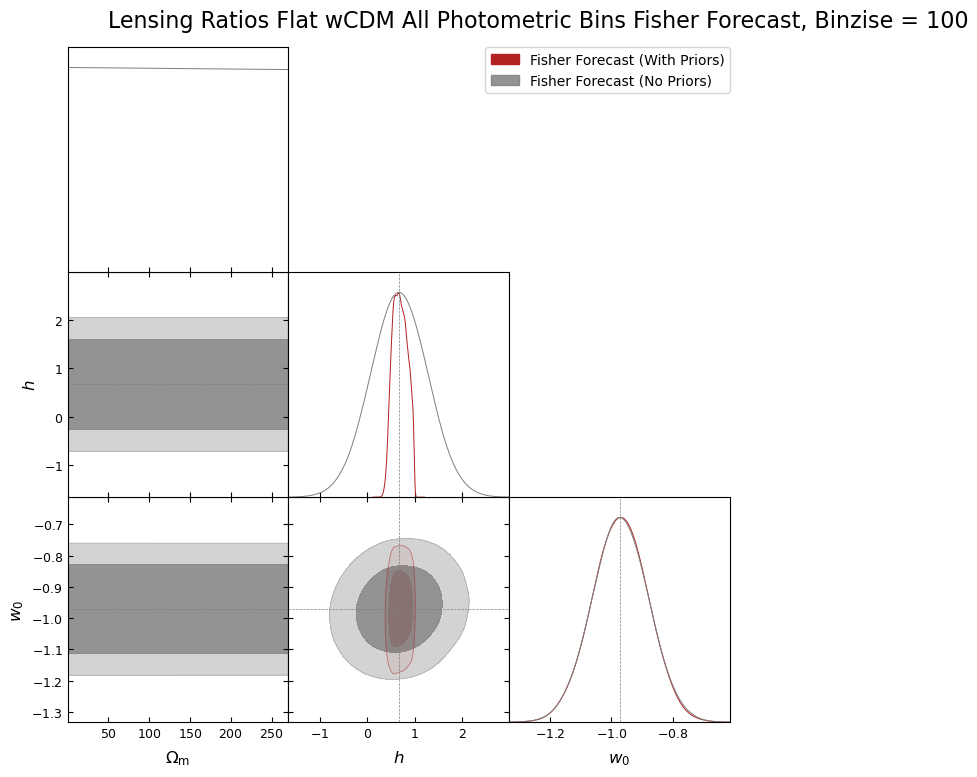

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.250^{+0.041}_{-0.025}$ | $\Omega_{c} = 0.250^{+0.053}_{-0.060}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.26\pm 0.11$ | $\Omega_{c} = 0.26^{+0.21}_{-0.21}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.057^{+0.016}_{-0.044}$ | $\Omega_{b} = 0.057^{+0.052}_{-0.046}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.05\pm 0.11$ | $\Omega_{b} = 0.05^{+0.22}_{-0.22}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.70^{+0.15}_{-0.18}$ | $h = 0.70^{+0.28}_{-0.25}$ |
|  | Fisher Forecast (No Priors) | $h = 0.67\pm 0.60$ | $h = 0.7^{+1.2}_{-1.2}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -0.971\pm 0.092$ | $w_0 = -0.97^{+0.18}_{-0.18}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.971\pm 0.092$ | $w_0 = -0.97^{+0.18}_{-0.18}$ |
| --- | --- | --- | --- |
| **$A_s$** | Fisher Forecast (With Priors) | $A_s = \left(\,2.18^{+0.25}_{-0.62}\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.18^{+0.81}_{-0.70}\,\right)\cdot 10^{-9}$ |
|  | Fisher Forecast (No Priors) | $A_s = \left(\,2.1\pm 1.4\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.1^{+2.7}_{-2.7}\,\right)\cdot 10^{-9}$ |
| --- | --- | --- | --- |
| **$n_s$** | Fisher Forecast (With Priors) | $n_s = 0.970^{+0.028}_{-0.039}$ | $n_s = 0.970^{+0.063}_{-0.058}$ |
|  | Fisher Forecast (No Priors) | $n_s = 0.97\pm 0.12$ | $n_s = 0.97^{+0.23}_{-0.23}$ |
| --- | --- | --- | --- |

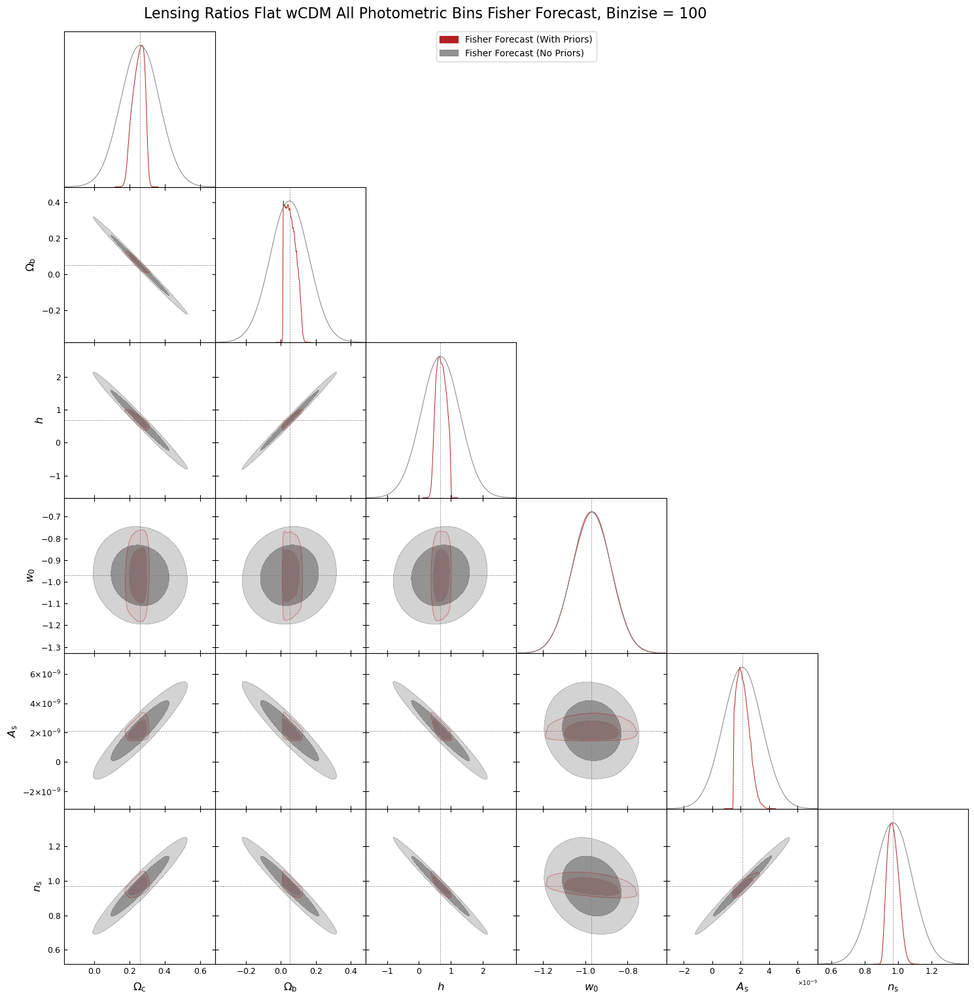

total_time:  0:01:49.357385


In [43]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_wCDM_cosmology,
    lens_data=bgs_combined_array,
    source_data=HSC_dist_0_3,
    binsize=100,
    l_min =40,
    n_ell = 5000,
    f_sky = 0.4,
    magnification_bias_lenses = 0.8,
    linear_emulator = None,
    boost_emulator = None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=None,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=HSC_shape_noise,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'w0', 'A_s', 'n_s']
params_to_plot = ['Omega_m', 'h', 'w0']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Fisher Matrices/Flat_wCDM_LR_Photo_HSC_BGS_Binsize=100.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h w0 A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, w0, A_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Covariance Matrices/Flat_wCDM_LR_Photo_HSC_BGS_Binsize=100.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h w0 A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, m_nu, h, w0, A_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios Flat wCDM All Photometric Bins Fisher Forecast, Binzise = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

g2 = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios Flat wCDM All Photometric Bins Fisher Forecast, Binzise = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3091\pm 0.0096$ | $\Omega_m = 0.309^{+0.019}_{-0.019}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = \Omega_\mathrm{m} < 0.318$ | $\Omega_m = \Omega_\mathrm{m} < 0.379$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.69^{+0.14}_{-0.18}$ | $h = 0.69^{+0.28}_{-0.25}$ |
|  | Fisher Forecast (No Priors) | $h = 0.67\pm 0.42$ | $h = 0.67^{+0.81}_{-0.81}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -0.971\pm 0.090$ | $w_0 = -0.97^{+0.18}_{-0.18}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.970\pm 0.090$ | $w_0 = -0.97^{+0.18}_{-0.18}$ |
| --- | --- | --- | --- |

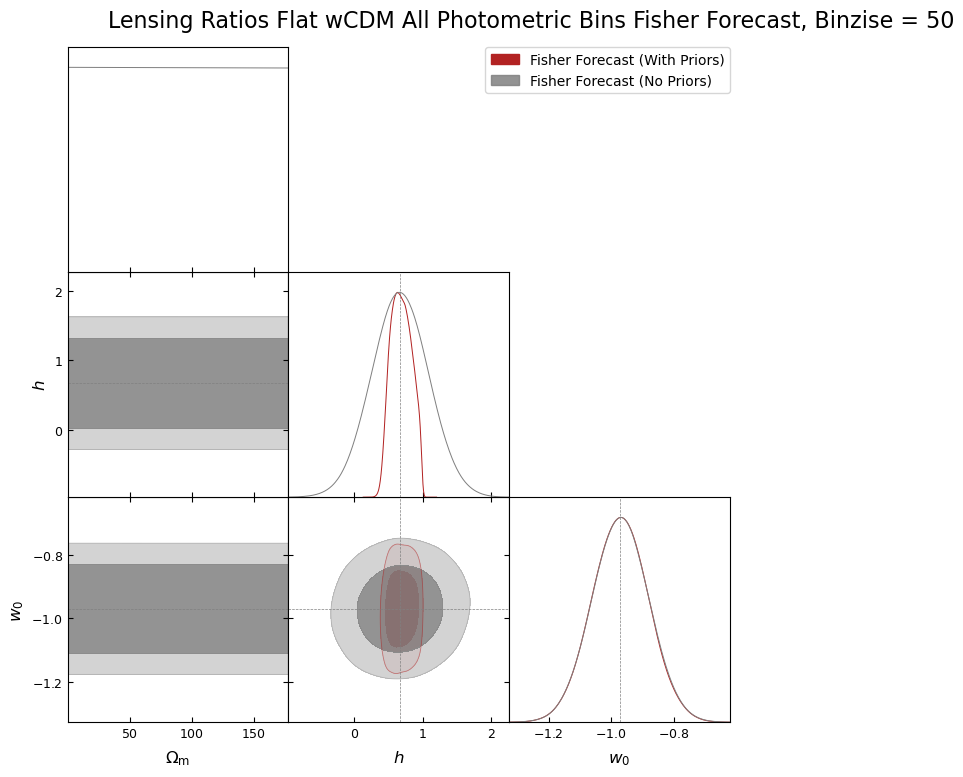

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.252^{+0.038}_{-0.023}$ | $\Omega_{c} = 0.252^{+0.050}_{-0.058}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.259\pm 0.074$ | $\Omega_{c} = 0.26^{+0.15}_{-0.15}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.056^{+0.015}_{-0.043}$ | $\Omega_{b} = 0.056^{+0.051}_{-0.045}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.049\pm 0.076$ | $\Omega_{b} = 0.05^{+0.15}_{-0.15}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.69^{+0.14}_{-0.18}$ | $h = 0.69^{+0.28}_{-0.25}$ |
|  | Fisher Forecast (No Priors) | $h = 0.67\pm 0.42$ | $h = 0.67^{+0.81}_{-0.82}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -0.971\pm 0.090$ | $w_0 = -0.97^{+0.17}_{-0.18}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.971\pm 0.090$ | $w_0 = -0.97^{+0.18}_{-0.18}$ |
| --- | --- | --- | --- |
| **$A_s$** | Fisher Forecast (With Priors) | $A_s = \left(\,2.18^{+0.26}_{-0.60}\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.18^{+0.79}_{-0.69}\,\right)\cdot 10^{-9}$ |
|  | Fisher Forecast (No Priors) | $A_s = \left(\,2.1\pm 1.0\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.1^{+2.0}_{-2.0}\,\right)\cdot 10^{-9}$ |
| --- | --- | --- | --- |
| **$n_s$** | Fisher Forecast (With Priors) | $n_s = 0.970^{+0.029}_{-0.038}$ | $n_s = 0.970^{+0.062}_{-0.058}$ |
|  | Fisher Forecast (No Priors) | $n_s = 0.970\pm 0.082$ | $n_s = 0.97^{+0.16}_{-0.16}$ |
| --- | --- | --- | --- |

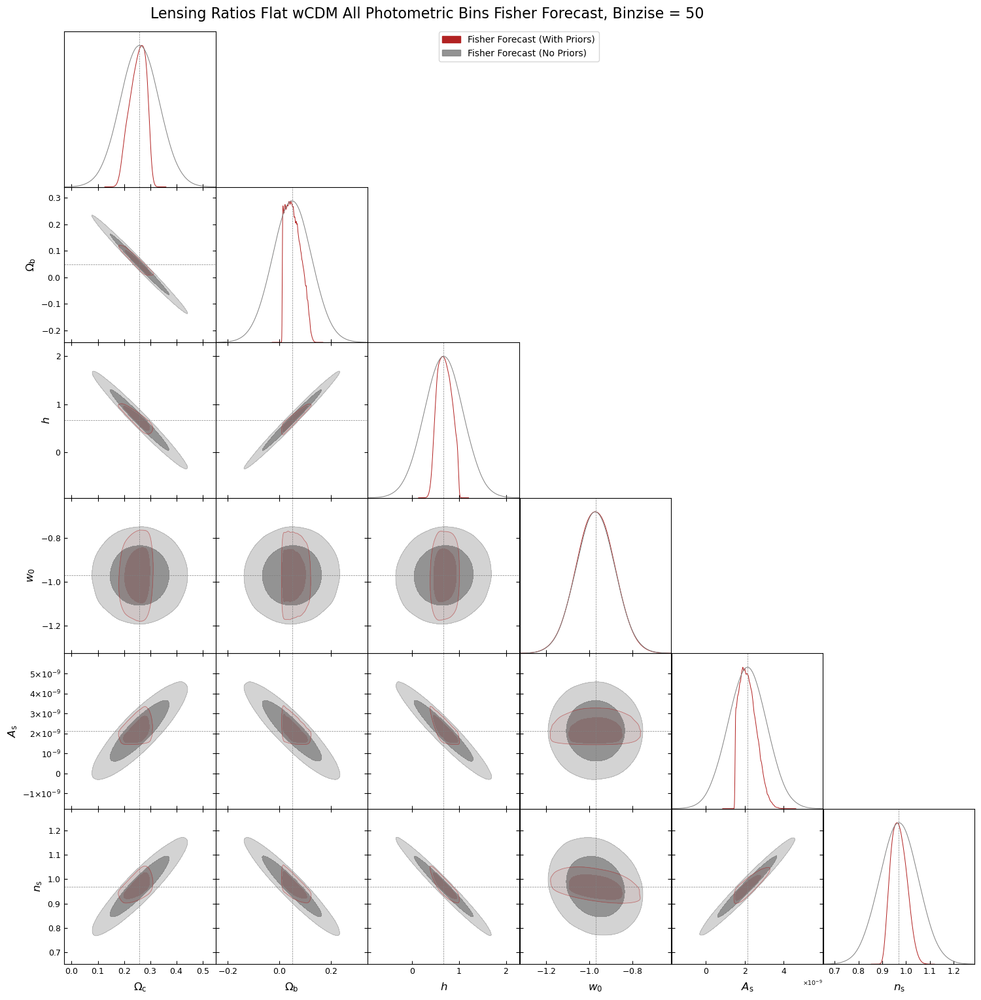

total_time:  0:01:53.639384


In [44]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_wCDM_cosmology,
    lens_data=bgs_combined_array,
    source_data=HSC_dist_0_3,
    binsize=50,
    l_min =40,
    n_ell = 5000,
    f_sky = 0.4,
    magnification_bias_lenses = 0.8,
    linear_emulator = None,
    boost_emulator = None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=None,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=HSC_shape_noise,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'w0', 'A_s', 'n_s']
params_to_plot = ['Omega_m', 'h', 'w0']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Fisher Matrices/Flat_wCDM_LR_Photo_HSC_BGS_Binsize=50.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h w0 A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, w0, A_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Covariance Matrices/Flat_wCDM_LR_Photo_HSC_BGS_Binsize=50.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h w0 A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, m_nu, h, w0, A_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios Flat wCDM All Photometric Bins Fisher Forecast, Binzise = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

g2 = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios Flat wCDM All Photometric Bins Fisher Forecast, Binzise = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

In [45]:
# REPLACE

#### Primaries

| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3098\pm 0.0024$ | $\Omega_m = 0.3098^{+0.0047}_{-0.0047}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3098\pm 0.0024$ | $\Omega_m = 0.3098^{+0.0047}_{-0.0047}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6734\pm 0.0029$ | $h = 0.6734^{+0.0057}_{-0.0057}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6734\pm 0.0029$ | $h = 0.6734^{+0.0058}_{-0.0057}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -0.971\pm 0.016$ | $w_0 = -0.971^{+0.032}_{-0.032}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.971\pm 0.016$ | $w_0 = -0.971^{+0.032}_{-0.032}$ |
| --- | --- | --- | --- |

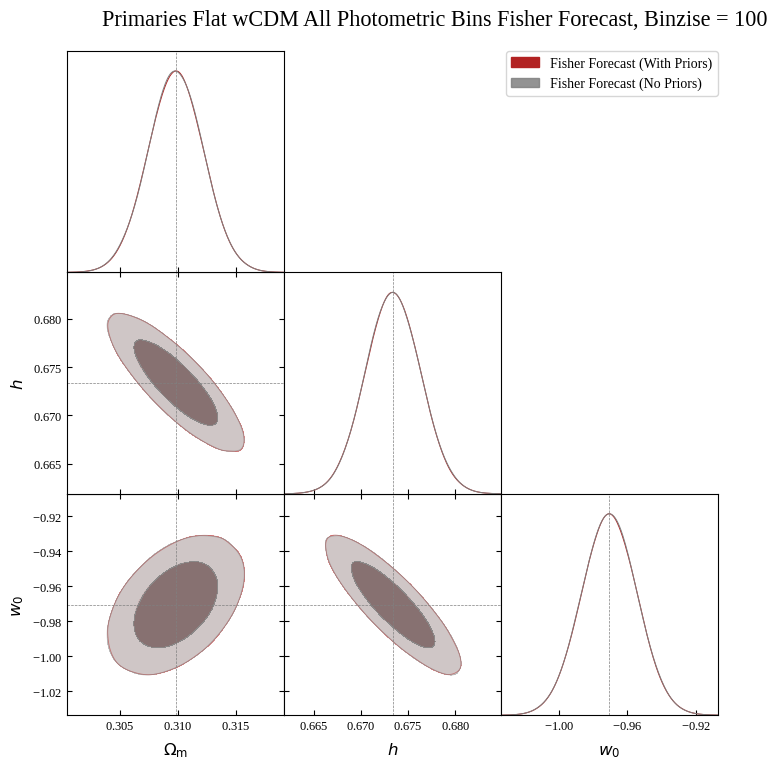

| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.2591\pm 0.0021$ | $\Omega_{c} = 0.2591^{+0.0040}_{-0.0041}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.2591\pm 0.0021$ | $\Omega_{c} = 0.2591^{+0.0040}_{-0.0041}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.04929\pm 0.00049$ | $\Omega_{b} = 0.04929^{+0.00097}_{-0.00096}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.04929\pm 0.00049$ | $\Omega_{b} = 0.04929^{+0.00097}_{-0.00097}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6734\pm 0.0029$ | $h = 0.6734^{+0.0058}_{-0.0057}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6734\pm 0.0029$ | $h = 0.6734^{+0.0058}_{-0.0057}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -0.971\pm 0.016$ | $w_0 = -0.971^{+0.032}_{-0.032}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.971\pm 0.016$ | $w_0 = -0.971^{+0.032}_{-0.032}$ |
| --- | --- | --- | --- |
| **$A_s$** | Fisher Forecast (With Priors) | $A_s = \left(\,2.1270\pm 0.0053\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.127^{+0.010}_{-0.010}\,\right)\cdot 10^{-9}$ |
|  | Fisher Forecast (No Priors) | $A_s = \left(\,2.1270\pm 0.0053\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.127^{+0.010}_{-0.010}\,\right)\cdot 10^{-9}$ |
| --- | --- | --- | --- |
| **$n_s$** | Fisher Forecast (With Priors) | $n_s = 0.9699\pm 0.0029$ | $n_s = 0.9699^{+0.0056}_{-0.0057}$ |
|  | Fisher Forecast (No Priors) | $n_s = 0.9699\pm 0.0029$ | $n_s = 0.9699^{+0.0056}_{-0.0057}$ |
| --- | --- | --- | --- |

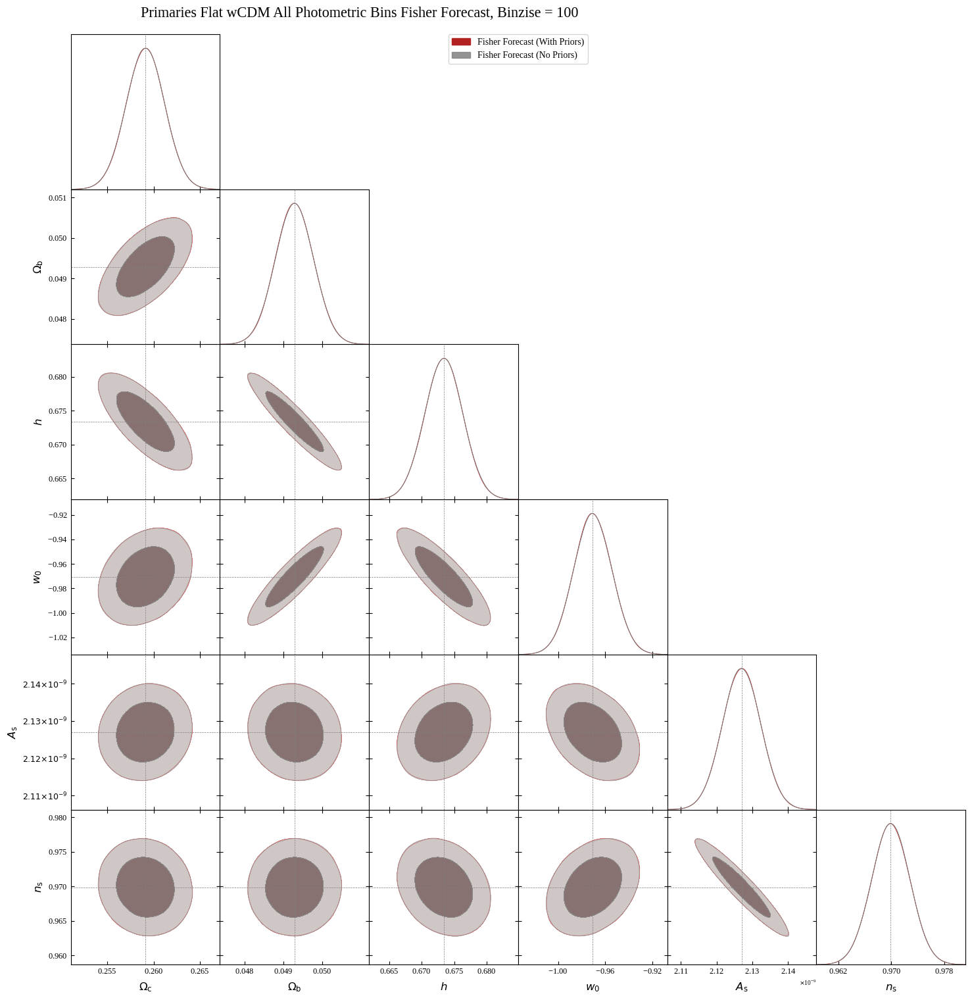

total_time:  0:01:59.680783


In [50]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_wCDM_cosmology,
    lens_data=DESI_lens_data,
    source_data=HSC_dist_0_3,
    binsize=100,
    l_min =40,
    n_ell = 5000,
    f_sky = 0.4,
    magnification_bias_lenses = 0.8,
    linear_emulator = None,
    boost_emulator = None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=DESI_shot_noise,
    shape_noise_source=DESI_shape_noise,
    desired_spectra=['TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'w0', 'A_s', 'n_s']
params_to_plot = ['Omega_m', 'h', 'w0']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Fisher Matrices/Flat_wCDM_Primaries_All_Photometric_Bins_Binsize=100.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h w0 A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, m_nu, h, w0, A_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Covariance Matrices/Flat_wCDM_Primaries_All_Photometric_Bins_Binsize=100.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h w0 A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, m_nu, h, w0, A_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="Primaries Flat wCDM All Photometric Bins Fisher Forecast, Binzise = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

g2 = forecaster_c1.plot_with_cobaya_overlay(
    title="Primaries Flat wCDM All Photometric Bins Fisher Forecast, Binzise = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3098\pm 0.0023$ | $\Omega_m = 0.3098^{+0.0045}_{-0.0045}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3098\pm 0.0023$ | $\Omega_m = 0.3098^{+0.0045}_{-0.0045}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6734\pm 0.0028$ | $h = 0.6734^{+0.0055}_{-0.0055}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6734\pm 0.0028$ | $h = 0.6734^{+0.0055}_{-0.0055}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -0.971\pm 0.015$ | $w_0 = -0.971^{+0.029}_{-0.029}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.971\pm 0.015$ | $w_0 = -0.971^{+0.029}_{-0.030}$ |
| --- | --- | --- | --- |

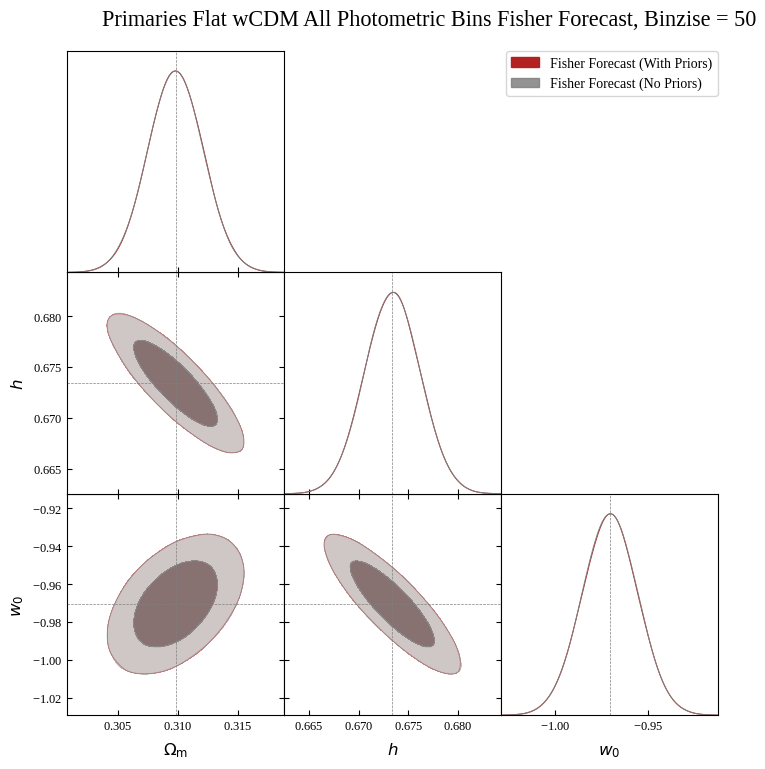

| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.2591\pm 0.0020$ | $\Omega_{c} = 0.2591^{+0.0039}_{-0.0039}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.2591\pm 0.0020$ | $\Omega_{c} = 0.2591^{+0.0039}_{-0.0039}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.04929\pm 0.00047$ | $\Omega_{b} = 0.04929^{+0.00092}_{-0.00092}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.04929\pm 0.00047$ | $\Omega_{b} = 0.04929^{+0.00092}_{-0.00091}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6734\pm 0.0028$ | $h = 0.6734^{+0.0055}_{-0.0055}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6734\pm 0.0028$ | $h = 0.6734^{+0.0055}_{-0.0055}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -0.971\pm 0.015$ | $w_0 = -0.971^{+0.030}_{-0.029}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.971\pm 0.015$ | $w_0 = -0.971^{+0.030}_{-0.030}$ |
| --- | --- | --- | --- |
| **$A_s$** | Fisher Forecast (With Priors) | $A_s = \left(\,2.1270\pm 0.0051\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.1270^{+0.0099}_{-0.010}\,\right)\cdot 10^{-9}$ |
|  | Fisher Forecast (No Priors) | $A_s = \left(\,2.1270\pm 0.0051\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.1270^{+0.0099}_{-0.010}\,\right)\cdot 10^{-9}$ |
| --- | --- | --- | --- |
| **$n_s$** | Fisher Forecast (With Priors) | $n_s = 0.9699\pm 0.0027$ | $n_s = 0.9699^{+0.0054}_{-0.0054}$ |
|  | Fisher Forecast (No Priors) | $n_s = 0.9699\pm 0.0028$ | $n_s = 0.9699^{+0.0054}_{-0.0054}$ |
| --- | --- | --- | --- |

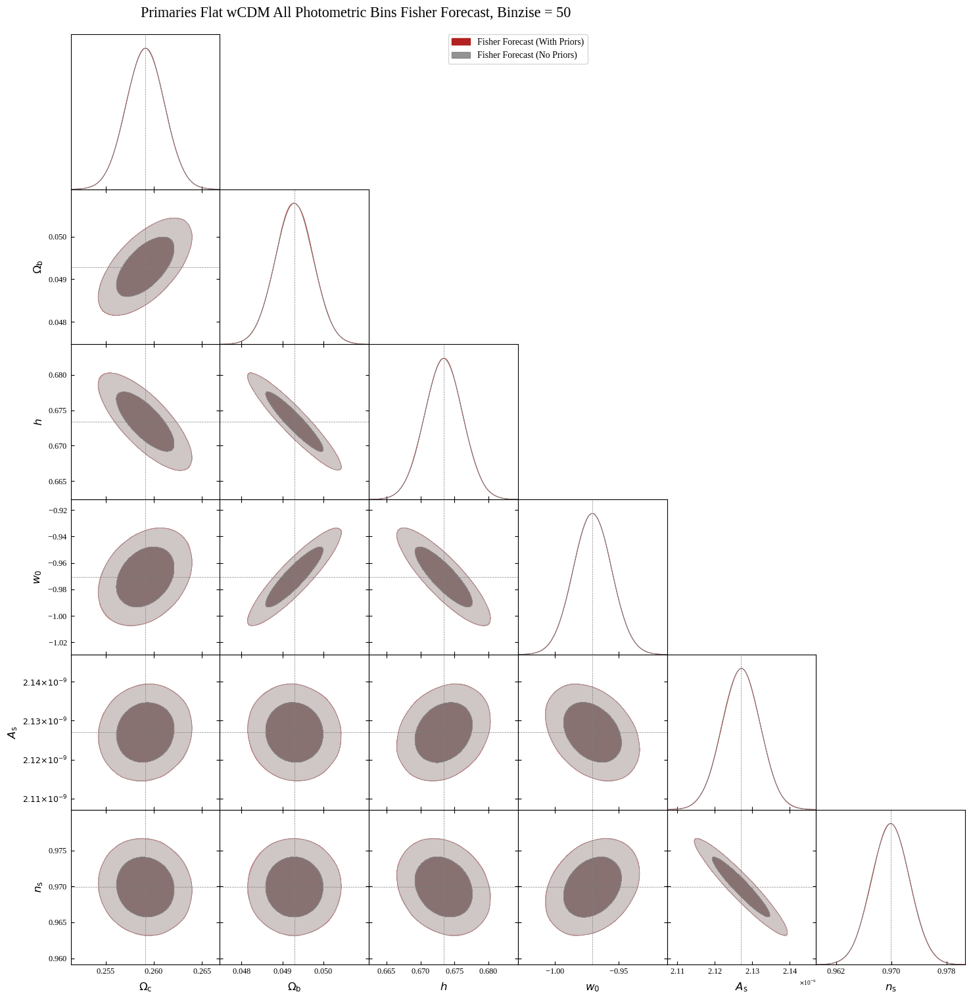

total_time:  0:02:31.417082


In [51]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_wCDM_cosmology,
    lens_data=DESI_lens_data,
    source_data=HSC_dist_0_3,
    binsize=50,
    l_min =40,
    n_ell = 5000,
    f_sky = 0.4,
    magnification_bias_lenses = 0.8,
    linear_emulator = None,
    boost_emulator = None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=DESI_shot_noise,
    shape_noise_source=DESI_shape_noise,
    desired_spectra=['TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'w0', 'A_s', 'n_s']
params_to_plot = ['Omega_m', 'h', 'w0']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Fisher Matrices/Flat_wCDM_Primaries_All_Photometric_Bins_Binsize=50.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h w0 A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, m_nu, h, w0, A_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Covariance Matrices/Flat_wCDM_Primaries_All_Photometric_Bins_Binsize=50.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h w0 A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, m_nu, h, w0, A_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="Primaries Flat wCDM All Photometric Bins Fisher Forecast, Binzise = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

g2 = forecaster_c1.plot_with_cobaya_overlay(
    title="Primaries Flat wCDM All Photometric Bins Fisher Forecast, Binzise = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Plot successfully saved to: plots/Fisher Forecasts/so_primaries_flat_wcdm_fisher_forecast_bin_size_=_20.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3098\pm 0.0023$ | $\Omega_m = 0.3098^{+0.0045}_{-0.0045}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3098\pm 0.0023$ | $\Omega_m = 0.3098^{+0.0045}_{-0.0045}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6734\pm 0.0028$ | $h = 0.6734^{+0.0054}_{-0.0054}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6734\pm 0.0028$ | $h = 0.6734^{+0.0054}_{-0.0054}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -0.971\pm 0.015$ | $w_0 = -0.971^{+0.029}_{-0.029}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.971\pm 0.015$ | $w_0 = -0.971^{+0.029}_{-0.029}$ |
| --- | --- | --- | --- |

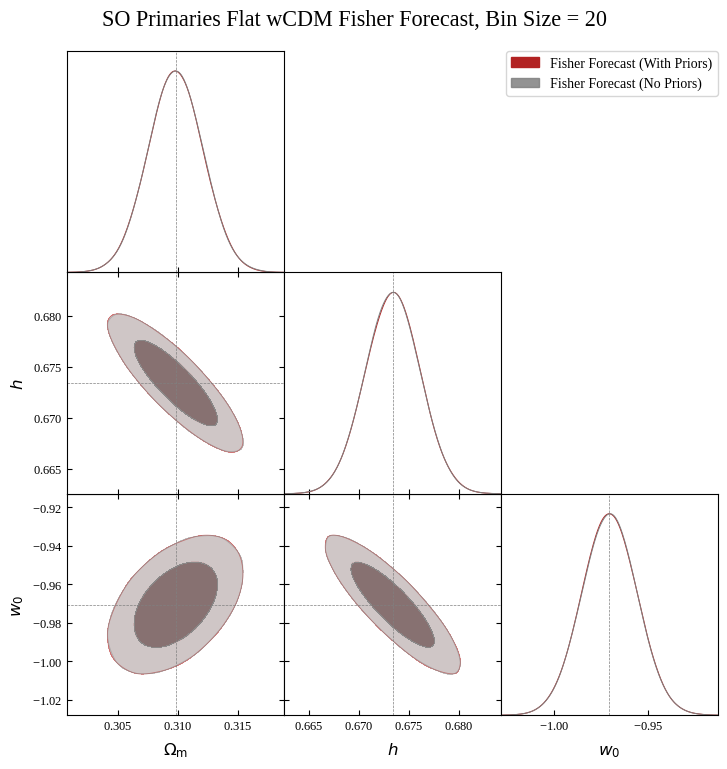

Plot successfully saved to: plots/Fisher Forecasts/so_primaries_flat_wcdm_fisher_forecast_bin_size_=_20_--_all_sampled_parameters_plotted.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.2591\pm 0.0020$ | $\Omega_{c} = 0.2591^{+0.0039}_{-0.0039}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.2591\pm 0.0020$ | $\Omega_{c} = 0.2591^{+0.0039}_{-0.0039}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.04929\pm 0.00046$ | $\Omega_{b} = 0.04929^{+0.00090}_{-0.00090}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.04929\pm 0.00046$ | $\Omega_{b} = 0.04929^{+0.00090}_{-0.00090}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6734\pm 0.0028$ | $h = 0.6734^{+0.0054}_{-0.0054}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6734\pm 0.0028$ | $h = 0.6734^{+0.0054}_{-0.0054}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -0.971\pm 0.015$ | $w_0 = -0.971^{+0.029}_{-0.029}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.971\pm 0.015$ | $w_0 = -0.971^{+0.029}_{-0.029}$ |
| --- | --- | --- | --- |
| **$A_s$** | Fisher Forecast (With Priors) | $A_s = \left(\,2.1270\pm 0.0050\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.1270^{+0.0097}_{-0.0097}\,\right)\cdot 10^{-9}$ |
|  | Fisher Forecast (No Priors) | $A_s = \left(\,2.1270\pm 0.0049\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.1270^{+0.0097}_{-0.0097}\,\right)\cdot 10^{-9}$ |
| --- | --- | --- | --- |
| **$n_s$** | Fisher Forecast (With Priors) | $n_s = 0.9699\pm 0.0027$ | $n_s = 0.9699^{+0.0053}_{-0.0053}$ |
|  | Fisher Forecast (No Priors) | $n_s = 0.9699\pm 0.0027$ | $n_s = 0.9699^{+0.0053}_{-0.0053}$ |
| --- | --- | --- | --- |

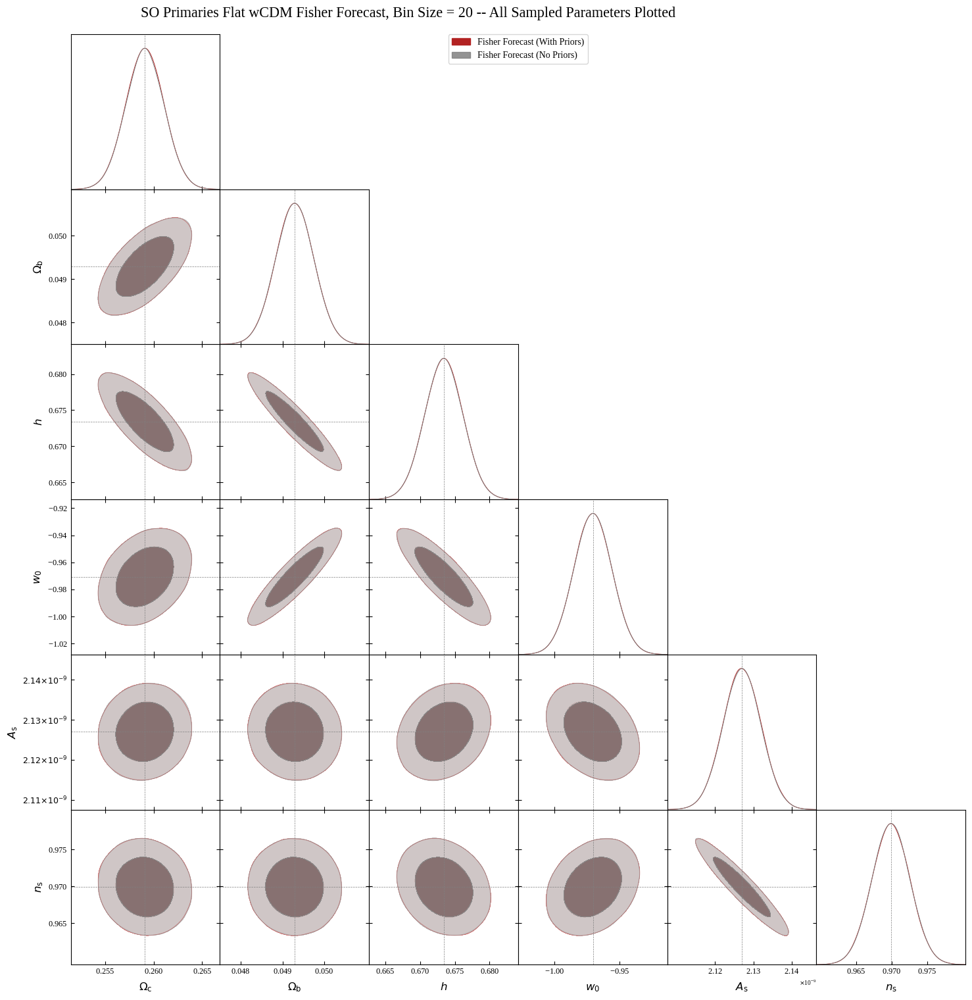

total_time:  0:03:57.775030


In [21]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_wCDM_cosmology,
    lens_data=DESI_lens_data,
    source_data=HSC_dist_0_3,
    binsize=20,
    l_min =40,
    n_ell = 5000,
    f_sky = 0.4,
    magnification_bias_lenses = 0.8,
    linear_emulator = None,
    boost_emulator = None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=DESI_shot_noise,
    shape_noise_source=DESI_shape_noise,
    desired_spectra=['TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'w0', 'A_s', 'n_s']
params_to_plot = ['Omega_m', 'h', 'w0']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_wCDM_Primaries_Binsize=20.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h w0 A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, w0, A_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_wCDM_Primaries_Binsize=20.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h w0 A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, w0, A_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SO Primaries Flat wCDM Fisher Forecast, Bin Size = 20",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

# Call the unified class method to load, sample, overlay, and plot everything
g2 = forecaster_c1.plot_with_cobaya_overlay(
    title="SO Primaries Flat wCDM Fisher Forecast, Bin Size = 20 -- All Sampled Parameters Plotted",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

#### Lensing Ratios and Primaries

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3098\pm 0.0022$ | $\Omega_m = 0.3098^{+0.0044}_{-0.0044}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3098\pm 0.0023$ | $\Omega_m = 0.3098^{+0.0044}_{-0.0044}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6734\pm 0.0023$ | $h = 0.6734^{+0.0045}_{-0.0045}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6734\pm 0.0023$ | $h = 0.6734^{+0.0045}_{-0.0045}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -0.9706\pm 0.0070$ | $w_0 = -0.971^{+0.014}_{-0.014}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.9706\pm 0.0070$ | $w_0 = -0.971^{+0.014}_{-0.014}$ |
| --- | --- | --- | --- |

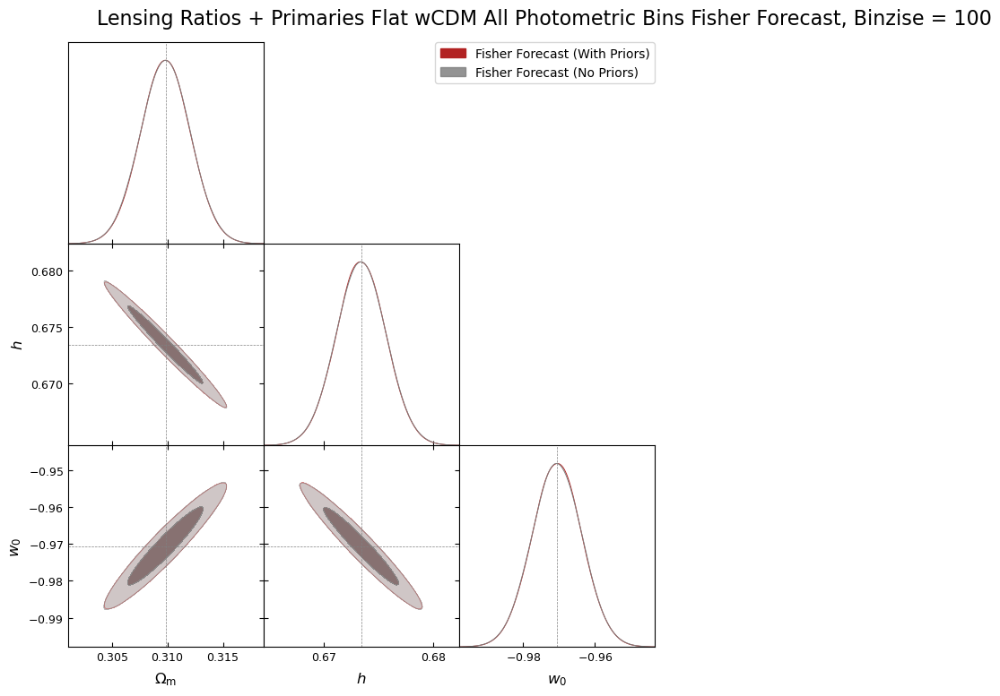

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.2591\pm 0.0019$ | $\Omega_{c} = 0.2591^{+0.0037}_{-0.0037}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.2591\pm 0.0019$ | $\Omega_{c} = 0.2591^{+0.0037}_{-0.0037}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.04929\pm 0.00036$ | $\Omega_{b} = 0.04929^{+0.00070}_{-0.00070}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.04929\pm 0.00036$ | $\Omega_{b} = 0.04929^{+0.00070}_{-0.00070}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6734\pm 0.0023$ | $h = 0.6734^{+0.0045}_{-0.0045}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6734\pm 0.0023$ | $h = 0.6734^{+0.0045}_{-0.0045}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -0.9706\pm 0.0070$ | $w_0 = -0.971^{+0.014}_{-0.014}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.9706\pm 0.0070$ | $w_0 = -0.971^{+0.014}_{-0.014}$ |
| --- | --- | --- | --- |
| **$A_s$** | Fisher Forecast (With Priors) | $A_s = \left(\,2.1270\pm 0.0040\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.1270^{+0.0079}_{-0.0079}\,\right)\cdot 10^{-9}$ |
|  | Fisher Forecast (No Priors) | $A_s = \left(\,2.1270\pm 0.0040\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.1270^{+0.0079}_{-0.0079}\,\right)\cdot 10^{-9}$ |
| --- | --- | --- | --- |
| **$n_s$** | Fisher Forecast (With Priors) | $n_s = 0.9699\pm 0.0022$ | $n_s = 0.9699^{+0.0042}_{-0.0042}$ |
|  | Fisher Forecast (No Priors) | $n_s = 0.9699\pm 0.0022$ | $n_s = 0.9699^{+0.0042}_{-0.0042}$ |
| --- | --- | --- | --- |

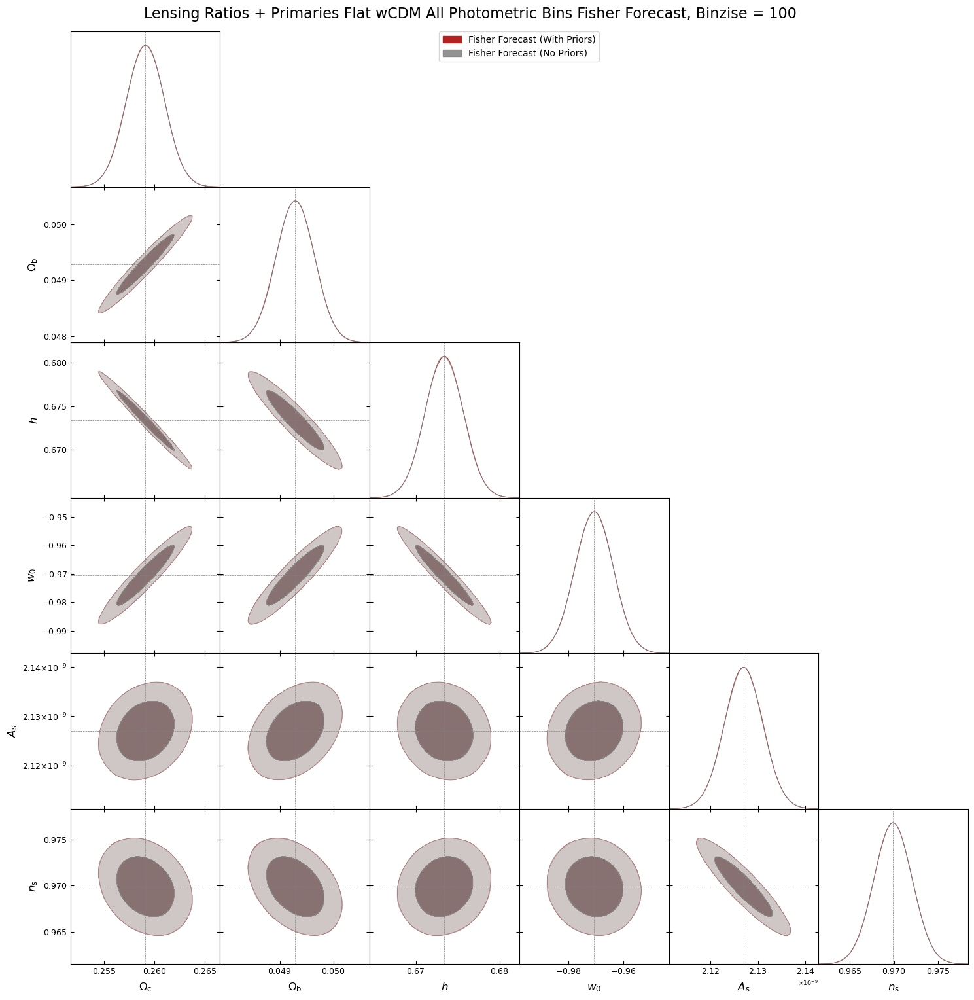

total_time:  0:03:01.745060


In [46]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_wCDM_cosmology,
    lens_data=bgs_combined_array,
    source_data=HSC_dist_0_3,
    binsize=100,
    l_min =40,
    n_ell = 5000,
    f_sky = 0.4,
    magnification_bias_lenses = 0.8,
    linear_emulator = None,
    boost_emulator = None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=HSC_shape_noise,
    desired_spectra=['CG', 'GL', 'TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'w0', 'A_s', 'n_s']
params_to_plot = ['Omega_m', 'h', 'w0']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Fisher Matrices/Flat_wCDM_LRP_Photo_HSC_BGS_Binsize=100.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h w0 A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, w0, A_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Covariance Matrices/Flat_wCDM_LRP_Photo_HSC_BGS_Binsize=100.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h w0 A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, w0, A_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios + Primaries Flat wCDM All Photometric Bins Fisher Forecast, Binzise = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

g2 = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios + Primaries Flat wCDM All Photometric Bins Fisher Forecast, Binzise = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3098\pm 0.0022$ | $\Omega_m = 0.3098^{+0.0043}_{-0.0043}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3098\pm 0.0022$ | $\Omega_m = 0.3098^{+0.0043}_{-0.0043}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6734\pm 0.0022$ | $h = 0.6734^{+0.0043}_{-0.0043}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6734\pm 0.0022$ | $h = 0.6734^{+0.0044}_{-0.0043}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -0.9706\pm 0.0068$ | $w_0 = -0.971^{+0.013}_{-0.013}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.9706\pm 0.0068$ | $w_0 = -0.971^{+0.013}_{-0.013}$ |
| --- | --- | --- | --- |

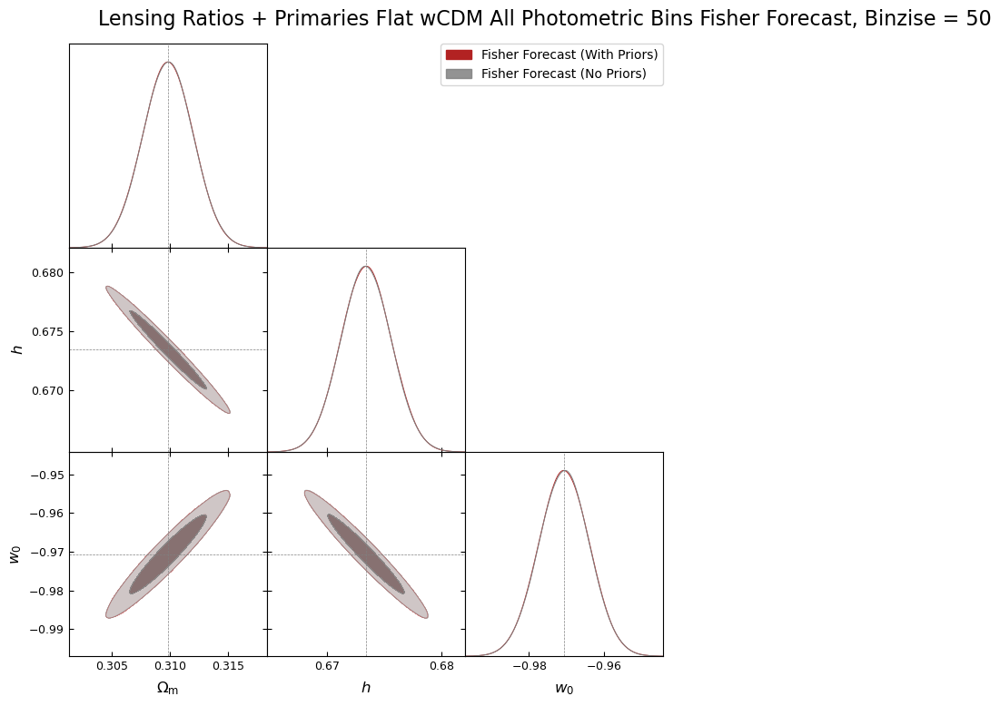

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.2591\pm 0.0018$ | $\Omega_{c} = 0.2591^{+0.0036}_{-0.0036}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.2591\pm 0.0018$ | $\Omega_{c} = 0.2591^{+0.0036}_{-0.0036}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.04929\pm 0.00035$ | $\Omega_{b} = 0.04929^{+0.00068}_{-0.00068}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.04929\pm 0.00035$ | $\Omega_{b} = 0.04929^{+0.00068}_{-0.00068}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6734\pm 0.0022$ | $h = 0.6734^{+0.0043}_{-0.0043}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6734\pm 0.0022$ | $h = 0.6734^{+0.0043}_{-0.0043}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -0.9706\pm 0.0068$ | $w_0 = -0.971^{+0.013}_{-0.013}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.9706\pm 0.0067$ | $w_0 = -0.971^{+0.013}_{-0.013}$ |
| --- | --- | --- | --- |
| **$A_s$** | Fisher Forecast (With Priors) | $A_s = \left(\,2.1270\pm 0.0039\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.1270^{+0.0077}_{-0.0076}\,\right)\cdot 10^{-9}$ |
|  | Fisher Forecast (No Priors) | $A_s = \left(\,2.1270\pm 0.0039\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.1270^{+0.0077}_{-0.0077}\,\right)\cdot 10^{-9}$ |
| --- | --- | --- | --- |
| **$n_s$** | Fisher Forecast (With Priors) | $n_s = 0.9699\pm 0.0021$ | $n_s = 0.9699^{+0.0041}_{-0.0041}$ |
|  | Fisher Forecast (No Priors) | $n_s = 0.9699\pm 0.0021$ | $n_s = 0.9699^{+0.0041}_{-0.0041}$ |
| --- | --- | --- | --- |

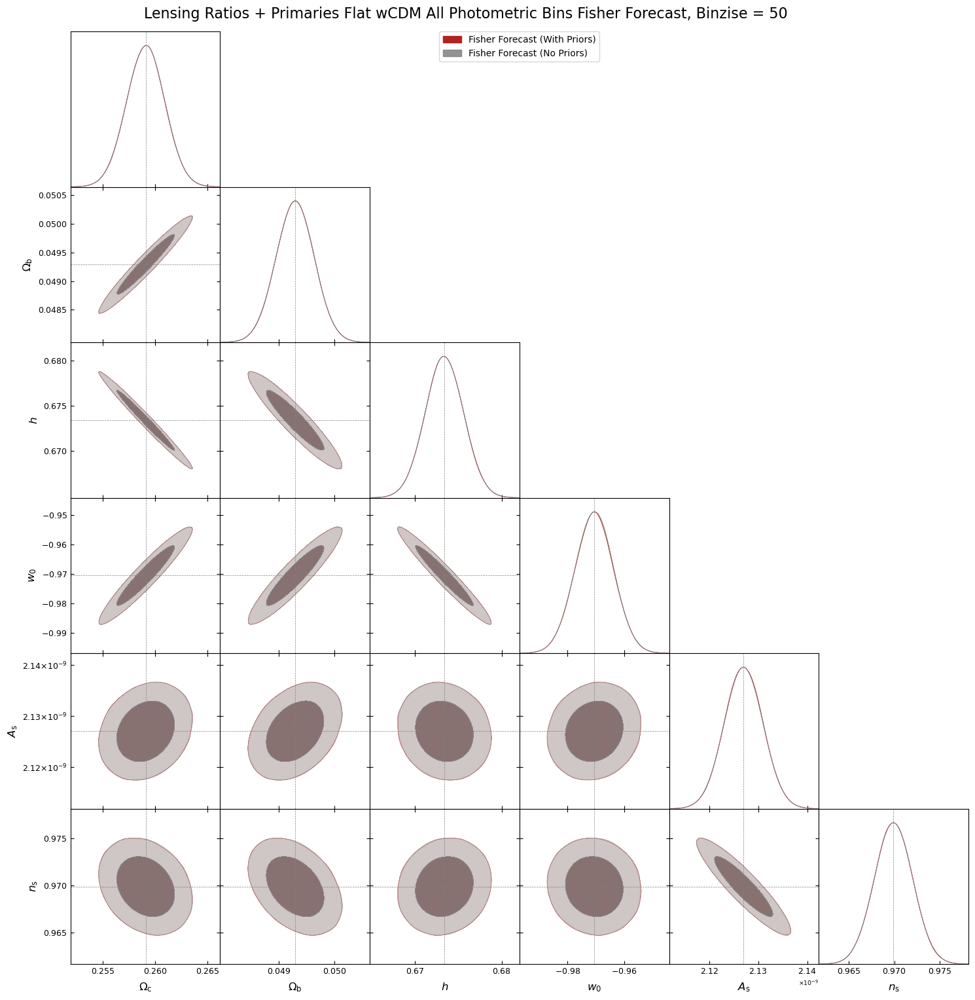

total_time:  0:03:21.271330


In [48]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_wCDM_cosmology,
    lens_data=bgs_combined_array,
    source_data=HSC_dist_0_3,
    binsize=50,
    l_min =40,
    n_ell = 5000,
    f_sky = 0.4,
    magnification_bias_lenses = 0.8,
    linear_emulator = None,
    boost_emulator = None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=HSC_shape_noise,
    desired_spectra=['CG', 'GL', 'TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'w0', 'A_s', 'n_s']
params_to_plot = ['Omega_m', 'h', 'w0']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Fisher Matrices/Flat_wCDM_LRP_Photo_BGS_HSC_Binsize=50.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h w0 A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, w0, A_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Covariance Matrices/Flat_wCDM_LRP_Photo_BGS_HSC_Binsize=50.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h w0 A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, w0, A_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios + Primaries Flat wCDM All Photometric Bins Fisher Forecast, Binzise = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

g2 = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios + Primaries Flat wCDM All Photometric Bins Fisher Forecast, Binzise = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

In [49]:
# REPLACE

### Flat w0waCDM: $\Omega_m, h, w_0, w_a$

#### Lensing Ratios

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.319\pm 0.013$ | $\Omega_m = 0.319^{+0.025}_{-0.025}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = \Omega_\mathrm{m} < 0.329$ | $\Omega_m = \Omega_\mathrm{m} < 0.383$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.68^{+0.14}_{-0.18}$ | $h = 0.68^{+0.28}_{-0.26}$ |
|  | Fisher Forecast (No Priors) | $h = 0.67\pm 0.40$ | $h = 0.67^{+0.78}_{-0.78}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -0.760\pm 0.094$ | $w_0 = -0.76^{+0.18}_{-0.18}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.752\pm 0.097$ | $w_0 = -0.75^{+0.19}_{-0.19}$ |
| --- | --- | --- | --- |
| **$w_a$** | Fisher Forecast (With Priors) | $w_a = -0.74\pm 0.81$ | $w_a = -0.7^{+1.6}_{-1.6}$ |
|  | Fisher Forecast (No Priors) | $w_a = -0.86\pm 0.85$ | $w_a = -0.9^{+1.7}_{-1.7}$ |
| --- | --- | --- | --- |

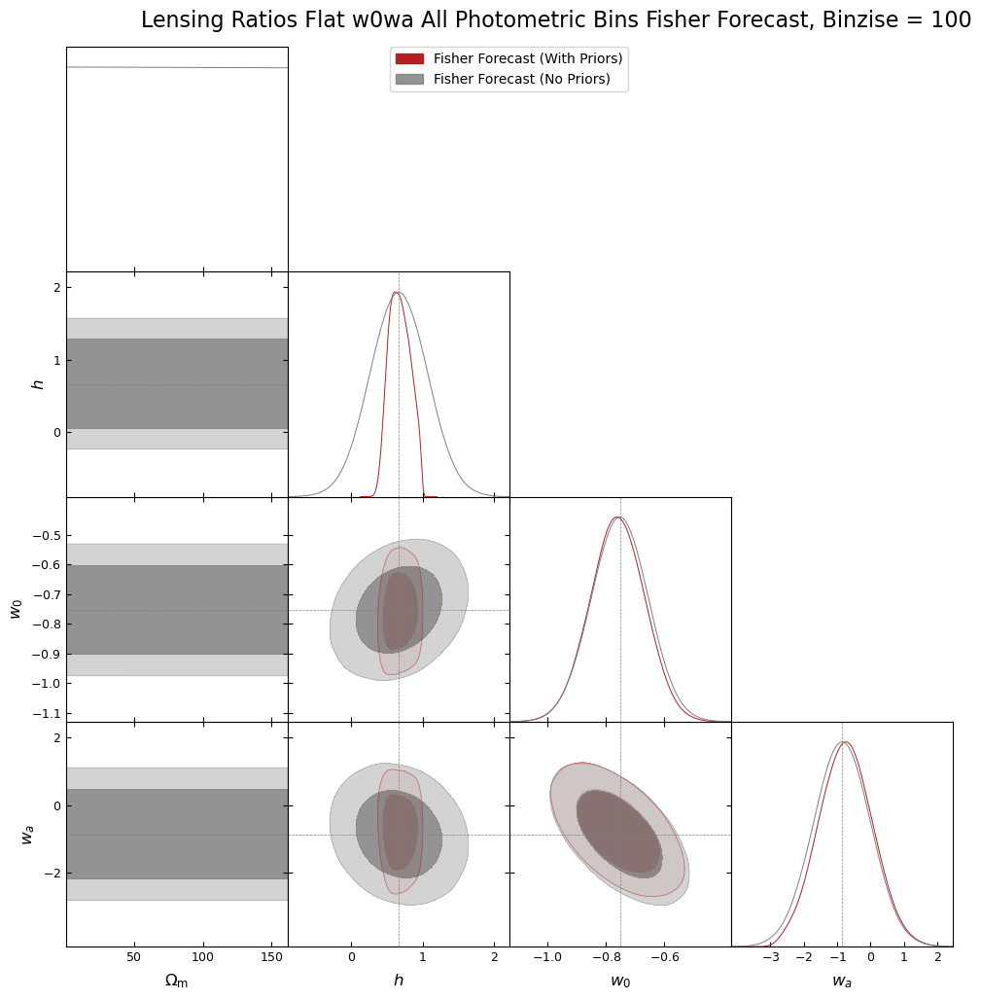

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.260^{+0.040}_{-0.027}$ | $\Omega_{c} = 0.260^{+0.056}_{-0.063}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.268\pm 0.076$ | $\Omega_{c} = 0.27^{+0.15}_{-0.15}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.057^{+0.017}_{-0.045}$ | $\Omega_{b} = 0.057^{+0.053}_{-0.046}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.050\pm 0.075$ | $\Omega_{b} = 0.05^{+0.15}_{-0.15}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.68^{+0.14}_{-0.18}$ | $h = 0.68^{+0.28}_{-0.25}$ |
|  | Fisher Forecast (No Priors) | $h = 0.67\pm 0.40$ | $h = 0.67^{+0.78}_{-0.78}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -0.760\pm 0.093$ | $w_0 = -0.76^{+0.18}_{-0.18}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.752\pm 0.097$ | $w_0 = -0.75^{+0.19}_{-0.19}$ |
| --- | --- | --- | --- |
| **$w_a$** | Fisher Forecast (With Priors) | $w_a = -0.74\pm 0.81$ | $w_a = -0.7^{+1.6}_{-1.6}$ |
|  | Fisher Forecast (No Priors) | $w_a = -0.86\pm 0.85$ | $w_a = -0.9^{+1.7}_{-1.7}$ |
| --- | --- | --- | --- |
| **$A_s$** | Fisher Forecast (With Priors) | $A_s = \left(\,2.20^{+0.26}_{-0.66}\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.20^{+0.84}_{-0.71}\,\right)\cdot 10^{-9}$ |
|  | Fisher Forecast (No Priors) | $A_s = \left(\,2.10\pm 0.98\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.1^{+1.9}_{-1.9}\,\right)\cdot 10^{-9}$ |
| --- | --- | --- | --- |
| **$n_s$** | Fisher Forecast (With Priors) | $n_s = 0.967^{+0.028}_{-0.039}$ | $n_s = 0.967^{+0.063}_{-0.059}$ |
|  | Fisher Forecast (No Priors) | $n_s = 0.966\pm 0.081$ | $n_s = 0.97^{+0.16}_{-0.16}$ |
| --- | --- | --- | --- |

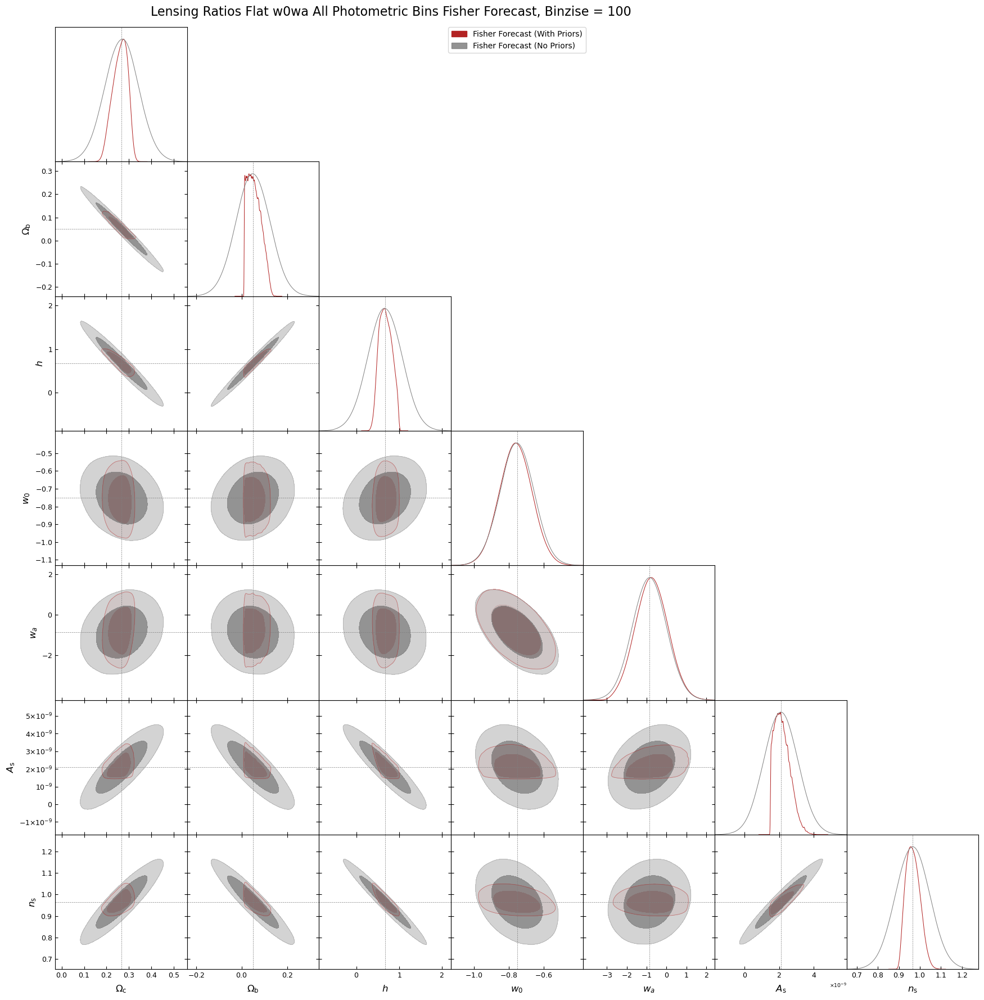

total_time:  0:02:07.541516


In [50]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_w0waCDM_cosmology,
    lens_data=bgs_combined_array,
    source_data=HSC_dist_0_3,
    binsize=100,
    l_min =40,
    n_ell = 5000,
    f_sky = 0.4,
    magnification_bias_lenses = 0.8,
    linear_emulator = None,
    boost_emulator = None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=None,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=HSC_shape_noise,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'w0', 'wa', 'A_s', 'n_s']
params_to_plot = ['Omega_m', 'h', 'w0', 'wa']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Fisher Matrices/Flat_w0waCDM_LR_Photo_BGS_HSC_Binsize=100.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h w0 wa A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, w0, wa, A_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Covariance Matrices/Flat_w0waCDM_LR_Photo_BGS_HSC_Binsize=100.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h w0 wa A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, w0, wa, A_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios Flat w0wa All Photometric Bins Fisher Forecast, Binzise = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

g2 = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios Flat w0wa All Photometric Bins Fisher Forecast, Binzise = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.319\pm 0.012$ | $\Omega_m = 0.319^{+0.024}_{-0.024}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = \Omega_\mathrm{m} < 0.327$ | $\Omega_m = \Omega_\mathrm{m} < 0.348$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.67^{+0.13}_{-0.16}$ | $h = 0.67^{+0.27}_{-0.25}$ |
|  | Fisher Forecast (No Priors) | $h = 0.67\pm 0.30$ | $h = 0.67^{+0.58}_{-0.58}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -0.760\pm 0.093$ | $w_0 = -0.76^{+0.18}_{-0.18}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.752\pm 0.095$ | $w_0 = -0.75^{+0.19}_{-0.19}$ |
| --- | --- | --- | --- |
| **$w_a$** | Fisher Forecast (With Priors) | $w_a = -0.75\pm 0.80$ | $w_a = -0.8^{+1.6}_{-1.5}$ |
|  | Fisher Forecast (No Priors) | $w_a = -0.86\pm 0.84$ | $w_a = -0.9^{+1.6}_{-1.6}$ |
| --- | --- | --- | --- |

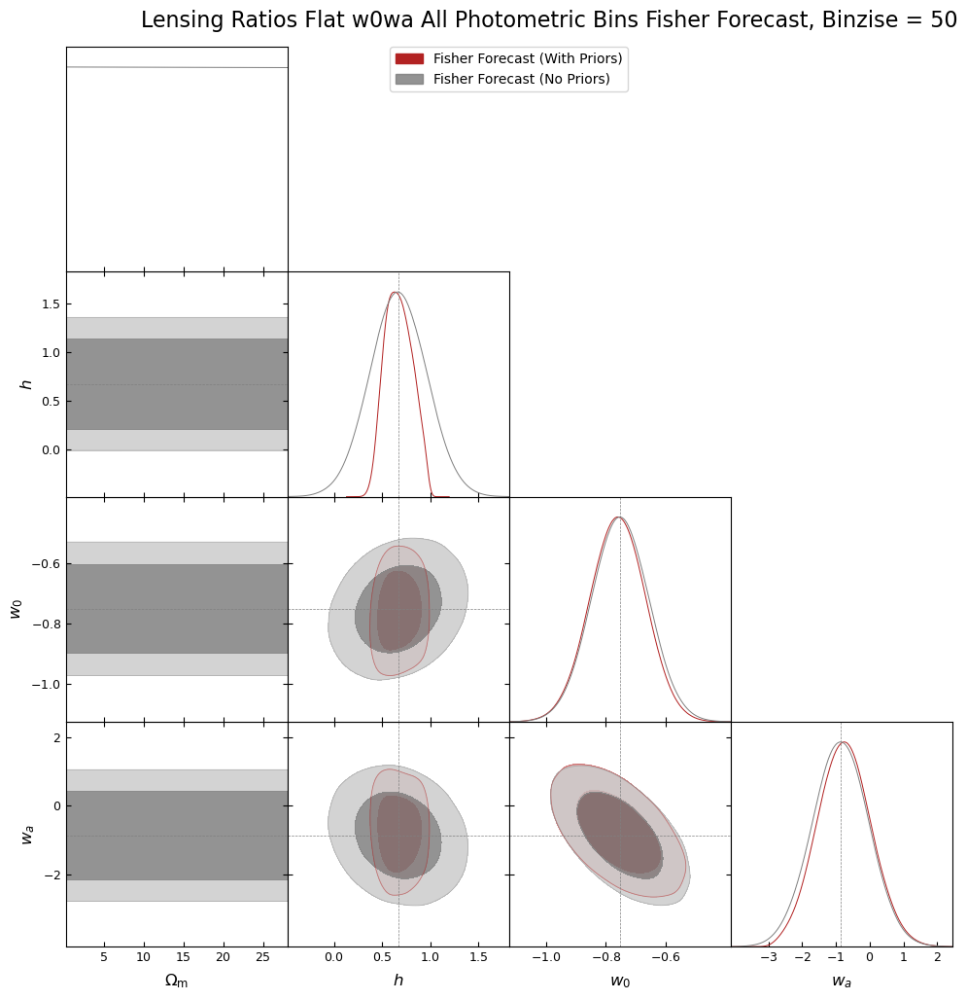

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.262^{+0.037}_{-0.025}$ | $\Omega_{c} = 0.262^{+0.053}_{-0.060}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.268\pm 0.056$ | $\Omega_{c} = 0.27^{+0.11}_{-0.11}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.055^{+0.014}_{-0.042}$ | $\Omega_{b} = 0.055^{+0.051}_{-0.044}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.050\pm 0.055$ | $\Omega_{b} = 0.05^{+0.11}_{-0.11}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.67^{+0.13}_{-0.16}$ | $h = 0.67^{+0.27}_{-0.25}$ |
|  | Fisher Forecast (No Priors) | $h = 0.67\pm 0.30$ | $h = 0.67^{+0.58}_{-0.58}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -0.759\pm 0.092$ | $w_0 = -0.76^{+0.18}_{-0.18}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.752\pm 0.095$ | $w_0 = -0.75^{+0.19}_{-0.19}$ |
| --- | --- | --- | --- |
| **$w_a$** | Fisher Forecast (With Priors) | $w_a = -0.76\pm 0.80$ | $w_a = -0.8^{+1.6}_{-1.6}$ |
|  | Fisher Forecast (No Priors) | $w_a = -0.86\pm 0.84$ | $w_a = -0.9^{+1.7}_{-1.6}$ |
| --- | --- | --- | --- |
| **$A_s$** | Fisher Forecast (With Priors) | $A_s = \left(\,2.19^{+0.23}_{-0.65}\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.19^{+0.82}_{-0.70}\,\right)\cdot 10^{-9}$ |
|  | Fisher Forecast (No Priors) | $A_s = \left(\,2.09\pm 0.80\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.1^{+1.6}_{-1.6}\,\right)\cdot 10^{-9}$ |
| --- | --- | --- | --- |
| **$n_s$** | Fisher Forecast (With Priors) | $n_s = 0.968^{+0.028}_{-0.037}$ | $n_s = 0.968^{+0.061}_{-0.058}$ |
|  | Fisher Forecast (No Priors) | $n_s = 0.965\pm 0.063$ | $n_s = 0.97^{+0.12}_{-0.12}$ |
| --- | --- | --- | --- |

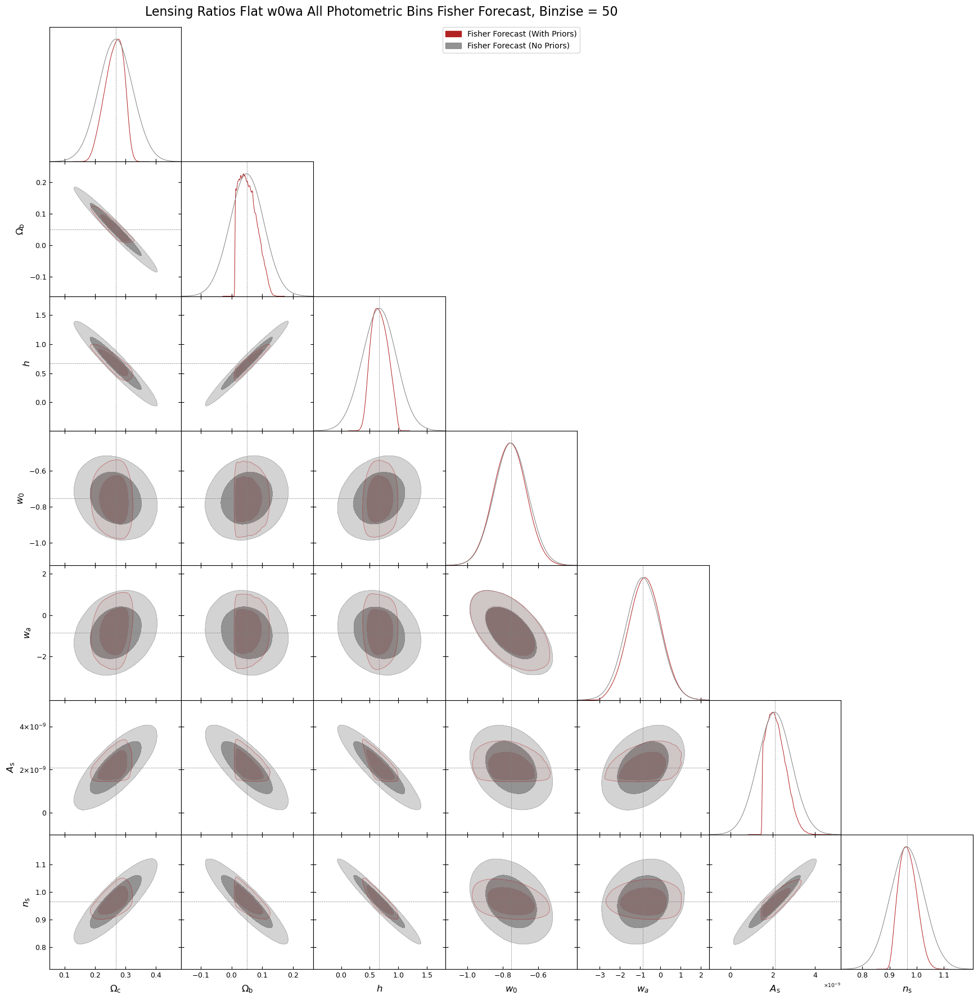

total_time:  0:02:13.268443


In [52]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_w0waCDM_cosmology,
    lens_data=bgs_combined_array,
    source_data=HSC_dist_0_3,
    binsize=50,
    l_min =40,
    n_ell = 5000,
    f_sky = 0.4,
    magnification_bias_lenses = 0.8,
    linear_emulator = None,
    boost_emulator = None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=None,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=HSC_shape_noise,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'w0', 'wa', 'A_s', 'n_s']
params_to_plot = ['Omega_m', 'h', 'w0', 'wa']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Fisher Matrices/Flat_w0waCDM_LR_Photo_BGS_HSC_Binsize=50.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h w0 wa A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, w0, wa, A_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Covariance Matrices/Flat_w0waCDM_LR_Photo_BGS_HSC_Binsize=50.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h w0 wa A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, w0, wa, A_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios Flat w0wa All Photometric Bins Fisher Forecast, Binzise = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

g2 = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios Flat w0wa All Photometric Bins Fisher Forecast, Binzise = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

In [ ]:
# REPLACE

#### Primaries

| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3189\pm 0.0070$ | $\Omega_m = 0.319^{+0.014}_{-0.014}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3190\pm 0.0070$ | $\Omega_m = 0.319^{+0.014}_{-0.014}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6674\pm 0.0074$ | $h = 0.667^{+0.015}_{-0.015}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6674\pm 0.0075$ | $h = 0.667^{+0.015}_{-0.015}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -0.752\pm 0.075$ | $w_0 = -0.75^{+0.15}_{-0.15}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.752\pm 0.075$ | $w_0 = -0.75^{+0.15}_{-0.15}$ |
| --- | --- | --- | --- |
| **$w_a$** | Fisher Forecast (With Priors) | $w_a = -0.86\pm 0.32$ | $w_a = -0.86^{+0.62}_{-0.62}$ |
|  | Fisher Forecast (No Priors) | $w_a = -0.86\pm 0.32$ | $w_a = -0.86^{+0.62}_{-0.62}$ |
| --- | --- | --- | --- |

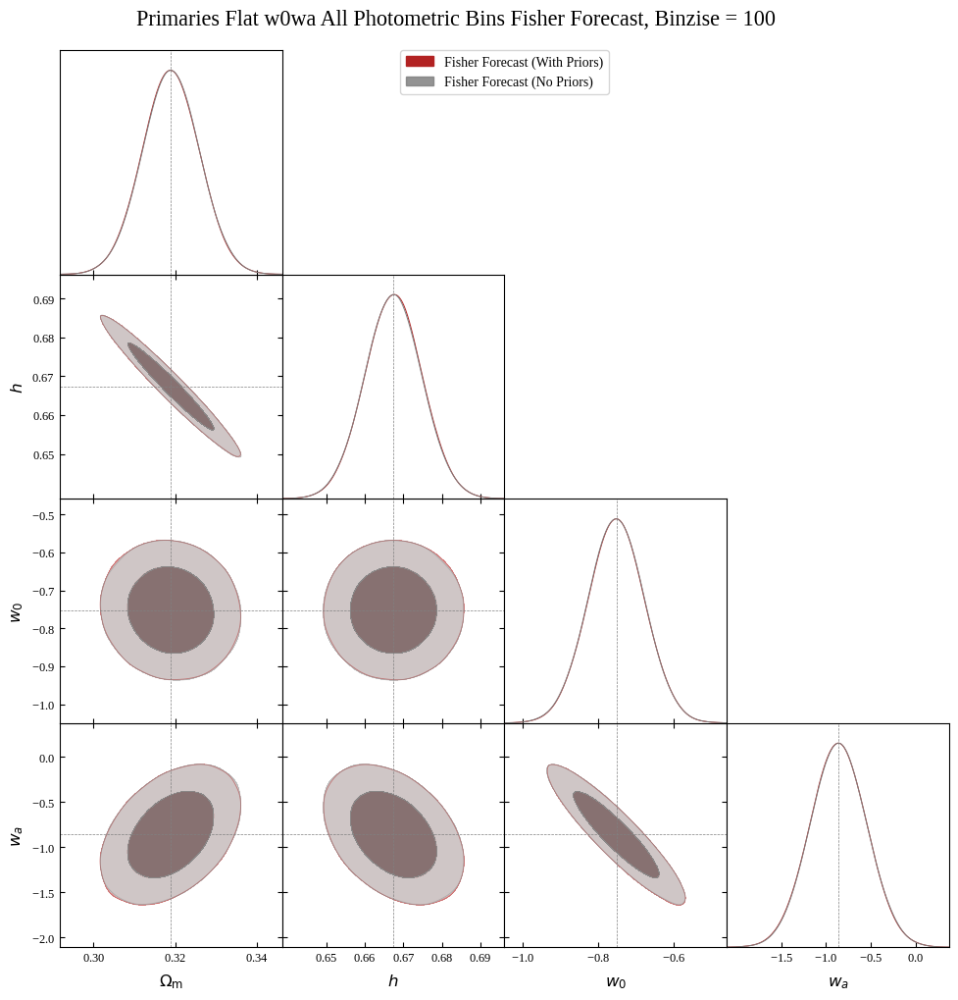

| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.2676\pm 0.0059$ | $\Omega_{c} = 0.268^{+0.012}_{-0.012}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.2676\pm 0.0059$ | $\Omega_{c} = 0.268^{+0.012}_{-0.012}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.0499\pm 0.0012$ | $\Omega_{b} = 0.0499^{+0.0023}_{-0.0023}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.0499\pm 0.0012$ | $\Omega_{b} = 0.0499^{+0.0023}_{-0.0023}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6674\pm 0.0075$ | $h = 0.667^{+0.015}_{-0.015}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6674\pm 0.0074$ | $h = 0.667^{+0.015}_{-0.015}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -0.752\pm 0.075$ | $w_0 = -0.75^{+0.15}_{-0.15}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.752\pm 0.075$ | $w_0 = -0.75^{+0.15}_{-0.15}$ |
| --- | --- | --- | --- |
| **$w_a$** | Fisher Forecast (With Priors) | $w_a = -0.86\pm 0.32$ | $w_a = -0.86^{+0.62}_{-0.62}$ |
|  | Fisher Forecast (No Priors) | $w_a = -0.86\pm 0.32$ | $w_a = -0.86^{+0.62}_{-0.62}$ |
| --- | --- | --- | --- |
| **$A_s$** | Fisher Forecast (With Priors) | $A_s = \left(\,2.0940\pm 0.0053\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.094^{+0.010}_{-0.010}\,\right)\cdot 10^{-9}$ |
|  | Fisher Forecast (No Priors) | $A_s = \left(\,2.0940\pm 0.0053\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.094^{+0.010}_{-0.010}\,\right)\cdot 10^{-9}$ |
| --- | --- | --- | --- |
| **$n_s$** | Fisher Forecast (With Priors) | $n_s = 0.9654\pm 0.0029$ | $n_s = 0.9654^{+0.0057}_{-0.0057}$ |
|  | Fisher Forecast (No Priors) | $n_s = 0.9654\pm 0.0029$ | $n_s = 0.9654^{+0.0057}_{-0.0057}$ |
| --- | --- | --- | --- |

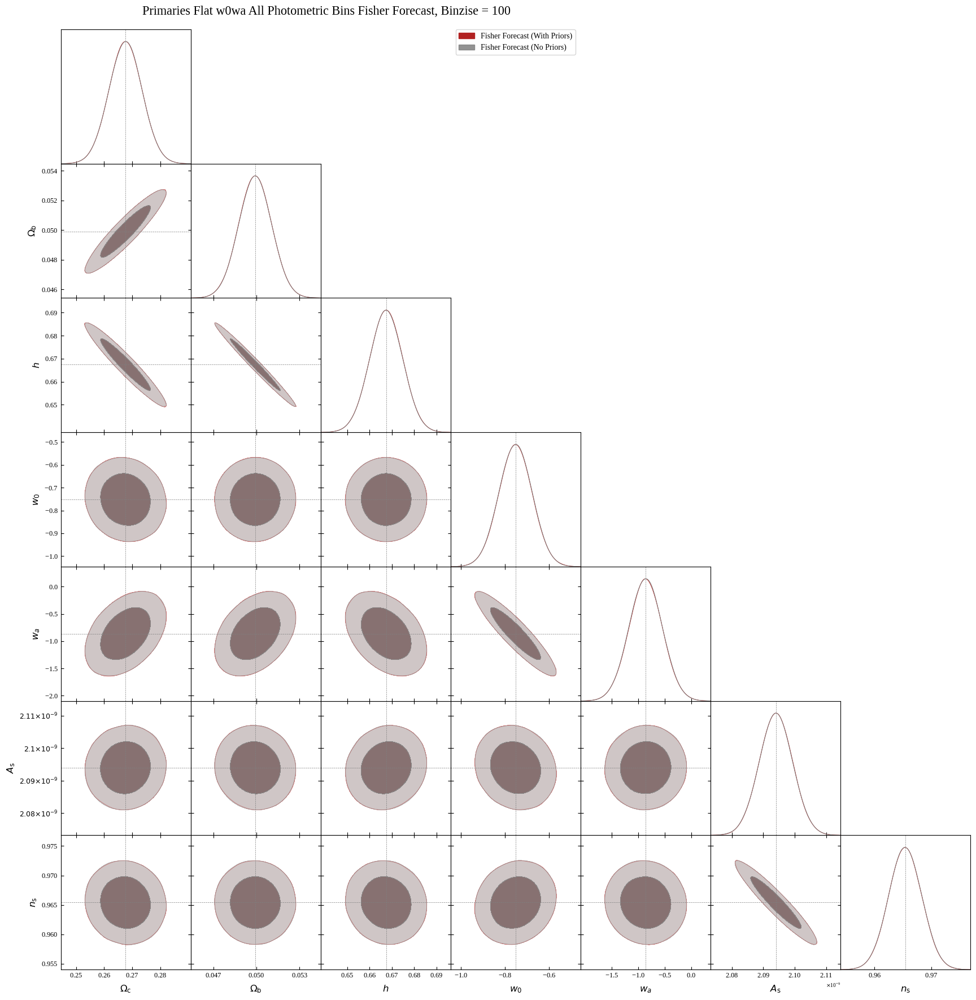

total_time:  0:02:22.349883


In [59]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_w0waCDM_cosmology,
    lens_data=DESI_lens_data,
    source_data=HSC_dist_0_3,
    binsize=100,
    l_min =40,
    n_ell = 5000,
    f_sky = 0.4,
    magnification_bias_lenses = 0.8,
    linear_emulator = None,
    boost_emulator = None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=DESI_shot_noise,
    shape_noise_source=DESI_shape_noise,
    desired_spectra=['TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'w0', 'wa', 'A_s', 'n_s']
params_to_plot = ['Omega_m', 'h', 'w0', 'wa']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Fisher Matrices/Flat_w0waCDM_Primaries_All_Photometric_Bins_Binsize=100.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h w0 wa A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, w0, wa, A_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Covariance Matrices/Flat_w0waCDM_Primaries_All_Photometric_Bins_Binsize=100.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h w0 wa A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, w0, wa, A_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="Primaries Flat w0wa All Photometric Bins Fisher Forecast, Binzise = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

g2 = forecaster_c1.plot_with_cobaya_overlay(
    title="Primaries Flat w0wa All Photometric Bins Fisher Forecast, Binzise = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3189\pm 0.0067$ | $\Omega_m = 0.319^{+0.013}_{-0.013}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3189\pm 0.0067$ | $\Omega_m = 0.319^{+0.013}_{-0.013}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6674\pm 0.0071$ | $h = 0.667^{+0.014}_{-0.014}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6674\pm 0.0071$ | $h = 0.667^{+0.014}_{-0.014}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -0.752\pm 0.074$ | $w_0 = -0.75^{+0.14}_{-0.15}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.752\pm 0.074$ | $w_0 = -0.75^{+0.15}_{-0.14}$ |
| --- | --- | --- | --- |
| **$w_a$** | Fisher Forecast (With Priors) | $w_a = -0.86\pm 0.31$ | $w_a = -0.86^{+0.61}_{-0.61}$ |
|  | Fisher Forecast (No Priors) | $w_a = -0.86\pm 0.31$ | $w_a = -0.86^{+0.60}_{-0.61}$ |
| --- | --- | --- | --- |

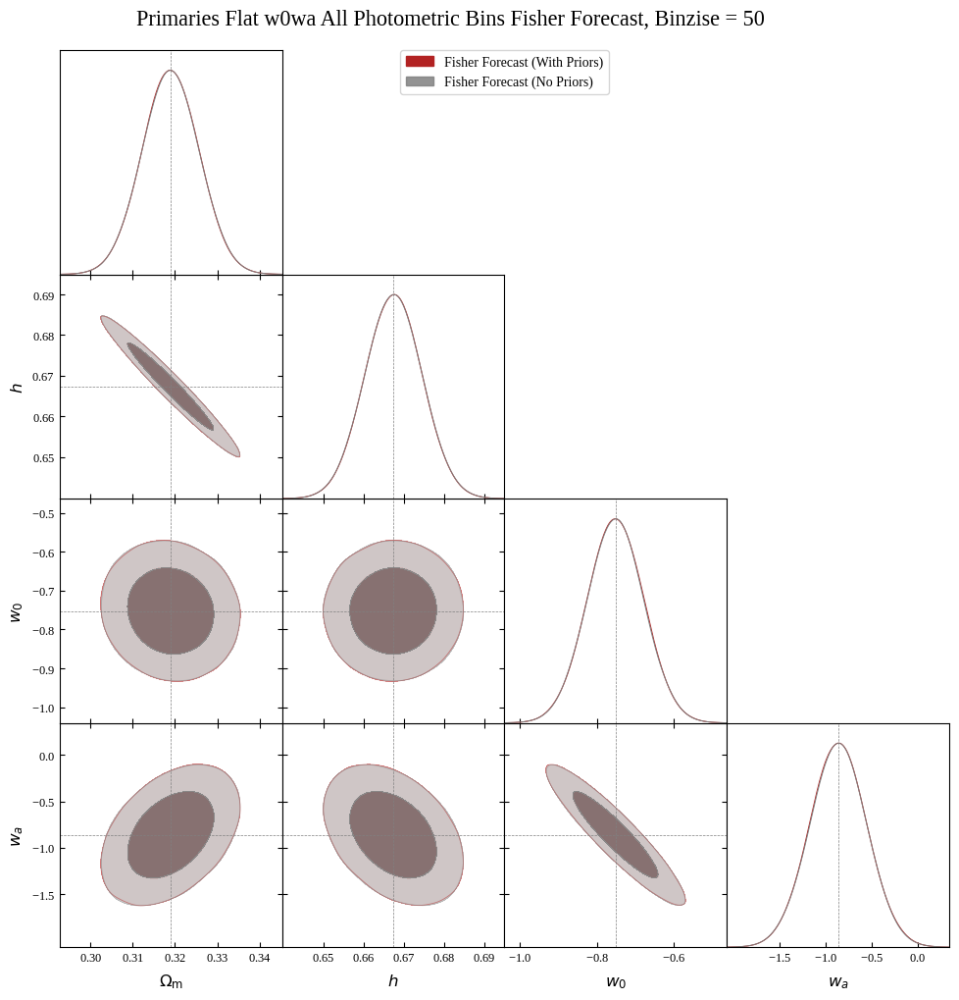

| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.2676\pm 0.0057$ | $\Omega_{c} = 0.268^{+0.011}_{-0.011}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.2676\pm 0.0057$ | $\Omega_{c} = 0.268^{+0.011}_{-0.011}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.0499\pm 0.0011$ | $\Omega_{b} = 0.0499^{+0.0021}_{-0.0021}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.0499\pm 0.0011$ | $\Omega_{b} = 0.0499^{+0.0022}_{-0.0021}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6674\pm 0.0071$ | $h = 0.667^{+0.014}_{-0.014}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6674\pm 0.0071$ | $h = 0.667^{+0.014}_{-0.014}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -0.752\pm 0.074$ | $w_0 = -0.75^{+0.14}_{-0.14}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.752\pm 0.074$ | $w_0 = -0.75^{+0.15}_{-0.14}$ |
| --- | --- | --- | --- |
| **$w_a$** | Fisher Forecast (With Priors) | $w_a = -0.86\pm 0.31$ | $w_a = -0.86^{+0.61}_{-0.61}$ |
|  | Fisher Forecast (No Priors) | $w_a = -0.86\pm 0.31$ | $w_a = -0.86^{+0.61}_{-0.61}$ |
| --- | --- | --- | --- |
| **$A_s$** | Fisher Forecast (With Priors) | $A_s = \left(\,2.0940\pm 0.0051\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.0940^{+0.0099}_{-0.0099}\,\right)\cdot 10^{-9}$ |
|  | Fisher Forecast (No Priors) | $A_s = \left(\,2.0940\pm 0.0051\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.094^{+0.010}_{-0.0098}\,\right)\cdot 10^{-9}$ |
| --- | --- | --- | --- |
| **$n_s$** | Fisher Forecast (With Priors) | $n_s = 0.9654\pm 0.0028$ | $n_s = 0.9654^{+0.0054}_{-0.0055}$ |
|  | Fisher Forecast (No Priors) | $n_s = 0.9654\pm 0.0028$ | $n_s = 0.9654^{+0.0054}_{-0.0055}$ |
| --- | --- | --- | --- |

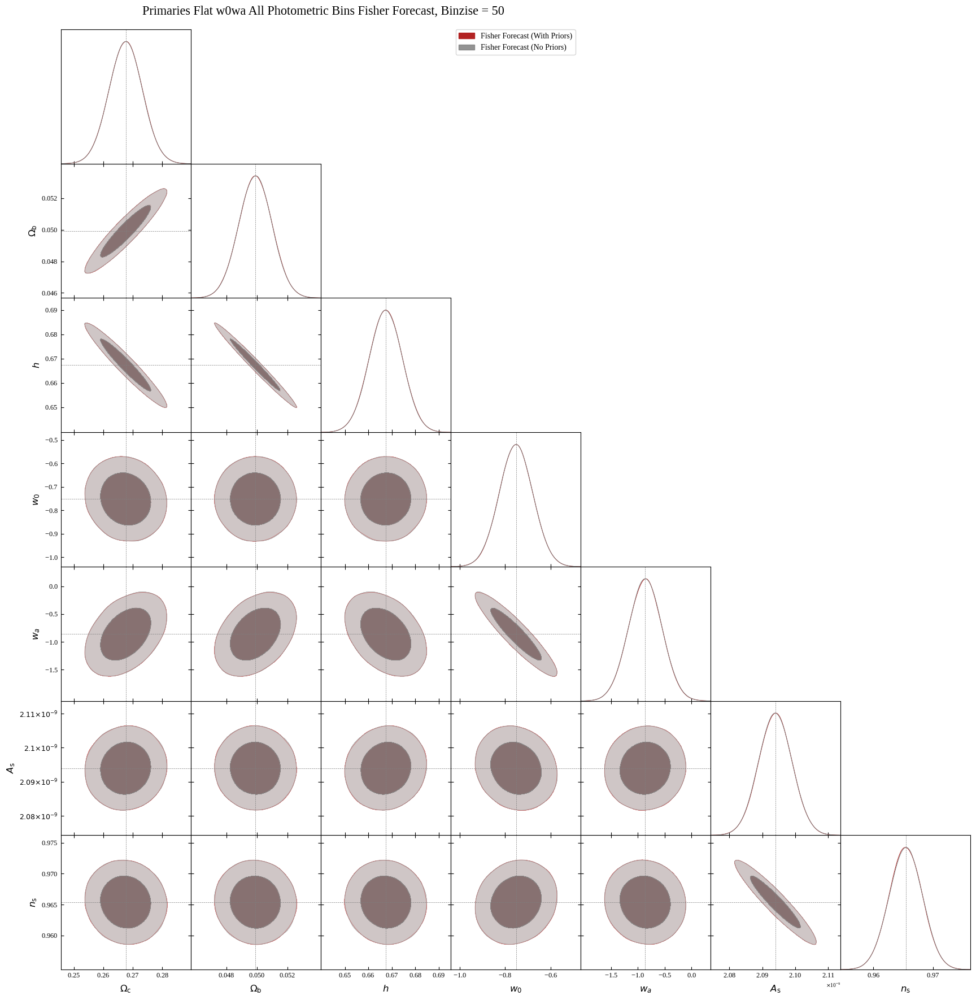

total_time:  0:02:52.602234


In [60]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_w0waCDM_cosmology,
    lens_data=DESI_lens_data,
    source_data=HSC_dist_0_3,
    binsize=50,
    l_min =40,
    n_ell = 5000,
    f_sky = 0.4,
    magnification_bias_lenses = 0.8,
    linear_emulator = None,
    boost_emulator = None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=DESI_shot_noise,
    shape_noise_source=DESI_shape_noise,
    desired_spectra=['TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'w0', 'wa', 'A_s', 'n_s']
params_to_plot = ['Omega_m', 'h', 'w0', 'wa']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Fisher Matrices/Flat_w0waCDM_Primaries_All_Photometric_Bins_Binsize=50.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h w0 wa A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, w0, wa, A_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Covariance Matrices/Flat_w0waCDM_Primaries_All_Photometric_Bins_Binsize=50.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h w0 wa A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, w0, wa, A_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="Primaries Flat w0wa All Photometric Bins Fisher Forecast, Binzise = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

g2 = forecaster_c1.plot_with_cobaya_overlay(
    title="Primaries Flat w0wa All Photometric Bins Fisher Forecast, Binzise = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Plot successfully saved to: plots/Fisher Forecasts/so_primaries_flat_w0wacdm_fisher_forecast_bin_size_=_20.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3189\pm 0.0066$ | $\Omega_m = 0.319^{+0.013}_{-0.013}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3189\pm 0.0067$ | $\Omega_m = 0.319^{+0.013}_{-0.013}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6674\pm 0.0070$ | $h = 0.667^{+0.014}_{-0.014}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6674\pm 0.0070$ | $h = 0.667^{+0.014}_{-0.014}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -0.752\pm 0.074$ | $w_0 = -0.75^{+0.14}_{-0.14}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.752\pm 0.073$ | $w_0 = -0.75^{+0.14}_{-0.14}$ |
| --- | --- | --- | --- |
| **$w_a$** | Fisher Forecast (With Priors) | $w_a = -0.86\pm 0.31$ | $w_a = -0.86^{+0.61}_{-0.60}$ |
|  | Fisher Forecast (No Priors) | $w_a = -0.86\pm 0.31$ | $w_a = -0.86^{+0.60}_{-0.60}$ |
| --- | --- | --- | --- |

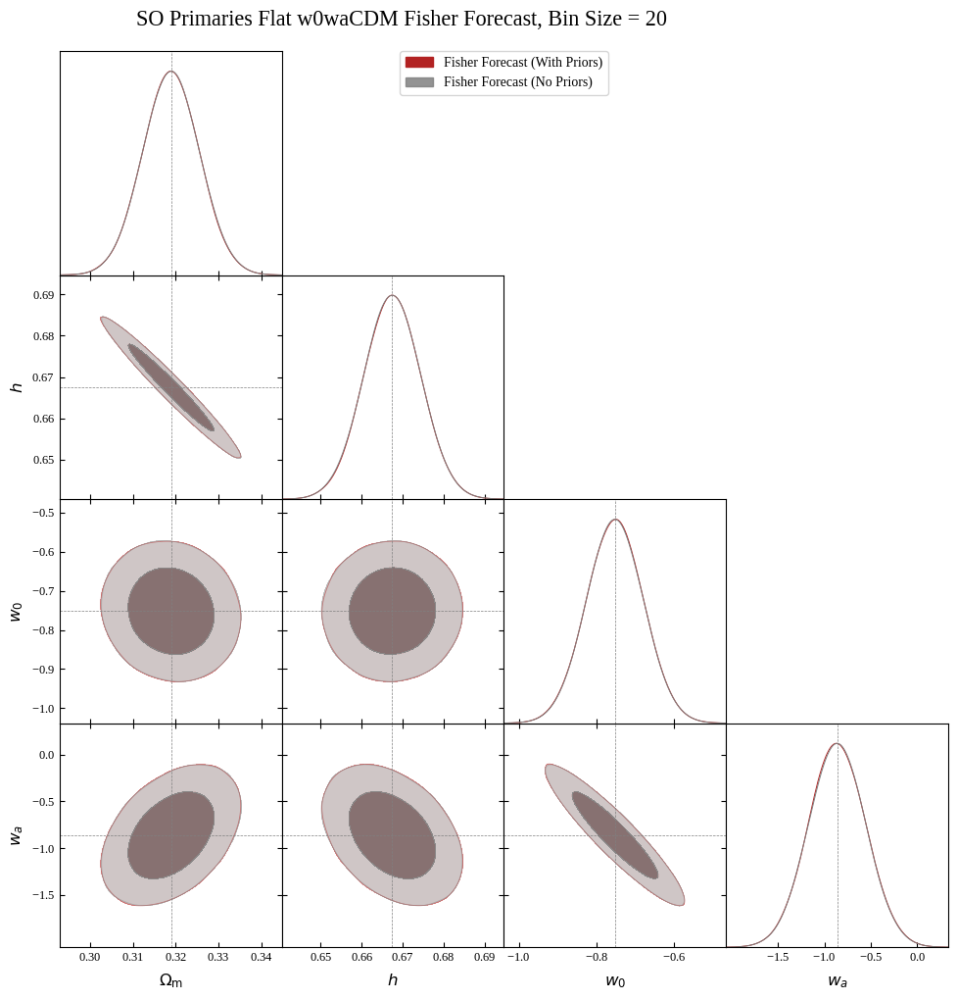

Plot successfully saved to: plots/Fisher Forecasts/so_primaries_flat_w0wacdm_fisher_forecast_bin_size_=_20_--_all_sampled_parameters_plotted.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.2676\pm 0.0056$ | $\Omega_{c} = 0.268^{+0.011}_{-0.011}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.2676\pm 0.0056$ | $\Omega_{c} = 0.268^{+0.011}_{-0.011}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.0499\pm 0.0011$ | $\Omega_{b} = 0.0499^{+0.0021}_{-0.0021}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.0499\pm 0.0011$ | $\Omega_{b} = 0.0499^{+0.0021}_{-0.0021}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6674\pm 0.0070$ | $h = 0.667^{+0.014}_{-0.014}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6674\pm 0.0070$ | $h = 0.667^{+0.014}_{-0.014}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -0.752\pm 0.074$ | $w_0 = -0.75^{+0.14}_{-0.14}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.752\pm 0.074$ | $w_0 = -0.75^{+0.14}_{-0.14}$ |
| --- | --- | --- | --- |
| **$w_a$** | Fisher Forecast (With Priors) | $w_a = -0.86\pm 0.31$ | $w_a = -0.86^{+0.60}_{-0.61}$ |
|  | Fisher Forecast (No Priors) | $w_a = -0.86\pm 0.31$ | $w_a = -0.86^{+0.60}_{-0.61}$ |
| --- | --- | --- | --- |
| **$A_s$** | Fisher Forecast (With Priors) | $A_s = \left(\,2.0940\pm 0.0049\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.0940^{+0.0097}_{-0.0097}\,\right)\cdot 10^{-9}$ |
|  | Fisher Forecast (No Priors) | $A_s = \left(\,2.0940\pm 0.0049\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.0940^{+0.0097}_{-0.0097}\,\right)\cdot 10^{-9}$ |
| --- | --- | --- | --- |
| **$n_s$** | Fisher Forecast (With Priors) | $n_s = 0.9654\pm 0.0027$ | $n_s = 0.9654^{+0.0053}_{-0.0053}$ |
|  | Fisher Forecast (No Priors) | $n_s = 0.9654\pm 0.0027$ | $n_s = 0.9654^{+0.0053}_{-0.0053}$ |
| --- | --- | --- | --- |

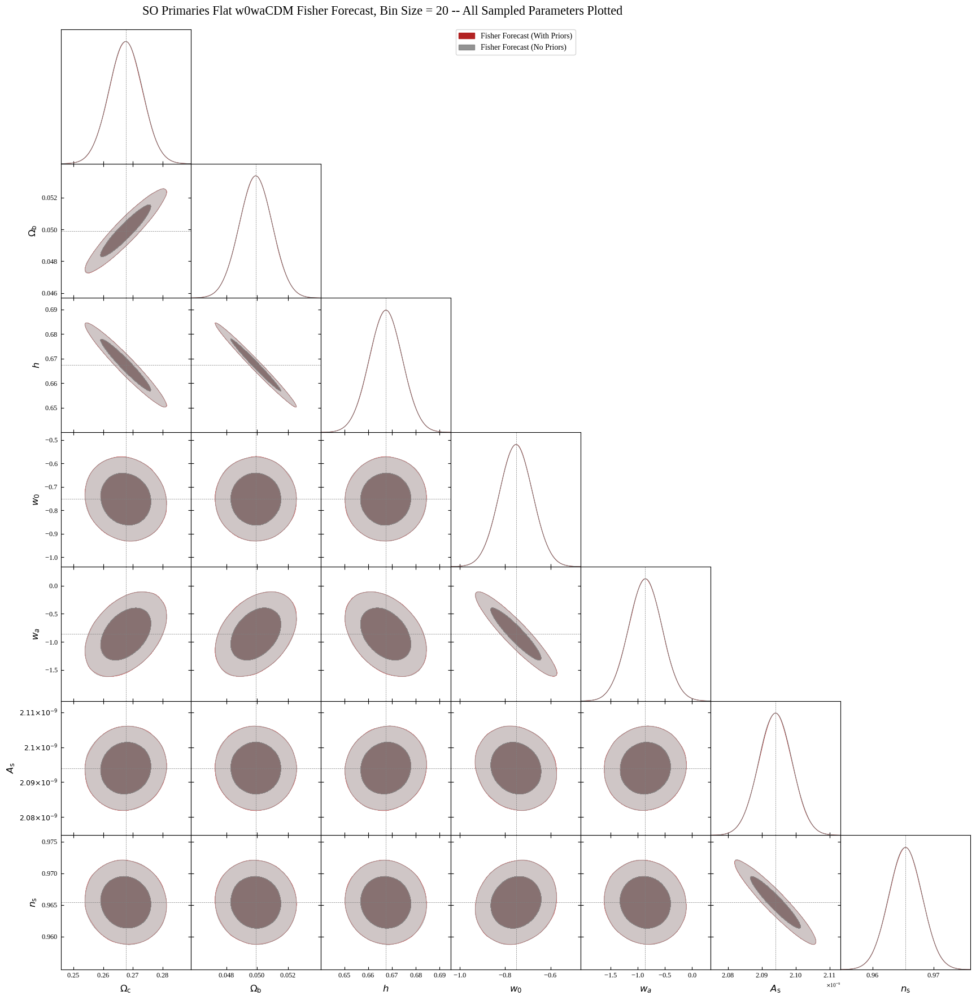

total_time:  0:04:38.198616


In [77]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_w0waCDM_cosmology,
    lens_data=DESI_lens_data,
    source_data=HSC_dist_0_3,
    binsize=20,
    l_min =40,
    n_ell = 5000,
    f_sky = 0.4,
    magnification_bias_lenses = 0.8,
    linear_emulator = None,
    boost_emulator = None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=DESI_shot_noise,
    shape_noise_source=DESI_shape_noise,
    desired_spectra=['TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'w0', 'wa', 'A_s', 'n_s']
params_to_plot = ['Omega_m', 'h', 'w0', 'wa']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Flat_w0waCDM_Primaries_Binsize=20.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h w0 wa A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, w0, wa, A_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Flat_w0waCDM_Primaries_Binsize=20.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h w0 wa A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, w0, wa, A_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SO Primaries Flat w0waCDM Fisher Forecast, Bin Size = 20",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

g2 = forecaster_c1.plot_with_cobaya_overlay(
    title="SO Primaries Flat w0waCDM Fisher Forecast, Bin Size = 20 -- All Sampled Parameters Plotted",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

#### Lensing Ratios and Primaries

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3189\pm 0.0055$ | $\Omega_m = 0.319^{+0.011}_{-0.011}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3190\pm 0.0055$ | $\Omega_m = 0.319^{+0.011}_{-0.011}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6674\pm 0.0051$ | $h = 0.667^{+0.010}_{-0.010}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6674\pm 0.0051$ | $h = 0.667^{+0.010}_{-0.010}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -0.752\pm 0.041$ | $w_0 = -0.752^{+0.080}_{-0.080}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.752\pm 0.041$ | $w_0 = -0.752^{+0.081}_{-0.080}$ |
| --- | --- | --- | --- |
| **$w_a$** | Fisher Forecast (With Priors) | $w_a = -0.86\pm 0.17$ | $w_a = -0.86^{+0.34}_{-0.34}$ |
|  | Fisher Forecast (No Priors) | $w_a = -0.86\pm 0.17$ | $w_a = -0.86^{+0.34}_{-0.34}$ |
| --- | --- | --- | --- |

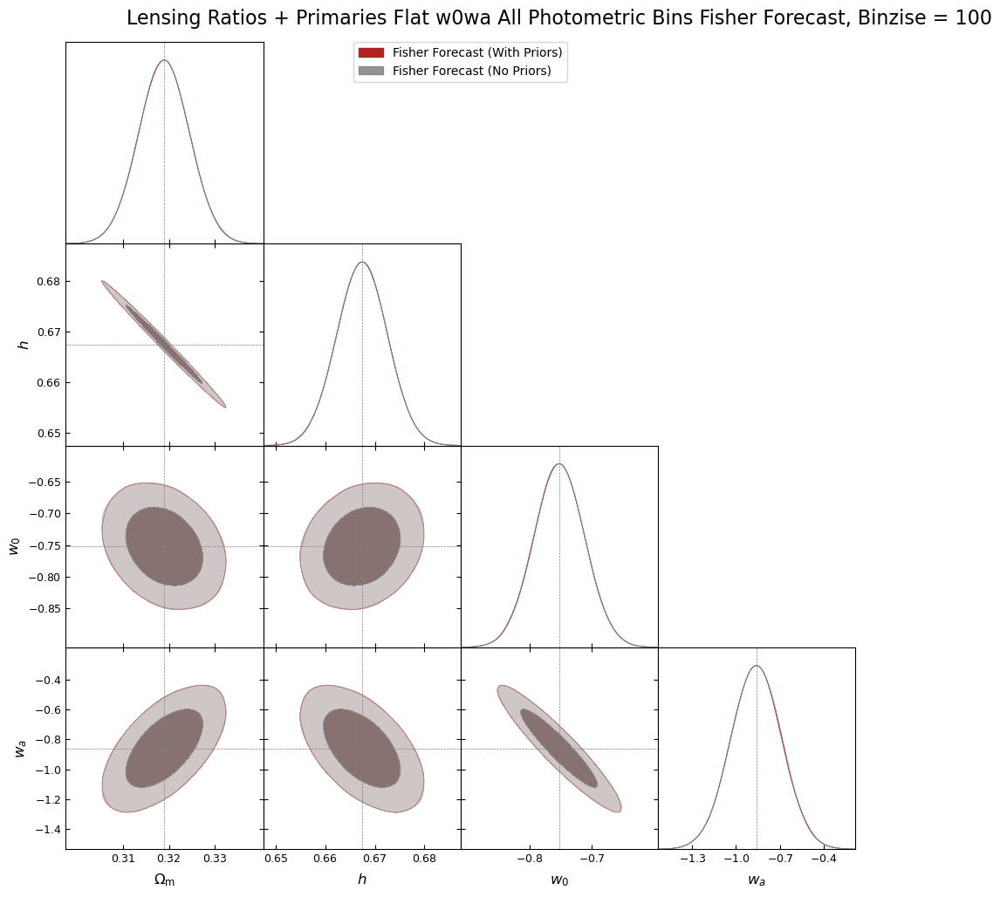

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.2676\pm 0.0047$ | $\Omega_{c} = 0.2676^{+0.0092}_{-0.0093}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.2676\pm 0.0047$ | $\Omega_{c} = 0.2676^{+0.0093}_{-0.0093}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.04991\pm 0.00076$ | $\Omega_{b} = 0.0499^{+0.0015}_{-0.0015}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.04991\pm 0.00076$ | $\Omega_{b} = 0.0499^{+0.0015}_{-0.0015}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6674\pm 0.0051$ | $h = 0.667^{+0.010}_{-0.010}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6674\pm 0.0051$ | $h = 0.667^{+0.010}_{-0.010}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -0.752\pm 0.041$ | $w_0 = -0.752^{+0.080}_{-0.080}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.752\pm 0.041$ | $w_0 = -0.752^{+0.080}_{-0.080}$ |
| --- | --- | --- | --- |
| **$w_a$** | Fisher Forecast (With Priors) | $w_a = -0.86\pm 0.17$ | $w_a = -0.86^{+0.34}_{-0.34}$ |
|  | Fisher Forecast (No Priors) | $w_a = -0.86\pm 0.17$ | $w_a = -0.86^{+0.34}_{-0.34}$ |
| --- | --- | --- | --- |
| **$A_s$** | Fisher Forecast (With Priors) | $A_s = \left(\,2.0940\pm 0.0043\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.0940^{+0.0084}_{-0.0084}\,\right)\cdot 10^{-9}$ |
|  | Fisher Forecast (No Priors) | $A_s = \left(\,2.0940\pm 0.0043\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.0940^{+0.0084}_{-0.0085}\,\right)\cdot 10^{-9}$ |
| --- | --- | --- | --- |
| **$n_s$** | Fisher Forecast (With Priors) | $n_s = 0.9654\pm 0.0024$ | $n_s = 0.9654^{+0.0047}_{-0.0047}$ |
|  | Fisher Forecast (No Priors) | $n_s = 0.9654\pm 0.0024$ | $n_s = 0.9654^{+0.0047}_{-0.0047}$ |
| --- | --- | --- | --- |

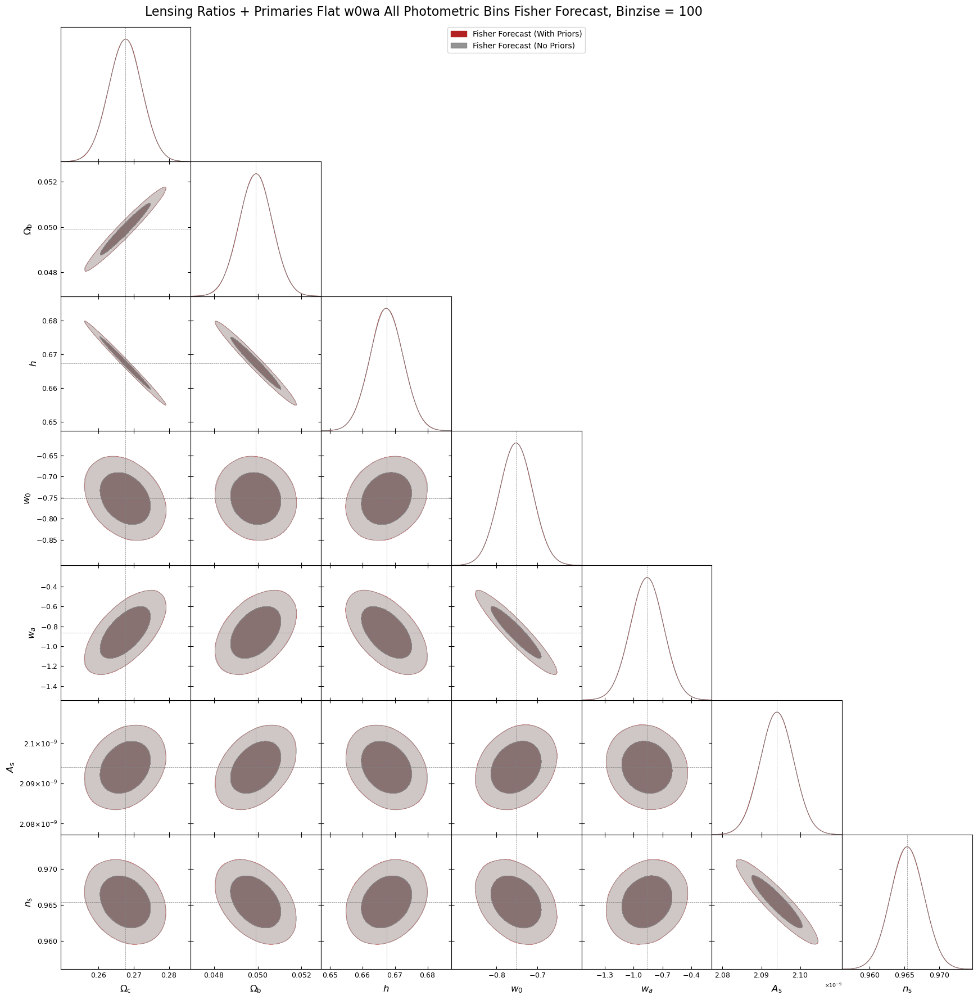

total_time:  0:03:33.004308


In [53]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_w0waCDM_cosmology,
    lens_data=bgs_combined_array,
    source_data=HSC_dist_0_3,
    binsize=100,
    l_min =40,
    n_ell = 5000,
    f_sky = 0.4,
    magnification_bias_lenses = 0.8,
    linear_emulator = None,
    boost_emulator = None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=HSC_shape_noise,
    desired_spectra=['CG', 'GL', 'TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'w0', 'wa', 'A_s', 'n_s']
params_to_plot = ['Omega_m', 'h', 'w0', 'wa']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Fisher Matrices/Flat_w0waCDM_LRP_Photo_BGS_HSC_Binsize=100.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h w0 wa A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, w0, wa, A_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Covariance Matrices/Flat_w0waCDM_LRP_Photo_BGS_HSC_Binsize=100.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h w0 wa A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, w0, wa, A_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios + Primaries Flat w0wa All Photometric Bins Fisher Forecast, Binzise = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

g2 = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios + Primaries Flat w0wa All Photometric Bins Fisher Forecast, Binzise = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3190\pm 0.0053$ | $\Omega_m = 0.319^{+0.010}_{-0.010}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3190\pm 0.0053$ | $\Omega_m = 0.319^{+0.010}_{-0.010}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6674\pm 0.0049$ | $h = 0.6674^{+0.0097}_{-0.0097}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6674\pm 0.0049$ | $h = 0.6674^{+0.0096}_{-0.0097}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -0.752\pm 0.040$ | $w_0 = -0.752^{+0.079}_{-0.079}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.752\pm 0.040$ | $w_0 = -0.752^{+0.078}_{-0.078}$ |
| --- | --- | --- | --- |
| **$w_a$** | Fisher Forecast (With Priors) | $w_a = -0.86\pm 0.17$ | $w_a = -0.86^{+0.33}_{-0.33}$ |
|  | Fisher Forecast (No Priors) | $w_a = -0.86\pm 0.17$ | $w_a = -0.86^{+0.33}_{-0.33}$ |
| --- | --- | --- | --- |

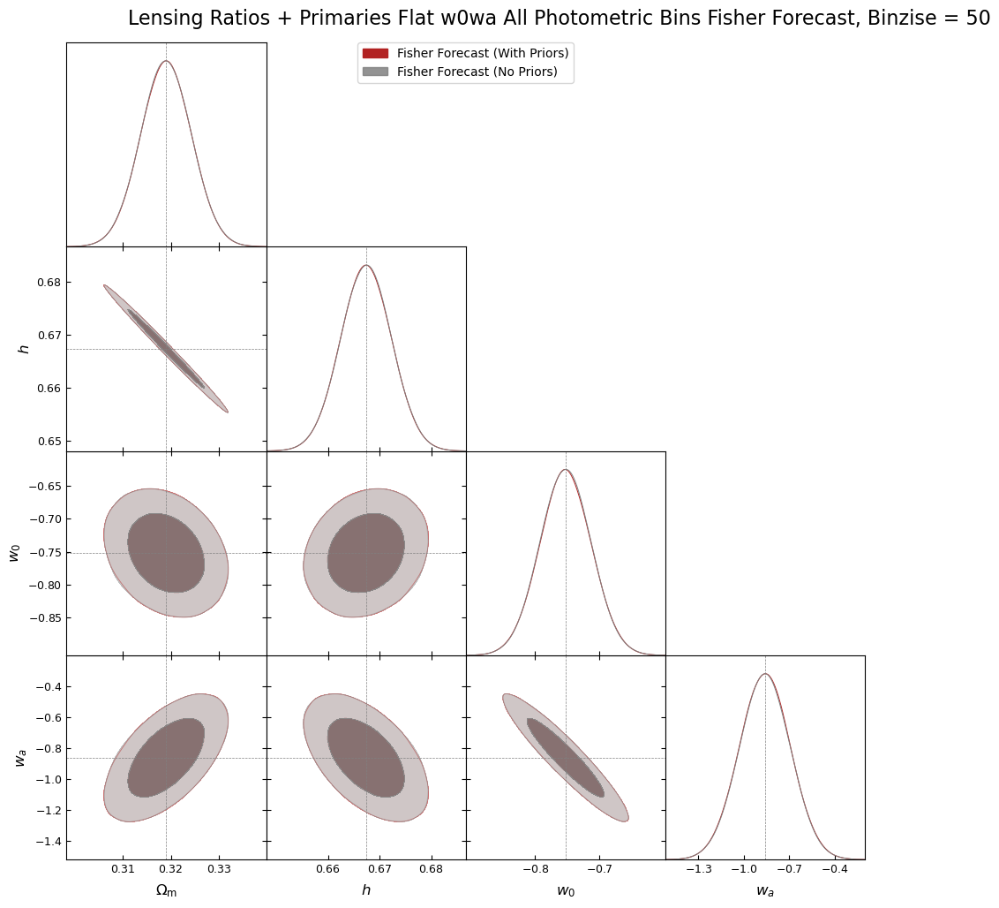

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.2676\pm 0.0046$ | $\Omega_{c} = 0.2676^{+0.0089}_{-0.0089}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.2676\pm 0.0046$ | $\Omega_{c} = 0.2676^{+0.0089}_{-0.0089}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.04991\pm 0.00073$ | $\Omega_{b} = 0.0499^{+0.0014}_{-0.0014}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.04991\pm 0.00073$ | $\Omega_{b} = 0.0499^{+0.0014}_{-0.0014}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6674\pm 0.0049$ | $h = 0.6674^{+0.0096}_{-0.0097}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6674\pm 0.0049$ | $h = 0.6674^{+0.0096}_{-0.0097}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -0.752\pm 0.040$ | $w_0 = -0.752^{+0.079}_{-0.078}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.752\pm 0.040$ | $w_0 = -0.752^{+0.078}_{-0.078}$ |
| --- | --- | --- | --- |
| **$w_a$** | Fisher Forecast (With Priors) | $w_a = -0.86\pm 0.17$ | $w_a = -0.86^{+0.33}_{-0.33}$ |
|  | Fisher Forecast (No Priors) | $w_a = -0.86\pm 0.17$ | $w_a = -0.86^{+0.33}_{-0.33}$ |
| --- | --- | --- | --- |
| **$A_s$** | Fisher Forecast (With Priors) | $A_s = \left(\,2.0940\pm 0.0042\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.0940^{+0.0081}_{-0.0082}\,\right)\cdot 10^{-9}$ |
|  | Fisher Forecast (No Priors) | $A_s = \left(\,2.0940\pm 0.0042\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.0940^{+0.0081}_{-0.0082}\,\right)\cdot 10^{-9}$ |
| --- | --- | --- | --- |
| **$n_s$** | Fisher Forecast (With Priors) | $n_s = 0.9654\pm 0.0023$ | $n_s = 0.9654^{+0.0046}_{-0.0045}$ |
|  | Fisher Forecast (No Priors) | $n_s = 0.9654\pm 0.0023$ | $n_s = 0.9654^{+0.0045}_{-0.0045}$ |
| --- | --- | --- | --- |

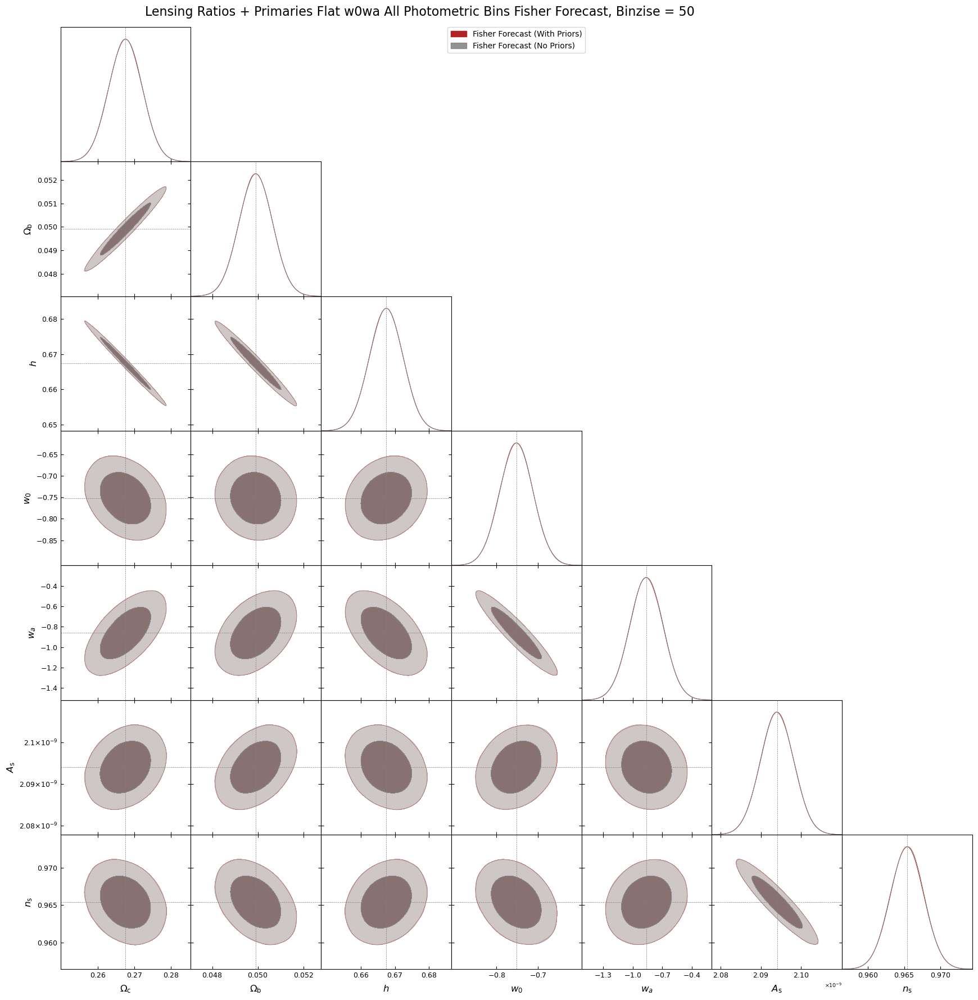

total_time:  0:03:53.960261


In [54]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=flat_w0waCDM_cosmology,
    lens_data=bgs_combined_array,
    source_data=HSC_dist_0_3,
    binsize=50,
    l_min =40,
    n_ell = 5000,
    f_sky = 0.4,
    magnification_bias_lenses = 0.8,
    linear_emulator = None,
    boost_emulator = None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=HSC_shape_noise,
    desired_spectra=['CG', 'GL', 'TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'w0', 'wa', 'A_s', 'n_s']
params_to_plot = ['Omega_m', 'h', 'w0', 'wa']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Fisher Matrices/Flat_w0waCDM_LRP_Photo_BGS_HSCBinsize=50.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h w0 wa A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, w0, wa, A_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Covariance Matrices/Flat_w0waCDM_LRP_Photo_BGS_HSC_Binsize=50.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h w0 wa A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, w0, wa, A_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios + Primaries Flat w0wa All Photometric Bins Fisher Forecast, Binzise = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

g2 = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios + Primaries Flat w0wa All Photometric Bins Fisher Forecast, Binzise = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

In [ ]:
# REPLACE

### Curved w0waCDM: $\Omega_m, h, \Omega_k, w_0, w_a$

#### Lensing Ratios

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.319\pm 0.013$ | $\Omega_m = 0.319^{+0.026}_{-0.026}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = \Omega_\mathrm{m} < 0.329$ | $\Omega_m = \Omega_\mathrm{m} < 0.353$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.66^{+0.13}_{-0.16}$ | $h = 0.66^{+0.27}_{-0.25}$ |
|  | Fisher Forecast (No Priors) | $h = 0.67\pm 0.32$ | $h = 0.67^{+0.64}_{-0.64}$ |
| --- | --- | --- | --- |
| **$\Omega_k$** | Fisher Forecast (With Priors) | $\Omega_k = -0.005\pm 0.061$ | $\Omega_k = -0.01^{+0.12}_{-0.12}$ |
|  | Fisher Forecast (No Priors) | $\Omega_k = 0.001\pm 0.069$ | $\Omega_k = 0.00^{+0.13}_{-0.13}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -0.77\pm 0.10$ | $w_0 = -0.77^{+0.20}_{-0.20}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.76\pm 0.11$ | $w_0 = -0.76^{+0.21}_{-0.21}$ |
| --- | --- | --- | --- |
| **$w_a$** | Fisher Forecast (With Priors) | $w_a = -0.73\pm 0.99$ | $w_a = -0.7^{+1.9}_{-1.9}$ |
|  | Fisher Forecast (No Priors) | $w_a = -0.8\pm 1.1$ | $w_a = -0.8^{+2.2}_{-2.2}$ |
| --- | --- | --- | --- |

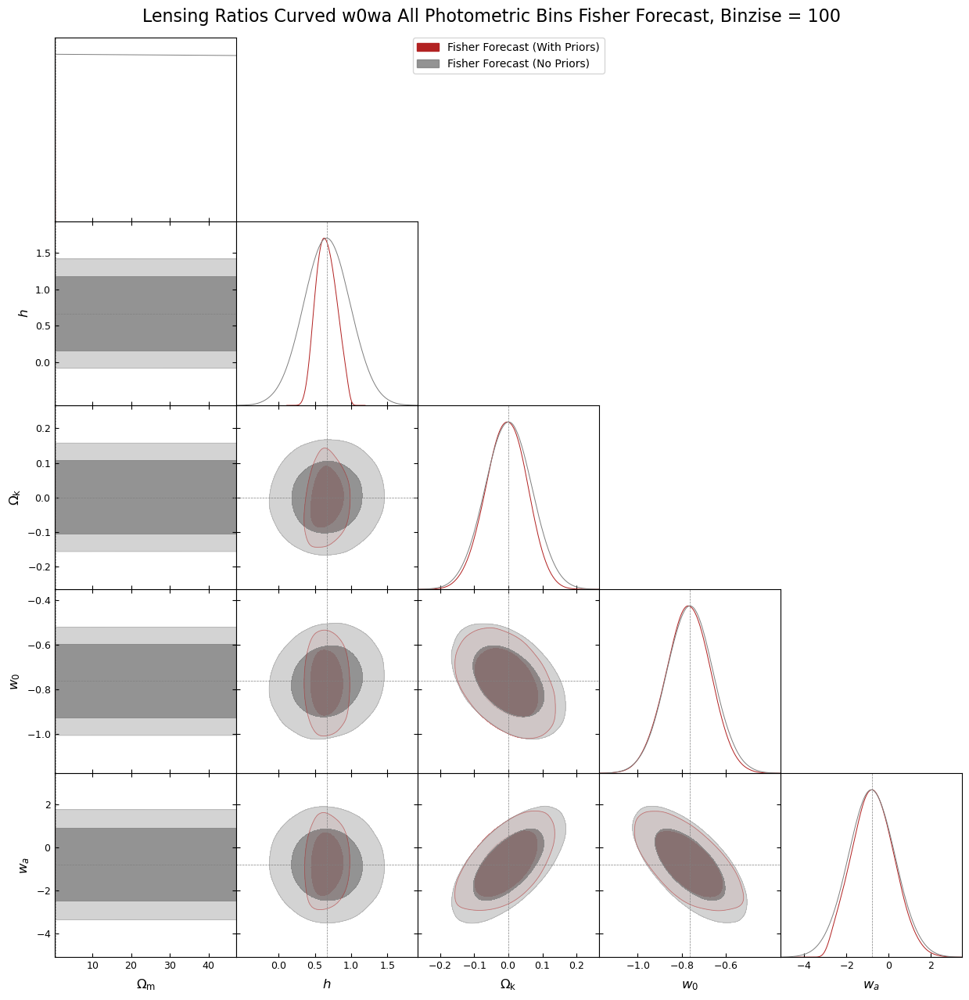

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.263^{+0.037}_{-0.024}$ | $\Omega_{c} = 0.263^{+0.054}_{-0.061}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.268\pm 0.059$ | $\Omega_{c} = 0.27^{+0.12}_{-0.12}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.054^{+0.016}_{-0.041}$ | $\Omega_{b} = 0.054^{+0.053}_{-0.043}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.050\pm 0.060$ | $\Omega_{b} = 0.05^{+0.12}_{-0.12}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.66^{+0.13}_{-0.16}$ | $h = 0.66^{+0.27}_{-0.25}$ |
|  | Fisher Forecast (No Priors) | $h = 0.67\pm 0.32$ | $h = 0.67^{+0.64}_{-0.64}$ |
| --- | --- | --- | --- |
| **$\Omega_k$** | Fisher Forecast (With Priors) | $\Omega_k = -0.006\pm 0.060$ | $\Omega_k = -0.01^{+0.12}_{-0.12}$ |
|  | Fisher Forecast (No Priors) | $\Omega_k = 0.001\pm 0.068$ | $\Omega_k = 0.00^{+0.13}_{-0.13}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -0.77\pm 0.10$ | $w_0 = -0.77^{+0.20}_{-0.20}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.76\pm 0.11$ | $w_0 = -0.76^{+0.21}_{-0.21}$ |
| --- | --- | --- | --- |
| **$w_a$** | Fisher Forecast (With Priors) | $w_a = -0.74\pm 0.98$ | $w_a = -0.7^{+1.9}_{-1.9}$ |
|  | Fisher Forecast (No Priors) | $w_a = -0.8\pm 1.1$ | $w_a = -0.8^{+2.2}_{-2.2}$ |
| --- | --- | --- | --- |
| **$A_s$** | Fisher Forecast (With Priors) | $A_s = \left(\,2.23^{+0.30}_{-0.61}\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.23^{+0.83}_{-0.74}\,\right)\cdot 10^{-9}$ |
|  | Fisher Forecast (No Priors) | $A_s = \left(\,2.10\pm 0.88\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.1^{+1.7}_{-1.7}\,\right)\cdot 10^{-9}$ |
| --- | --- | --- | --- |
| **$n_s$** | Fisher Forecast (With Priors) | $n_s = 0.973^{+0.033}_{-0.052}$ | $n_s = 0.973^{+0.076}_{-0.072}$ |
|  | Fisher Forecast (No Priors) | $n_s = 0.964\pm 0.076$ | $n_s = 0.96^{+0.15}_{-0.15}$ |
| --- | --- | --- | --- |

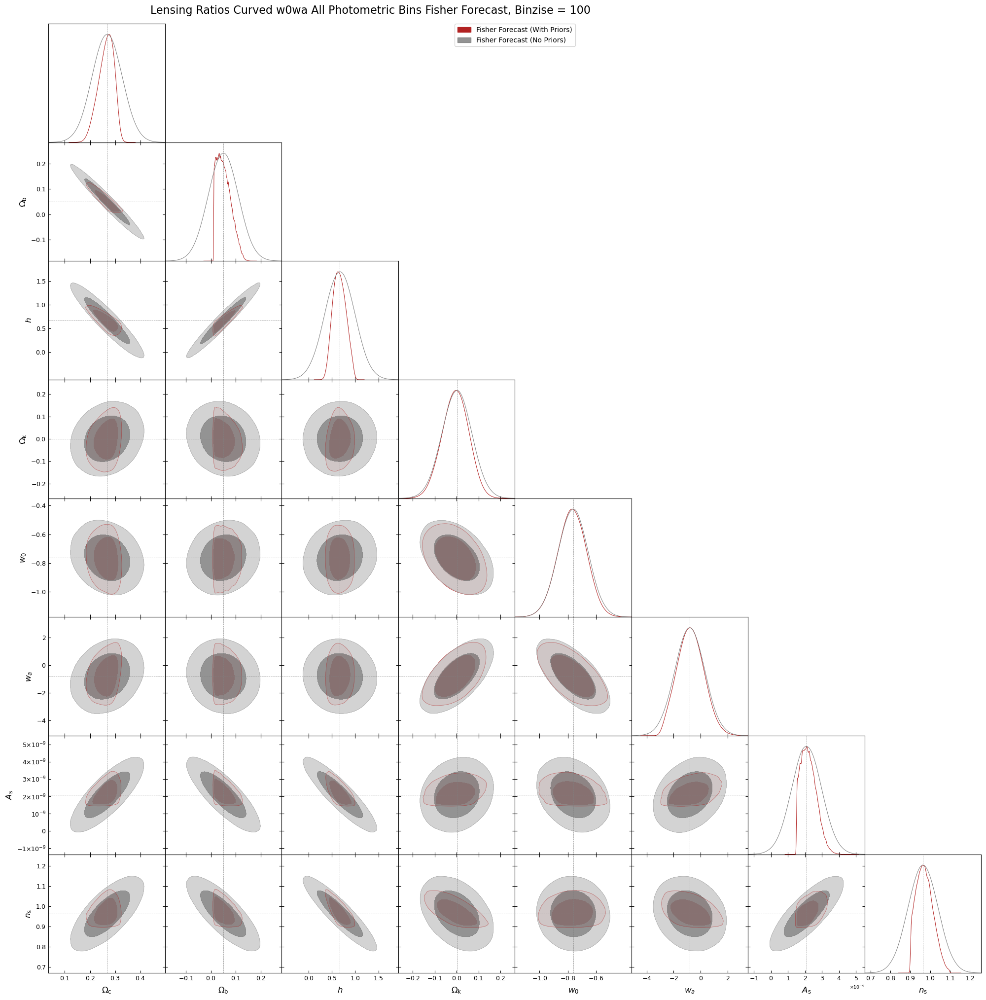

total_time:  0:02:27.528774


In [55]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=curved_w0waCDM_cosmology,
    lens_data=bgs_combined_array,
    source_data=HSC_dist_0_3,
    binsize=100,
    l_min =40,
    n_ell = 5000,
    f_sky = 0.4,
    magnification_bias_lenses = 0.8,
    linear_emulator = None,
    boost_emulator = None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=None,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=HSC_shape_noise,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'Omega_k', 'w0', 'wa', 'A_s', 'n_s']
params_to_plot = ['Omega_m', 'h', 'Omega_k', 'w0', 'wa']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Fisher Matrices/Curved_w0waCDM_LR_Photo_BGS_HSC_Binsize=100.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h Omega_k w0 wa A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, Omega_k, w0, wa, A_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Covariance Matrices/Curved_w0waCDM_LR_Photo_BGS_HSC_Binsize=100.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h Omega_k w0 wa A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, Omega_k, w0, wa, A_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios Curved w0wa All Photometric Bins Fisher Forecast, Binzise = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

# Call the unified class method to load, sample, overlay, and plot everything
g2 = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios Curved w0wa All Photometric Bins Fisher Forecast, Binzise = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.319\pm 0.012$ | $\Omega_m = 0.319^{+0.024}_{-0.024}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = \Omega_\mathrm{m} < 0.327$ | $\Omega_m = \Omega_\mathrm{m} < 0.344$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.65^{+0.13}_{-0.15}$ | $h = 0.65^{+0.26}_{-0.24}$ |
|  | Fisher Forecast (No Priors) | $h = 0.67\pm 0.26$ | $h = 0.67^{+0.50}_{-0.51}$ |
| --- | --- | --- | --- |
| **$\Omega_k$** | Fisher Forecast (With Priors) | $\Omega_k = -0.004\pm 0.059$ | $\Omega_k = 0.00^{+0.11}_{-0.12}$ |
|  | Fisher Forecast (No Priors) | $\Omega_k = 0.001\pm 0.066$ | $\Omega_k = 0.00^{+0.13}_{-0.13}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -0.77\pm 0.10$ | $w_0 = -0.77^{+0.20}_{-0.20}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.76\pm 0.10$ | $w_0 = -0.76^{+0.20}_{-0.20}$ |
| --- | --- | --- | --- |
| **$w_a$** | Fisher Forecast (With Priors) | $w_a = -0.73\pm 0.96$ | $w_a = -0.7^{+1.8}_{-1.9}$ |
|  | Fisher Forecast (No Priors) | $w_a = -0.8\pm 1.1$ | $w_a = -0.8^{+2.1}_{-2.1}$ |
| --- | --- | --- | --- |

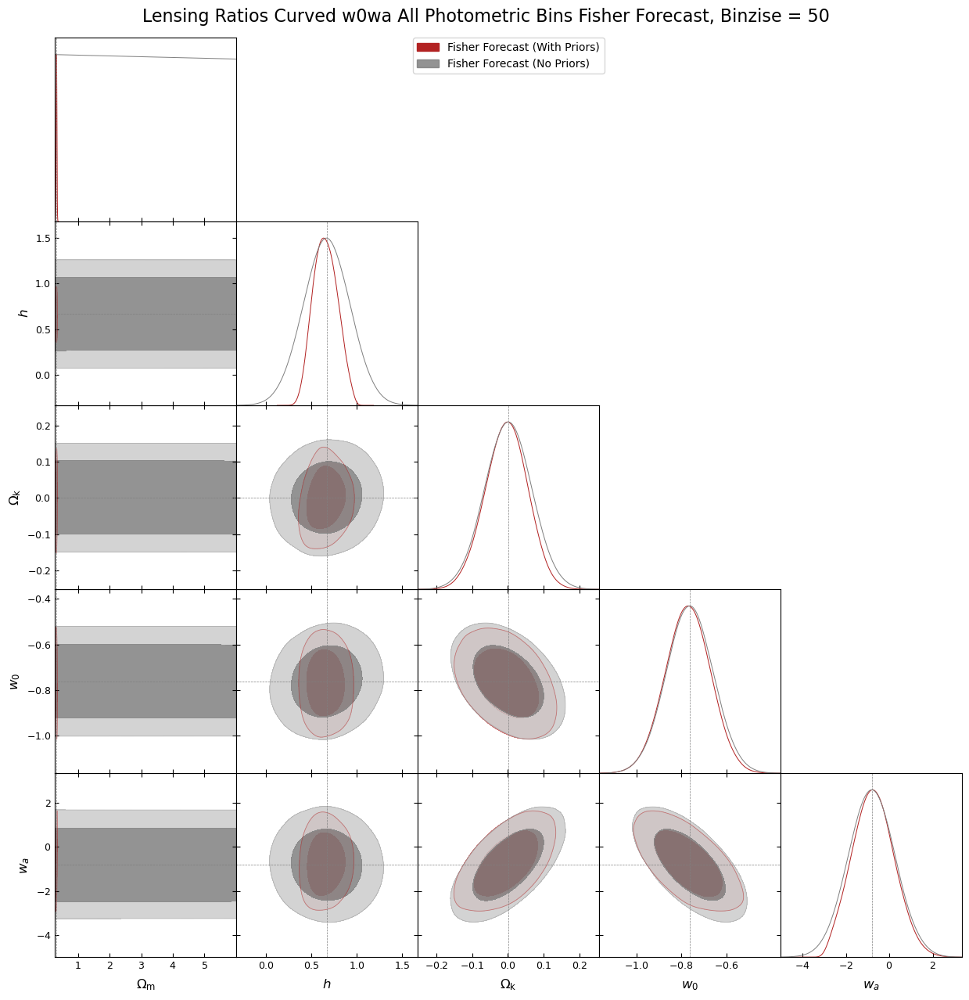

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.265^{+0.033}_{-0.023}$ | $\Omega_{c} = 0.265^{+0.050}_{-0.056}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.268\pm 0.046$ | $\Omega_{c} = 0.268^{+0.090}_{-0.091}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.052^{+0.014}_{-0.039}$ | $\Omega_{b} = 0.052^{+0.048}_{-0.041}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.050\pm 0.047$ | $\Omega_{b} = 0.050^{+0.092}_{-0.092}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.66\pm 0.13$ | $h = 0.66^{+0.26}_{-0.24}$ |
|  | Fisher Forecast (No Priors) | $h = 0.67\pm 0.26$ | $h = 0.67^{+0.51}_{-0.50}$ |
| --- | --- | --- | --- |
| **$\Omega_k$** | Fisher Forecast (With Priors) | $\Omega_k = -0.004\pm 0.059$ | $\Omega_k = 0.00^{+0.11}_{-0.12}$ |
|  | Fisher Forecast (No Priors) | $\Omega_k = 0.001\pm 0.066$ | $\Omega_k = 0.00^{+0.13}_{-0.13}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -0.77\pm 0.10$ | $w_0 = -0.77^{+0.19}_{-0.20}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.76\pm 0.10$ | $w_0 = -0.76^{+0.20}_{-0.20}$ |
| --- | --- | --- | --- |
| **$w_a$** | Fisher Forecast (With Priors) | $w_a = -0.73\pm 0.96$ | $w_a = -0.7^{+1.8}_{-1.9}$ |
|  | Fisher Forecast (No Priors) | $w_a = -0.8\pm 1.1$ | $w_a = -0.8^{+2.1}_{-2.1}$ |
| --- | --- | --- | --- |
| **$A_s$** | Fisher Forecast (With Priors) | $A_s = \left(\,2.23^{+0.30}_{-0.61}\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.23^{+0.83}_{-0.74}\,\right)\cdot 10^{-9}$ |
|  | Fisher Forecast (No Priors) | $A_s = \left(\,2.09\pm 0.77\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.1^{+1.5}_{-1.5}\,\right)\cdot 10^{-9}$ |
| --- | --- | --- | --- |
| **$n_s$** | Fisher Forecast (With Priors) | $n_s = 0.973^{+0.034}_{-0.050}$ | $n_s = 0.973^{+0.074}_{-0.072}$ |
|  | Fisher Forecast (No Priors) | $n_s = 0.964\pm 0.065$ | $n_s = 0.96^{+0.13}_{-0.13}$ |
| --- | --- | --- | --- |

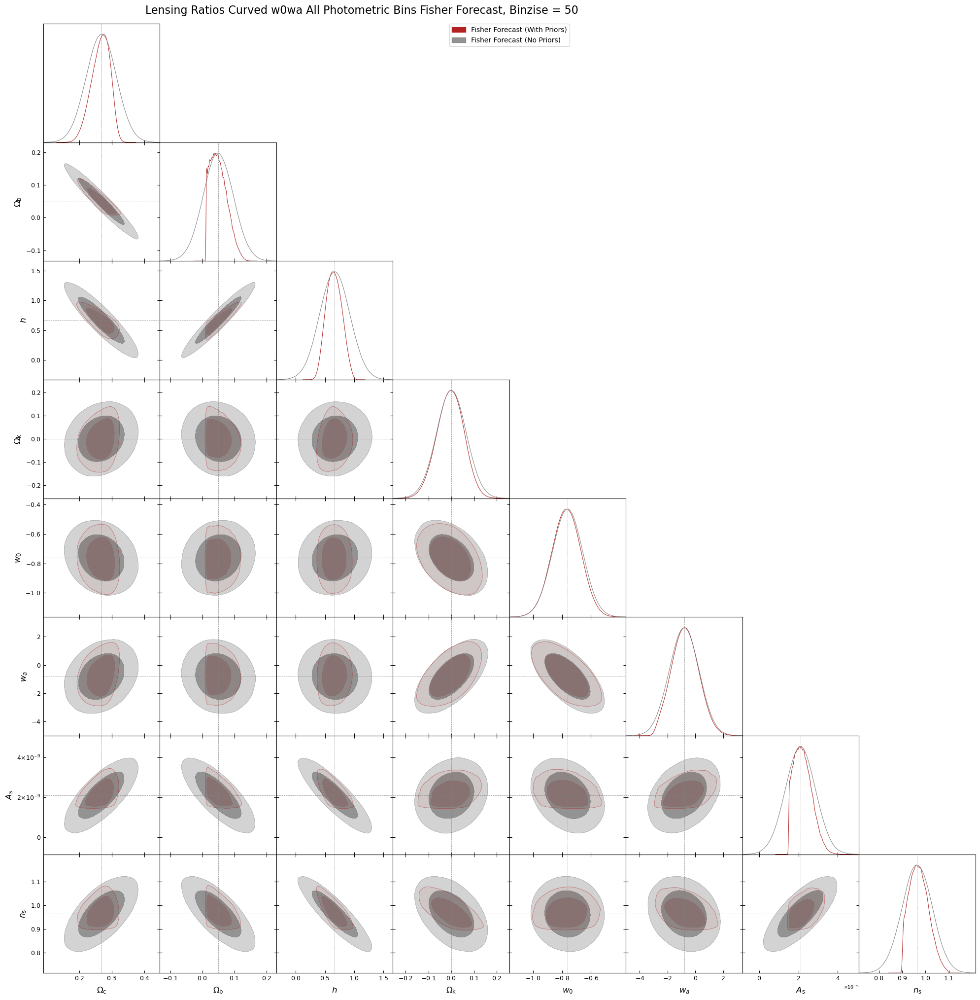

total_time:  0:02:34.033218


In [56]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=curved_w0waCDM_cosmology,
    lens_data=bgs_combined_array,
    source_data=HSC_dist_0_3,
    binsize=50,
    l_min =40,
    n_ell = 5000,
    f_sky = 0.4,
    magnification_bias_lenses = 0.8,
    linear_emulator = None,
    boost_emulator = None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=None,
    cmb_noise_EE=None,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=HSC_shape_noise,
    desired_spectra=['CG', 'GL'],
    cmb_primaries=False,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'Omega_k', 'w0', 'wa', 'A_s', 'n_s']
params_to_plot = ['Omega_m', 'h', 'Omega_k', 'w0', 'wa']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Fisher Matrices/Curved_w0waCDM_LR_Photo_BGS_HSC_Binsize=50.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h Omega_k w0 wa A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, Omega_k, w0, wa, A_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Covariance Matrices/Curved_w0waCDM_LR_Photo_BGS_HSC_Binsize=50.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h Omega_k w0 wa A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, Omega_k, w0, wa, A_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios Curved w0wa All Photometric Bins Fisher Forecast, Binzise = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

# Call the unified class method to load, sample, overlay, and plot everything
g2 = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios Curved w0wa All Photometric Bins Fisher Forecast, Binzise = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

In [ ]:
# REPLACE

#### Primaries

| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.289^{+0.080}_{-0.12}$ | $\Omega_m = 0.29^{+0.17}_{-0.17}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3\pm 1.3$ | $\Omega_m = 0.33^{+0.70}_{-0.66}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.700^{+0.12}_{-0.084}$ | $h = 0.70^{+0.17}_{-0.18}$ |
|  | Fisher Forecast (No Priors) | $h = 0.67\pm 0.18$ | $h = 0.67^{+0.36}_{-0.36}$ |
| --- | --- | --- | --- |
| **$\Omega_k$** | Fisher Forecast (With Priors) | $\Omega_k = -0.00096\pm 0.0044$ | $\Omega_k = -0.00096^{+0.0087}_{-0.0084}$ |
|  | Fisher Forecast (No Priors) | $\Omega_k = 0.0008\pm 0.0079$ | $\Omega_k = 0.001^{+0.015}_{-0.015}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -1.18^{+0.83}_{-0.31}$ | $w_0 = -1.18^{+0.87}_{-0.96}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.8\pm 1.8$ | $w_0 = -0.8^{+3.4}_{-3.4}$ |
| --- | --- | --- | --- |
| **$w_a$** | Fisher Forecast (With Priors) | $w_a = 0.3^{+1.8}_{-1.5}$ | $w_a = 0.3^{+2.7}_{-2.6}$ |
|  | Fisher Forecast (No Priors) | $w_a = -0.8\pm 4.4$ | $w_a = -0.8^{+8.7}_{-8.7}$ |
| --- | --- | --- | --- |

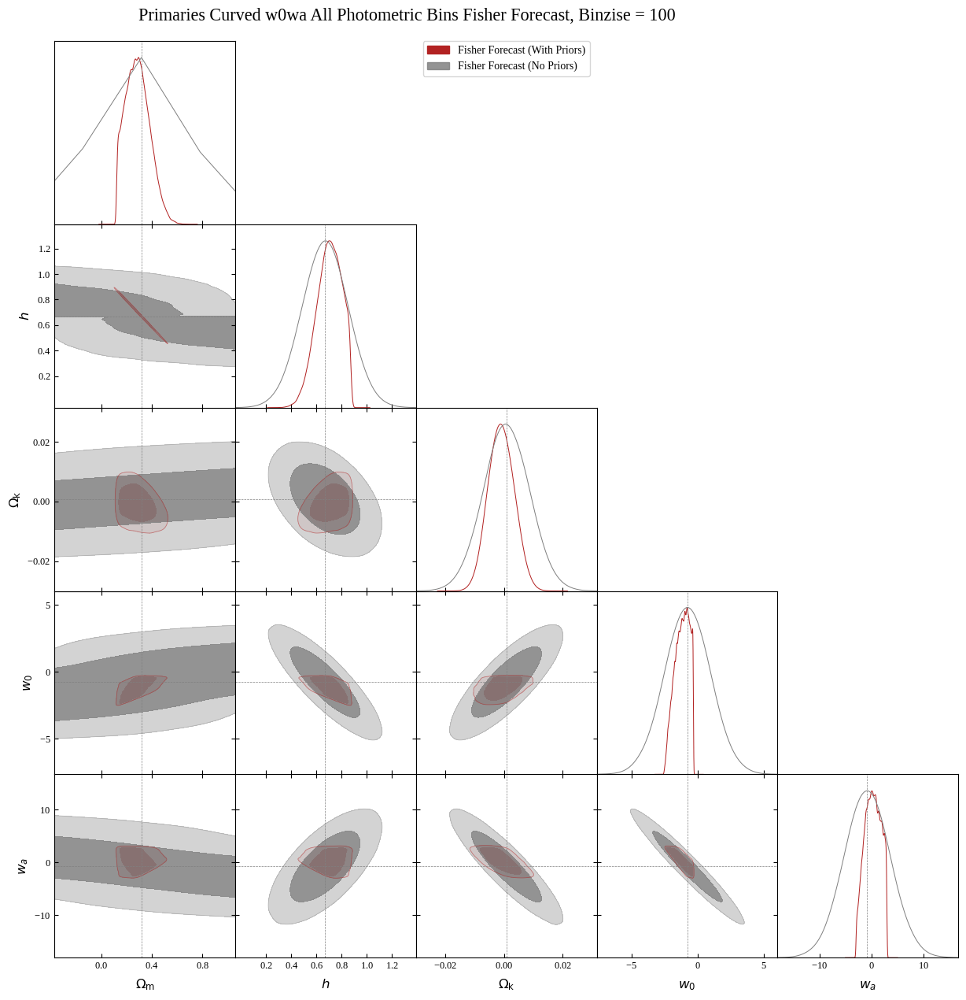

| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.243^{+0.068}_{-0.096}$ | $\Omega_{c} = 0.24^{+0.14}_{-0.14}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.27\pm 0.15$ | $\Omega_{c} = 0.27^{+0.29}_{-0.29}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.045^{+0.013}_{-0.018}$ | $\Omega_{b} = 0.045^{+0.027}_{-0.026}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.050\pm 0.027$ | $\Omega_{b} = 0.050^{+0.054}_{-0.054}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.700^{+0.12}_{-0.084}$ | $h = 0.70^{+0.17}_{-0.18}$ |
|  | Fisher Forecast (No Priors) | $h = 0.67\pm 0.18$ | $h = 0.67^{+0.36}_{-0.36}$ |
| --- | --- | --- | --- |
| **$\Omega_k$** | Fisher Forecast (With Priors) | $\Omega_k = -0.0009\pm 0.0044$ | $\Omega_k = -0.0009^{+0.0087}_{-0.0084}$ |
|  | Fisher Forecast (No Priors) | $\Omega_k = 0.0007\pm 0.0079$ | $\Omega_k = 0.001^{+0.015}_{-0.015}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -1.18^{+0.83}_{-0.31}$ | $w_0 = -1.18^{+0.87}_{-0.95}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.8\pm 1.7$ | $w_0 = -0.8^{+3.4}_{-3.4}$ |
| --- | --- | --- | --- |
| **$w_a$** | Fisher Forecast (With Priors) | $w_a = 0.3\pm 1.5$ | $w_a = 0.3^{+2.7}_{-2.6}$ |
|  | Fisher Forecast (No Priors) | $w_a = -0.8\pm 4.4$ | $w_a = -0.8^{+8.7}_{-8.7}$ |
| --- | --- | --- | --- |
| **$A_s$** | Fisher Forecast (With Priors) | $A_s = \left(\,2.0947\pm 0.0069\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.095^{+0.014}_{-0.014}\,\right)\cdot 10^{-9}$ |
|  | Fisher Forecast (No Priors) | $A_s = \left(\,2.0950\pm 0.0071\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.095^{+0.014}_{-0.014}\,\right)\cdot 10^{-9}$ |
| --- | --- | --- | --- |
| **$n_s$** | Fisher Forecast (With Priors) | $n_s = 0.9641\pm 0.0037$ | $n_s = 0.9641^{+0.0072}_{-0.0072}$ |
|  | Fisher Forecast (No Priors) | $n_s = 0.9644\pm 0.0038$ | $n_s = 0.9644^{+0.0075}_{-0.0075}$ |
| --- | --- | --- | --- |

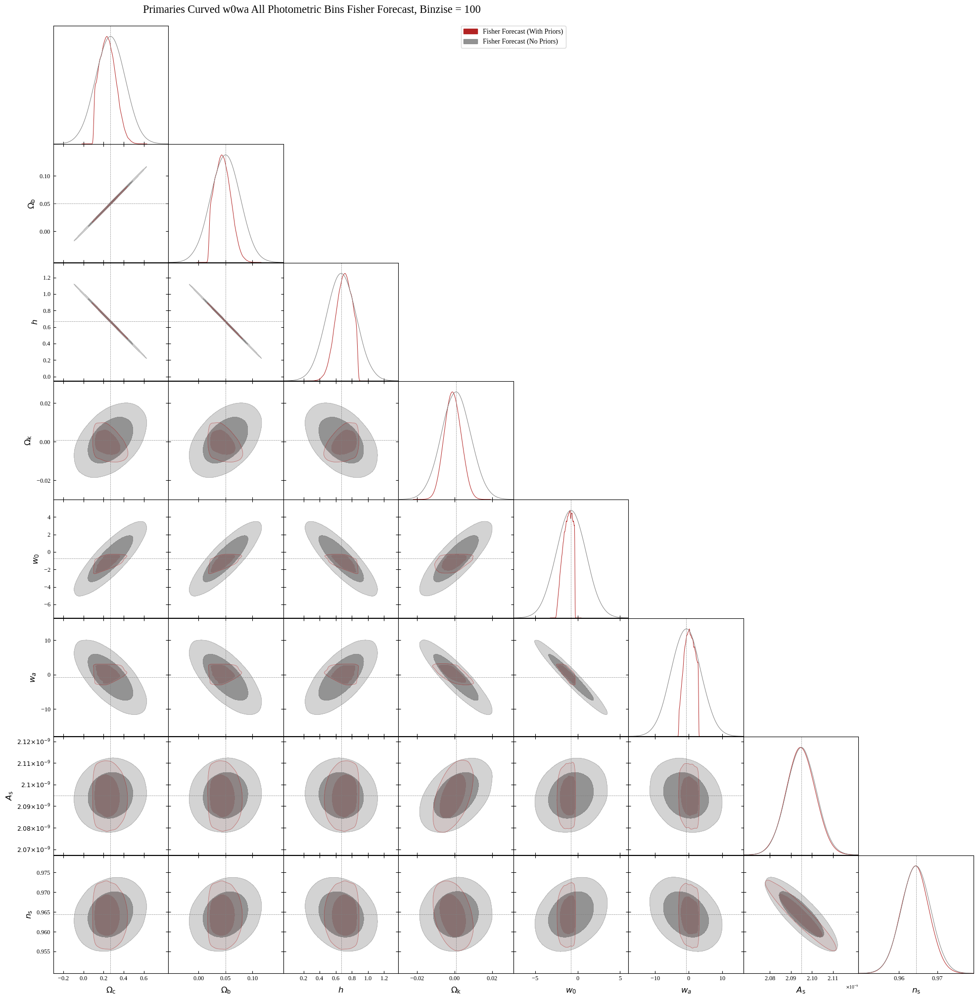

total_time:  0:02:57.485496


In [68]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=curved_w0waCDM_cosmology,
    lens_data=DESI_lens_data,
    source_data=HSC_dist_0_3,
    binsize=100,
    l_min =40,
    n_ell = 5000,
    f_sky = 0.4,
    magnification_bias_lenses = 0.8,
    linear_emulator = None,
    boost_emulator = None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=DESI_shot_noise,
    shape_noise_source=DESI_shape_noise,
    desired_spectra=['TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'Omega_k', 'w0', 'wa', 'A_s', 'n_s']
params_to_plot = ['Omega_m', 'h', 'Omega_k', 'w0', 'wa']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Fisher Matrices/Curved_w0waCDM_Primaries_All_Photometric_Bins_Binsize=100.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h Omega_k w0 wa A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, Omega_k, w0, wa, A_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Covariance Matrices/Curved_w0waCDM_Primaries_All_Photometric_Bins_Binsize=100.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h Omega_k w0 wa A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, Omega_k, w0, wa, A_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="Primaries Curved w0wa All Photometric Bins Fisher Forecast, Binzise = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

g2 = forecaster_c1.plot_with_cobaya_overlay(
    title="Primaries Curved w0wa All Photometric Bins Fisher Forecast, Binzise = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.289^{+0.083}_{-0.11}$ | $\Omega_m = 0.29^{+0.16}_{-0.16}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.32^{+0.33}_{-0.61}$ | $\Omega_m = \Omega_\mathrm{m} < 0.583$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.700^{+0.11}_{-0.086}$ | $h = 0.70^{+0.17}_{-0.17}$ |
|  | Fisher Forecast (No Priors) | $h = 0.67\pm 0.17$ | $h = 0.67^{+0.32}_{-0.33}$ |
| --- | --- | --- | --- |
| **$\Omega_k$** | Fisher Forecast (With Priors) | $\Omega_k = -0.0009\pm 0.0043$ | $\Omega_k = -0.0009^{+0.0085}_{-0.0082}$ |
|  | Fisher Forecast (No Priors) | $\Omega_k = 0.0008\pm 0.0074$ | $\Omega_k = 0.001^{+0.014}_{-0.014}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -1.17^{+0.82}_{-0.30}$ | $w_0 = -1.17^{+0.86}_{-0.94}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.8\pm 1.6$ | $w_0 = -0.8^{+3.1}_{-3.1}$ |
| --- | --- | --- | --- |
| **$w_a$** | Fisher Forecast (With Priors) | $w_a = 0.2\pm 1.5$ | $w_a = 0.2^{+2.7}_{-2.5}$ |
|  | Fisher Forecast (No Priors) | $w_a = -0.8\pm 4.1$ | $w_a = -0.8^{+8.0}_{-8.0}$ |
| --- | --- | --- | --- |

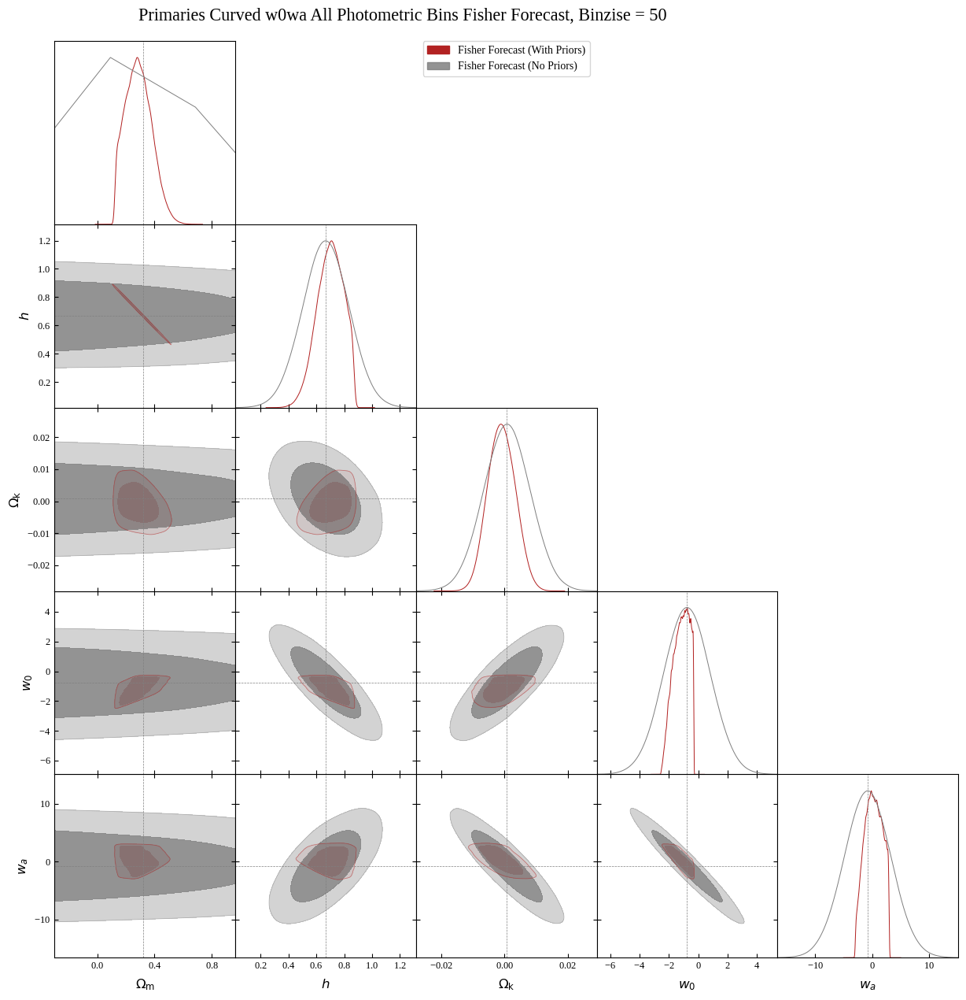

| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.243^{+0.068}_{-0.091}$ | $\Omega_{c} = 0.24^{+0.14}_{-0.14}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.27\pm 0.13$ | $\Omega_{c} = 0.27^{+0.26}_{-0.26}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.045^{+0.013}_{-0.017}$ | $\Omega_{b} = 0.045^{+0.026}_{-0.025}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.050\pm 0.025$ | $\Omega_{b} = 0.050^{+0.049}_{-0.048}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.700^{+0.11}_{-0.084}$ | $h = 0.70^{+0.17}_{-0.17}$ |
|  | Fisher Forecast (No Priors) | $h = 0.67\pm 0.17$ | $h = 0.67^{+0.32}_{-0.33}$ |
| --- | --- | --- | --- |
| **$\Omega_k$** | Fisher Forecast (With Priors) | $\Omega_k = -0.0009\pm 0.0043$ | $\Omega_k = -0.0009^{+0.0085}_{-0.0082}$ |
|  | Fisher Forecast (No Priors) | $\Omega_k = 0.0008\pm 0.0074$ | $\Omega_k = 0.001^{+0.014}_{-0.015}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -1.17^{+0.82}_{-0.39}$ | $w_0 = -1.17^{+0.87}_{-0.94}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.8\pm 1.6$ | $w_0 = -0.8^{+3.1}_{-3.1}$ |
| --- | --- | --- | --- |
| **$w_a$** | Fisher Forecast (With Priors) | $w_a = 0.2\pm 1.5$ | $w_a = 0.2^{+2.7}_{-2.6}$ |
|  | Fisher Forecast (No Priors) | $w_a = -0.8\pm 4.1$ | $w_a = -0.8^{+8.0}_{-8.0}$ |
| --- | --- | --- | --- |
| **$A_s$** | Fisher Forecast (With Priors) | $A_s = \left(\,2.0947\pm 0.0065\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.095^{+0.013}_{-0.013}\,\right)\cdot 10^{-9}$ |
|  | Fisher Forecast (No Priors) | $A_s = \left(\,2.0950\pm 0.0066\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.095^{+0.013}_{-0.013}\,\right)\cdot 10^{-9}$ |
| --- | --- | --- | --- |
| **$n_s$** | Fisher Forecast (With Priors) | $n_s = 0.9641\pm 0.0035$ | $n_s = 0.9641^{+0.0068}_{-0.0068}$ |
|  | Fisher Forecast (No Priors) | $n_s = 0.9644\pm 0.0036$ | $n_s = 0.9644^{+0.0070}_{-0.0071}$ |
| --- | --- | --- | --- |

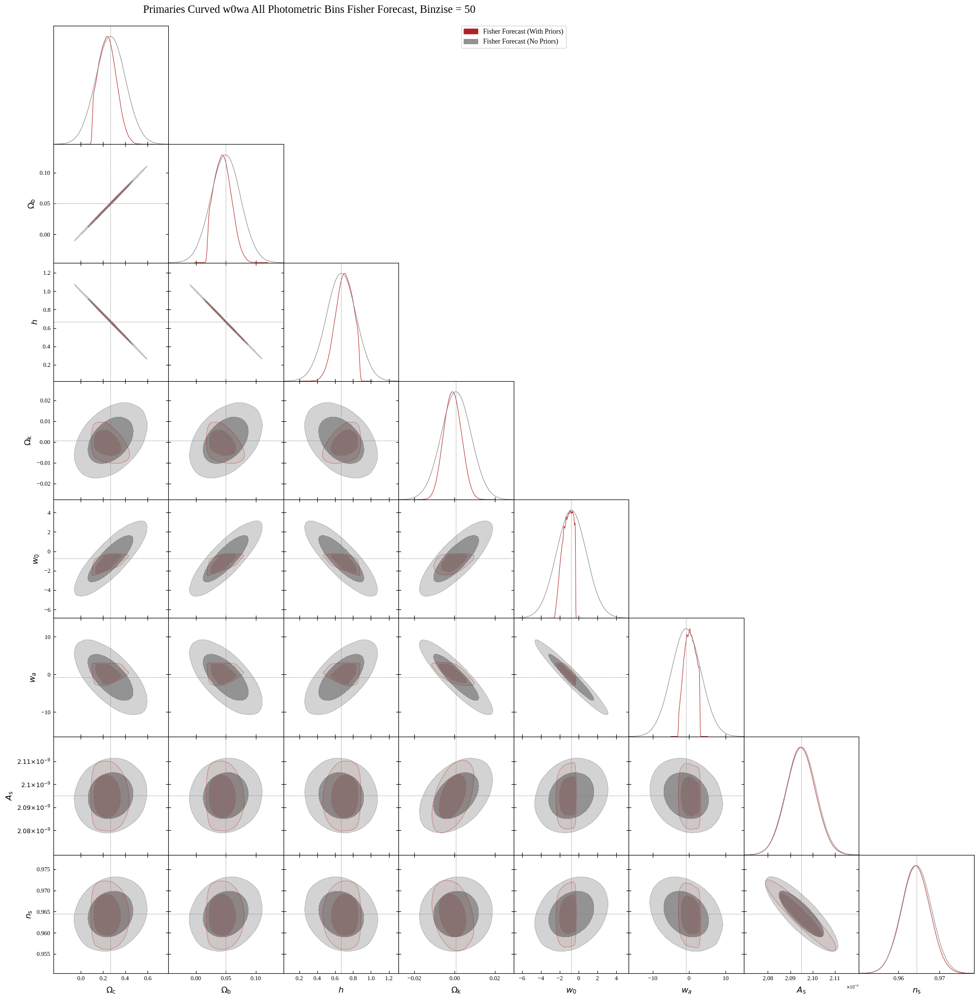

total_time:  0:03:28.679188


In [69]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=curved_w0waCDM_cosmology,
    lens_data=DESI_lens_data,
    source_data=HSC_dist_0_3,
    binsize=50,
    l_min =40,
    n_ell = 5000,
    f_sky = 0.4,
    magnification_bias_lenses = 0.8,
    linear_emulator = None,
    boost_emulator = None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=DESI_shot_noise,
    shape_noise_source=DESI_shape_noise,
    desired_spectra=['TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'Omega_k', 'w0', 'wa', 'A_s', 'n_s']
params_to_plot = ['Omega_m', 'h', 'Omega_k', 'w0', 'wa']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Fisher Matrices/Curved_w0waCDM_Primaries_All_Photometric_Bins_Binsize=50.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h Omega_k w0 wa A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, Omega_k, w0, wa, A_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Covariance Matrices/Curved_w0waCDM_Primaries_All_Photometric_Bins_Binsize=50.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h Omega_k w0 wa A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, Omega_k, w0, wa, A_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="Primaries Curved w0wa All Photometric Bins Fisher Forecast, Binzise = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

g2 = forecaster_c1.plot_with_cobaya_overlay(
    title="Primaries Curved w0wa All Photometric Bins Fisher Forecast, Binzise = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Plot successfully saved to: plots/Fisher Forecasts/so_primaries_curved_w0wacdm_fisher_forecast_bin_size_=_20.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.289^{+0.082}_{-0.11}$ | $\Omega_m = 0.29^{+0.16}_{-0.16}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = \Omega_\mathrm{m} < 0.391$ | $\Omega_m = \Omega_\mathrm{m} < 0.572$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.700^{+0.11}_{-0.086}$ | $h = 0.70^{+0.17}_{-0.17}$ |
|  | Fisher Forecast (No Priors) | $h = 0.67\pm 0.16$ | $h = 0.67^{+0.32}_{-0.31}$ |
| --- | --- | --- | --- |
| **$\Omega_k$** | Fisher Forecast (With Priors) | $\Omega_k = -0.0009\pm 0.0043$ | $\Omega_k = -0.0009^{+0.0084}_{-0.0081}$ |
|  | Fisher Forecast (No Priors) | $\Omega_k = 0.0008\pm 0.0072$ | $\Omega_k = 0.001^{+0.014}_{-0.014}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -1.17^{+0.82}_{-0.31}$ | $w_0 = -1.17^{+0.86}_{-0.94}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.8\pm 1.5$ | $w_0 = -0.8^{+3.0}_{-3.0}$ |
| --- | --- | --- | --- |
| **$w_a$** | Fisher Forecast (With Priors) | $w_a = 0.2\pm 1.5$ | $w_a = 0.2^{+2.7}_{-2.5}$ |
|  | Fisher Forecast (No Priors) | $w_a = -0.8\pm 4.0$ | $w_a = -0.8^{+7.8}_{-7.8}$ |
| --- | --- | --- | --- |

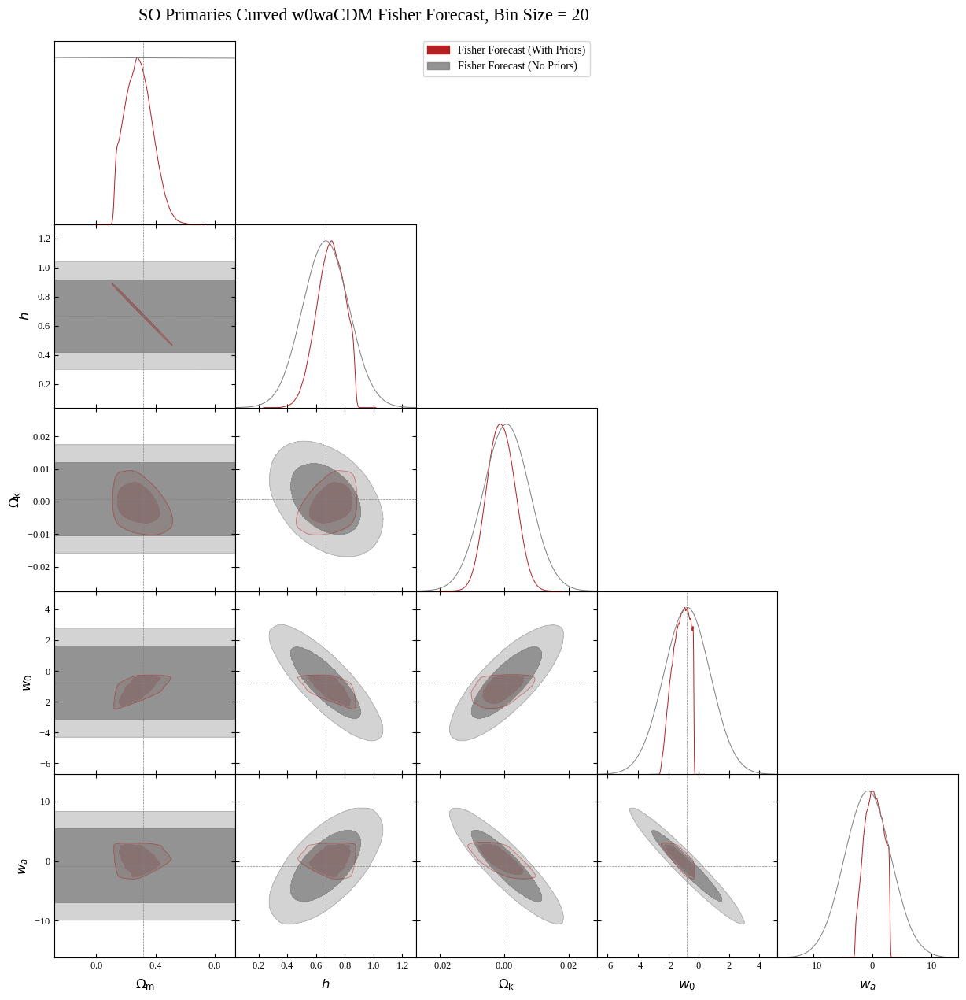

Plot successfully saved to: plots/Fisher Forecasts/so_primaries_curved_w0wacdm_fisher_forecast_bin_size_=_20_--_all_sampled_parameters_plotted.pdf


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.242^{+0.070}_{-0.089}$ | $\Omega_{c} = 0.24^{+0.14}_{-0.14}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.27\pm 0.13$ | $\Omega_{c} = 0.27^{+0.26}_{-0.25}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.045^{+0.013}_{-0.016}$ | $\Omega_{b} = 0.045^{+0.025}_{-0.025}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.050\pm 0.024$ | $\Omega_{b} = 0.050^{+0.047}_{-0.047}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.701^{+0.11}_{-0.087}$ | $h = 0.70^{+0.17}_{-0.17}$ |
|  | Fisher Forecast (No Priors) | $h = 0.67\pm 0.16$ | $h = 0.67^{+0.32}_{-0.32}$ |
| --- | --- | --- | --- |
| **$\Omega_k$** | Fisher Forecast (With Priors) | $\Omega_k = -0.0009\pm 0.0043$ | $\Omega_k = -0.0009^{+0.0084}_{-0.0082}$ |
|  | Fisher Forecast (No Priors) | $\Omega_k = 0.0008\pm 0.0072$ | $\Omega_k = 0.001^{+0.014}_{-0.014}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -1.17^{+0.82}_{-0.31}$ | $w_0 = -1.17^{+0.87}_{-0.95}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.8\pm 1.5$ | $w_0 = -0.8^{+3.0}_{-3.0}$ |
| --- | --- | --- | --- |
| **$w_a$** | Fisher Forecast (With Priors) | $w_a = 0.2\pm 1.5$ | $w_a = 0.2^{+2.7}_{-2.5}$ |
|  | Fisher Forecast (No Priors) | $w_a = -0.8\pm 4.0$ | $w_a = -0.8^{+7.8}_{-7.8}$ |
| --- | --- | --- | --- |
| **$A_s$** | Fisher Forecast (With Priors) | $A_s = \left(\,2.0947\pm 0.0063\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.095^{+0.012}_{-0.012}\,\right)\cdot 10^{-9}$ |
|  | Fisher Forecast (No Priors) | $A_s = \left(\,2.0950\pm 0.0064\,\right)\cdot 10^{-9}$ | $A_s = \left(\,2.095^{+0.012}_{-0.012}\,\right)\cdot 10^{-9}$ |
| --- | --- | --- | --- |
| **$n_s$** | Fisher Forecast (With Priors) | $n_s = 0.9641\pm 0.0033$ | $n_s = 0.9641^{+0.0065}_{-0.0065}$ |
|  | Fisher Forecast (No Priors) | $n_s = 0.9644\pm 0.0035$ | $n_s = 0.9644^{+0.0068}_{-0.0068}$ |
| --- | --- | --- | --- |

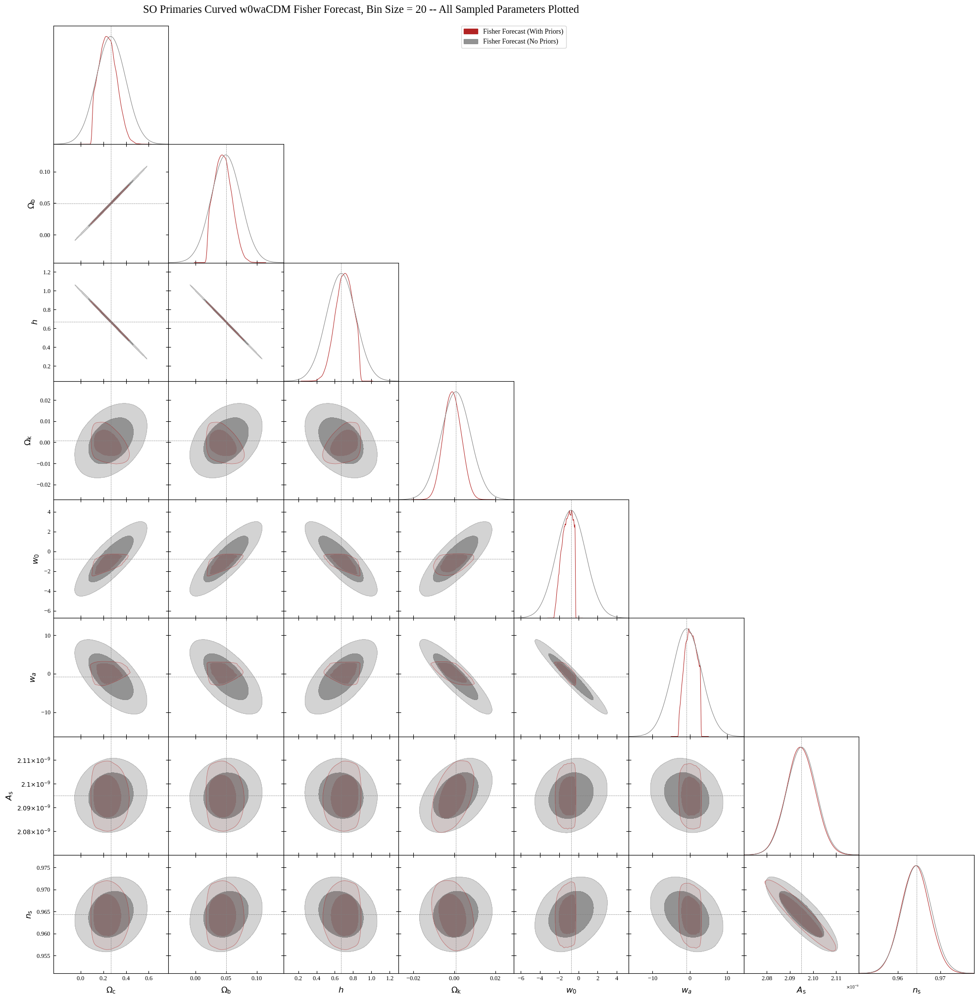

total_time:  0:05:28.048102


In [27]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=curved_w0waCDM_cosmology,
    lens_data=DESI_lens_data,
    source_data=HSC_dist_0_3,
    binsize=20,
    l_min =40,
    n_ell = 5000,
    f_sky = 0.4,
    magnification_bias_lenses = 0.8,
    linear_emulator = None,
    boost_emulator = None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=DESI_shot_noise,
    shape_noise_source=DESI_shape_noise,
    desired_spectra=['TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'Omega_k', 'w0', 'wa', 'A_s', 'n_s']
params_to_plot = ['Omega_m', 'h', 'Omega_k', 'w0', 'wa']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Fisher Matrices/Curved_w0waCDM_Primaries_Binsize=20.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h Omega_k w0 wa A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, Omega_k, w0, wa, A_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Covariance Matrices/Curved_w0waCDM_Primaries_Binsize=20.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h Omega_k w0 wa A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, Omega_k, w0, wa, A_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="SO Primaries Curved w0waCDM Fisher Forecast, Bin Size = 20",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

g2 = forecaster_c1.plot_with_cobaya_overlay(
    title="SO Primaries Curved w0waCDM Fisher Forecast, Bin Size = 20 -- All Sampled Parameters Plotted",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = True,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

#### Lensing Ratios and Primaries

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3192\pm 0.0094$ | $\Omega_m = 0.319^{+0.018}_{-0.018}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3192\pm 0.0094$ | $\Omega_m = 0.319^{+0.018}_{-0.018}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6682\pm 0.0096$ | $h = 0.668^{+0.019}_{-0.019}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6682\pm 0.0096$ | $h = 0.668^{+0.019}_{-0.019}$ |
| --- | --- | --- | --- |
| **$\Omega_k$** | Fisher Forecast (With Priors) | $\Omega_k = 0.0008\pm 0.0020$ | $\Omega_k = 0.0008^{+0.0039}_{-0.0040}$ |
|  | Fisher Forecast (No Priors) | $\Omega_k = 0.0008\pm 0.0020$ | $\Omega_k = 0.0008^{+0.0040}_{-0.0039}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -0.762\pm 0.050$ | $w_0 = -0.762^{+0.099}_{-0.098}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.762\pm 0.050$ | $w_0 = -0.762^{+0.099}_{-0.099}$ |
| --- | --- | --- | --- |
| **$w_a$** | Fisher Forecast (With Priors) | $w_a = -0.81\pm 0.25$ | $w_a = -0.81^{+0.49}_{-0.49}$ |
|  | Fisher Forecast (No Priors) | $w_a = -0.81\pm 0.25$ | $w_a = -0.81^{+0.49}_{-0.49}$ |
| --- | --- | --- | --- |

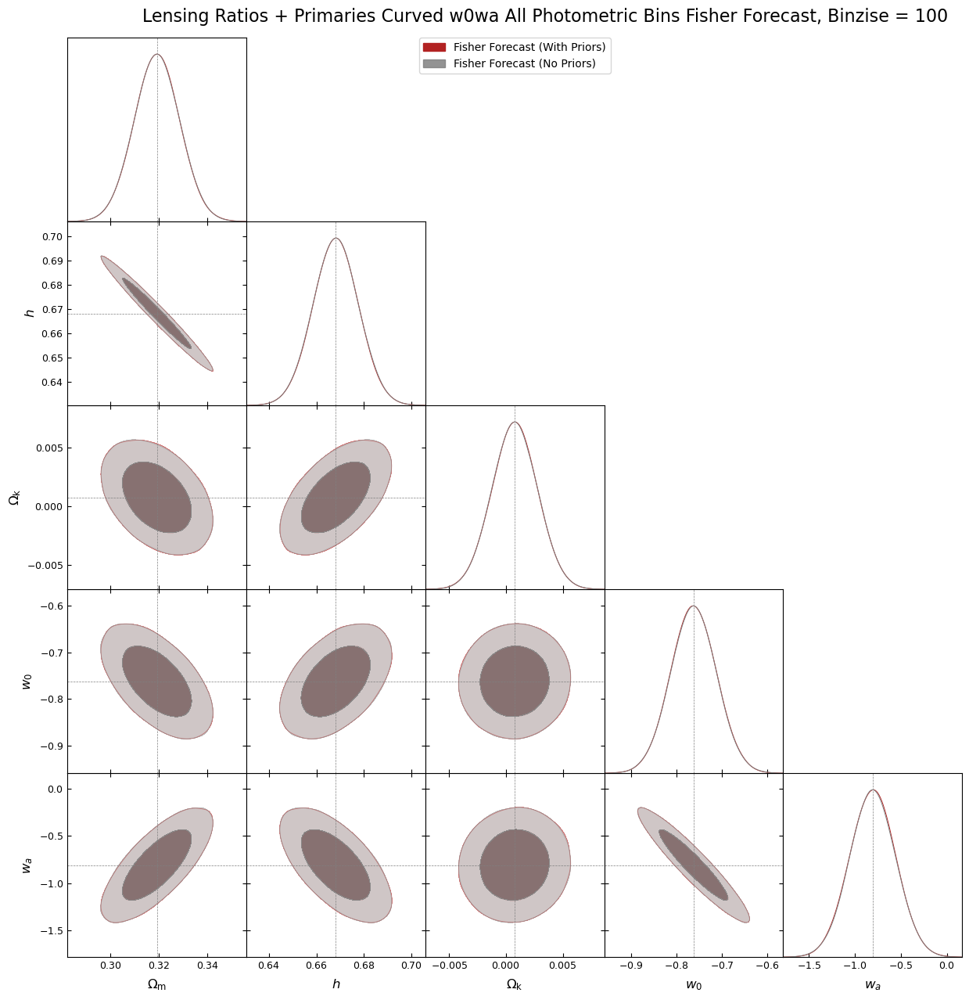

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.2680\pm 0.0080$ | $\Omega_{c} = 0.268^{+0.016}_{-0.016}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.2680\pm 0.0080$ | $\Omega_{c} = 0.268^{+0.016}_{-0.016}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.0497\pm 0.0014$ | $\Omega_{b} = 0.0497^{+0.0028}_{-0.0028}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.0497\pm 0.0014$ | $\Omega_{b} = 0.0497^{+0.0028}_{-0.0028}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6682\pm 0.0096$ | $h = 0.668^{+0.019}_{-0.019}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6682\pm 0.0096$ | $h = 0.668^{+0.019}_{-0.019}$ |
| --- | --- | --- | --- |
| **$\Omega_k$** | Fisher Forecast (With Priors) | $\Omega_k = 0.0008\pm 0.0020$ | $\Omega_k = 0.0008^{+0.0039}_{-0.0040}$ |
|  | Fisher Forecast (No Priors) | $\Omega_k = 0.0008\pm 0.0020$ | $\Omega_k = 0.0008^{+0.0040}_{-0.0040}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -0.762\pm 0.050$ | $w_0 = -0.762^{+0.098}_{-0.098}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.762\pm 0.050$ | $w_0 = -0.762^{+0.099}_{-0.099}$ |
| --- | --- | --- | --- |
| **$w_a$** | Fisher Forecast (With Priors) | $w_a = -0.81\pm 0.25$ | $w_a = -0.81^{+0.49}_{-0.49}$ |
|  | Fisher Forecast (No Priors) | $w_a = -0.81\pm 0.25$ | $w_a = -0.81^{+0.49}_{-0.49}$ |
| --- | --- | --- | --- |

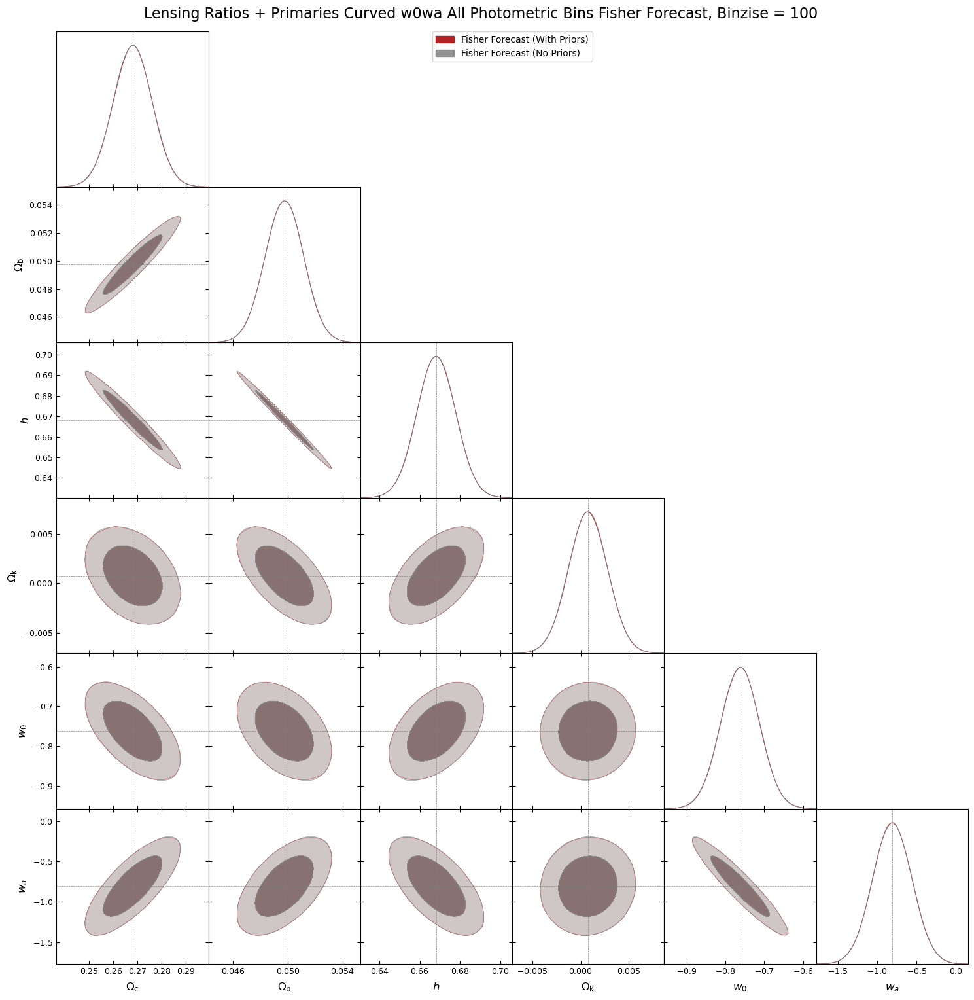

total_time:  0:08:58.301804


In [57]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=curved_w0waCDM_cosmology,
    lens_data=bgs_combined_array,
    source_data=HSC_dist_0_3,
    binsize=100,
    l_min =40,
    n_ell = 5000,
    f_sky = 0.4,
    magnification_bias_lenses = 0.8,
    linear_emulator = None,
    boost_emulator = None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=HSC_shape_noise,
    desired_spectra=['CG', 'GL', 'TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'Omega_k', 'w0', 'wa']
params_to_plot = ['Omega_m', 'h', 'Omega_k', 'w0', 'wa']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Fisher Matrices/Curved_w0waCDM_LRP_Photo_BGS_HSC_Binsize=100.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h Omega_k w0 wa A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, Omega_k, w0, wa, A_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Covariance Matrices/Curved_w0waCDM_LRP_Photo_BGS_HSC_Binsize=100.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h Omega_k w0 wa A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, Omega_k, w0, wa, A_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios + Primaries Curved w0wa All Photometric Bins Fisher Forecast, Binzise = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

g = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios + Primaries Curved w0wa All Photometric Bins Fisher Forecast, Binzise = 100",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_m$** | Fisher Forecast (With Priors) | $\Omega_m = 0.3192\pm 0.0090$ | $\Omega_m = 0.319^{+0.018}_{-0.018}$ |
|  | Fisher Forecast (No Priors) | $\Omega_m = 0.3192\pm 0.0090$ | $\Omega_m = 0.319^{+0.018}_{-0.018}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6682\pm 0.0092$ | $h = 0.668^{+0.018}_{-0.018}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6682\pm 0.0093$ | $h = 0.668^{+0.018}_{-0.018}$ |
| --- | --- | --- | --- |
| **$\Omega_k$** | Fisher Forecast (With Priors) | $\Omega_k = 0.0008\pm 0.0019$ | $\Omega_k = 0.0008^{+0.0038}_{-0.0038}$ |
|  | Fisher Forecast (No Priors) | $\Omega_k = 0.0008\pm 0.0019$ | $\Omega_k = 0.0008^{+0.0038}_{-0.0038}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -0.762\pm 0.048$ | $w_0 = -0.762^{+0.095}_{-0.095}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.762\pm 0.048$ | $w_0 = -0.762^{+0.095}_{-0.095}$ |
| --- | --- | --- | --- |
| **$w_a$** | Fisher Forecast (With Priors) | $w_a = -0.81\pm 0.24$ | $w_a = -0.81^{+0.46}_{-0.47}$ |
|  | Fisher Forecast (No Priors) | $w_a = -0.81\pm 0.24$ | $w_a = -0.81^{+0.46}_{-0.46}$ |
| --- | --- | --- | --- |

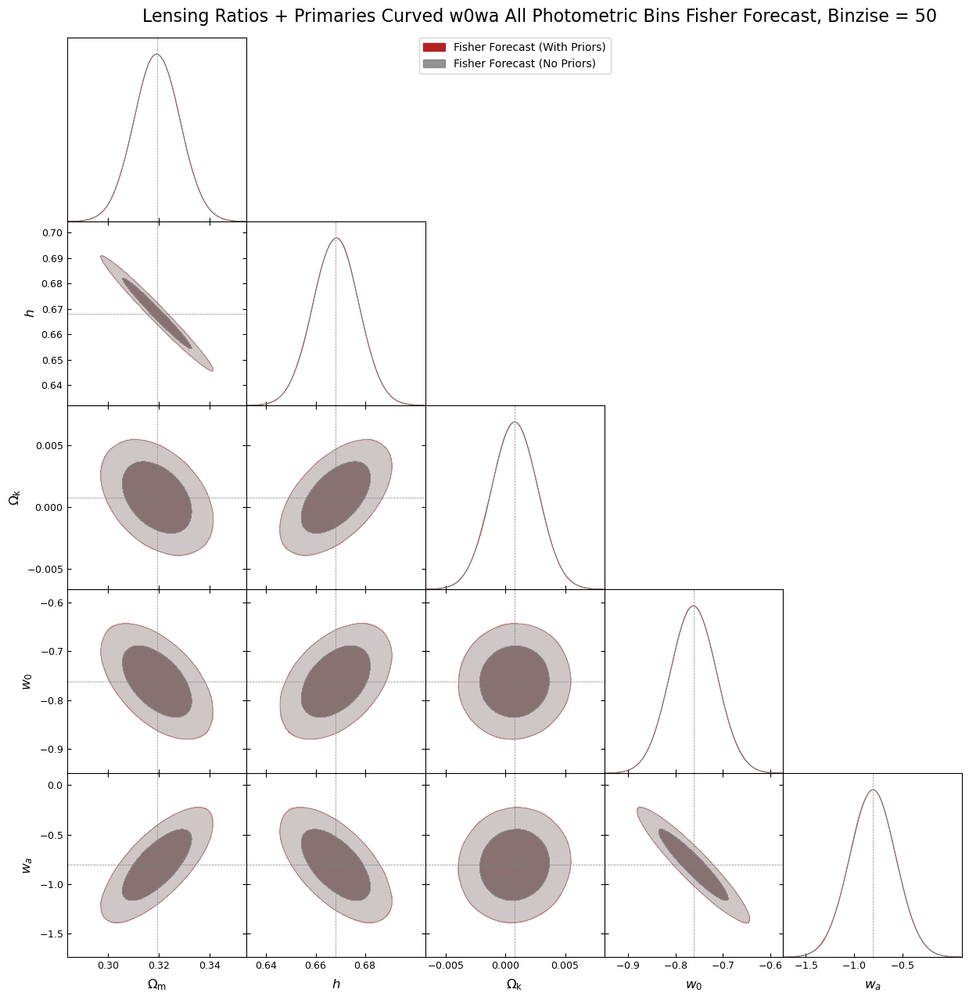

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


| Parameter | Dataset / Model | 1-Sigma (68%) | 2-Sigma (95%) |
| :--- | :--- | :---: | :---: |
| **$\Omega_{c}$** | Fisher Forecast (With Priors) | $\Omega_{c} = 0.2680\pm 0.0077$ | $\Omega_{c} = 0.268^{+0.015}_{-0.015}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{c} = 0.2680\pm 0.0077$ | $\Omega_{c} = 0.268^{+0.015}_{-0.015}$ |
| --- | --- | --- | --- |
| **$\Omega_{b}$** | Fisher Forecast (With Priors) | $\Omega_{b} = 0.0497\pm 0.0014$ | $\Omega_{b} = 0.0497^{+0.0027}_{-0.0027}$ |
|  | Fisher Forecast (No Priors) | $\Omega_{b} = 0.0497\pm 0.0014$ | $\Omega_{b} = 0.0497^{+0.0027}_{-0.0027}$ |
| --- | --- | --- | --- |
| **$h$** | Fisher Forecast (With Priors) | $h = 0.6682\pm 0.0093$ | $h = 0.668^{+0.018}_{-0.018}$ |
|  | Fisher Forecast (No Priors) | $h = 0.6682\pm 0.0093$ | $h = 0.668^{+0.018}_{-0.018}$ |
| --- | --- | --- | --- |
| **$\Omega_k$** | Fisher Forecast (With Priors) | $\Omega_k = 0.0008\pm 0.0019$ | $\Omega_k = 0.0008^{+0.0038}_{-0.0038}$ |
|  | Fisher Forecast (No Priors) | $\Omega_k = 0.0008\pm 0.0019$ | $\Omega_k = 0.0008^{+0.0038}_{-0.0038}$ |
| --- | --- | --- | --- |
| **$w_0$** | Fisher Forecast (With Priors) | $w_0 = -0.762\pm 0.048$ | $w_0 = -0.762^{+0.095}_{-0.095}$ |
|  | Fisher Forecast (No Priors) | $w_0 = -0.762\pm 0.048$ | $w_0 = -0.762^{+0.095}_{-0.095}$ |
| --- | --- | --- | --- |
| **$w_a$** | Fisher Forecast (With Priors) | $w_a = -0.81\pm 0.24$ | $w_a = -0.81^{+0.47}_{-0.46}$ |
|  | Fisher Forecast (No Priors) | $w_a = -0.81\pm 0.24$ | $w_a = -0.81^{+0.46}_{-0.47}$ |
| --- | --- | --- | --- |

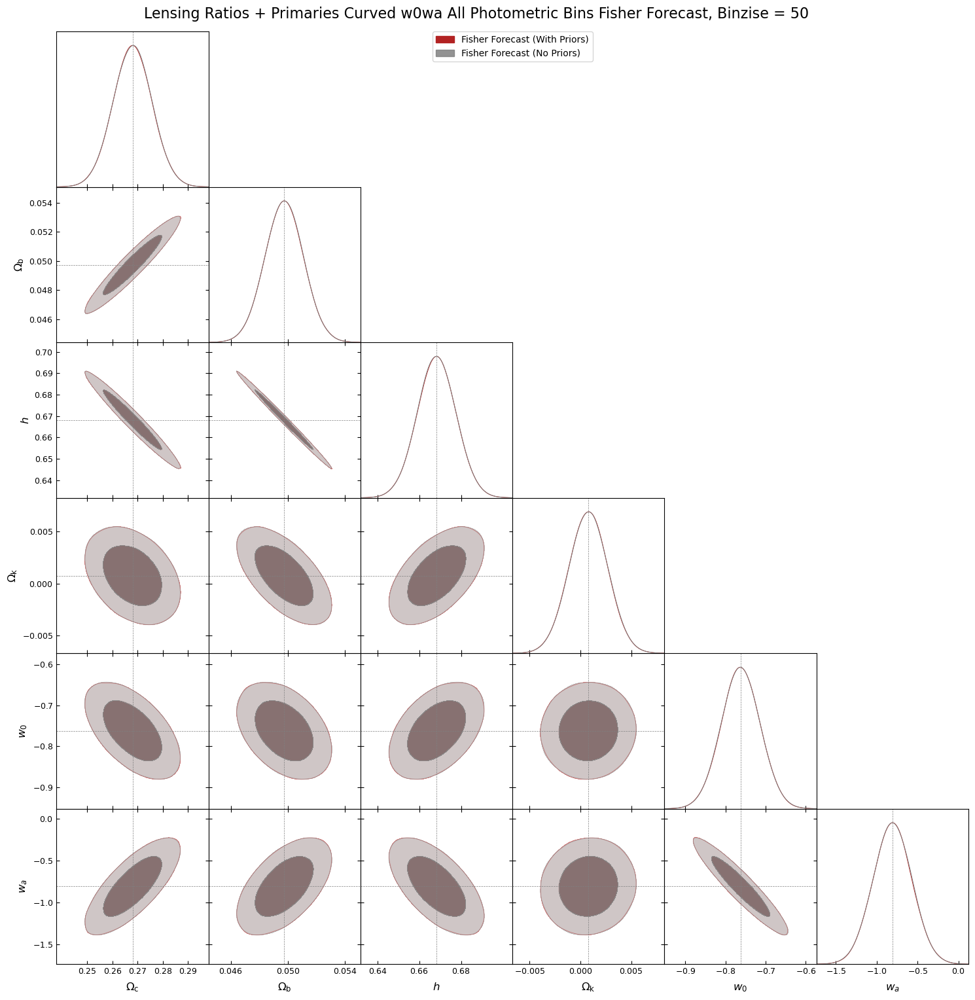

total_time:  0:09:18.215899


In [58]:
start_time = time.time()

# instantiate forecaster
forecaster_c1 = FisherForecaster(
    cosmology=curved_w0waCDM_cosmology,
    lens_data=bgs_combined_array,
    source_data=HSC_dist_0_3,
    binsize=50,
    l_min =40,
    n_ell = 5000,
    f_sky = 0.4,
    magnification_bias_lenses = 0.8,
    linear_emulator = None,
    boost_emulator = None,
    cmb_noise_kk=SO_cmb_noise_kk,
    cmb_noise_TT=SO_goal_cmb_noise_TT,
    cmb_noise_EE=SO_goal_cmb_noise_EE,
    shot_noise_lens=BGS_shot_noise,
    shape_noise_source=HSC_shape_noise,
    desired_spectra=['CG', 'GL', 'TT', 'EE'],
    cmb_primaries=True,
    z_max=6,
    n_chi=1024
)

# list of all parameters being analyzed
params_to_sample = ['Omega_c', 'Omega_b', 'h', 'Omega_k', 'w0', 'wa']
params_to_plot = ['Omega_m', 'h', 'Omega_k', 'w0', 'wa']

# compute the raw data-only Fisher matrix (populates internally for sampling)
F_raw_c1, cov_raw_c1 = forecaster_c1.make_fisher_matrix(desired_params=params_to_sample)

# save matrices
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Fisher Matrices/Curved_w0waCDM_LRP_Photo_BGS_HSC_Binsize=50.txt', 
    F_raw_c1, 
    header='Omega_c Omega_b h Omega_k w0 wa A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, Omega_k, w0, wa, A_s, n_s\n'
)
np.savetxt(
    'Fisher Forecasts/Binsize Tests/Covariance Matrices/Curved_w0waCDM_LRP_Photo_BGS_HSC_Binsize=50.txt', 
    cov_raw_c1, 
    header='Omega_c Omega_b h Omega_k w0 wa A_s n_s',
    comments='# Fiducial parameters: Omega_c, Omega_b, h, Omega_k, w0, wa, A_s, n_s\n'
)

# Call the unified class method to load, sample, overlay, and plot everything
g = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios + Primaries Curved w0wa All Photometric Bins Fisher Forecast, Binzise = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_plot,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

g = forecaster_c1.plot_with_cobaya_overlay(
    title="Lensing Ratios + Primaries Curved w0wa All Photometric Bins Fisher Forecast, Binzise = 50",
    cobaya_chain_dir=None,
    uniform_priors=uniform_prior,
    plot_params=params_to_sample,
    overlay_priorless=True,
    save_plot = False,
    print_summary = True,
    plot_prior = False
)

plt.show()

end_time = time.time()
total_time = end_time - start_time
total_time = datetime.timedelta(seconds=total_time)
print("total_time: ", total_time)

In [ ]:
# REPLACE